***
# Supervised Learning : Exploring Parametric Accelerated Failure Time Models for Estimating Lifetimes in Survival Data

***
### [**John Pauline Pineda**](https://github.com/JohnPaulinePineda) <br> <br> *August 3, 2024*
***

* [**1. Table of Contents**](#TOC)
    * [1.1 Data Background](#1.1)
    * [1.2 Data Description](#1.2)
    * [1.3 Data Quality Assessment](#1.3)
    * [1.4 Data Preprocessing](#1.4)
        * [1.4.1 Data Cleaning](#1.4.1)
        * [1.4.2 Missing Data Imputation](#1.4.2)
        * [1.4.3 Outlier Treatment](#1.4.3)
        * [1.4.4 Collinearity](#1.4.4)
        * [1.4.5 Shape Transformation](#1.4.5)
        * [1.4.6 Centering and Scaling](#1.4.6)
        * [1.4.7 Data Encoding](#1.4.7)
        * [1.4.8 Preprocessed Data Description](#1.4.8)
    * [1.5 Data Exploration](#1.5)
        * [1.5.1 Exploratory Data Analysis](#1.5.1)
        * [1.5.2 Hypothesis Testing](#1.5.2)
    * [1.6 Predictive Model Development](#1.6)
        * [1.6.1 Premodelling Data Description](#1.6.1)
        * [1.6.2 Weibull Accelerated Failure Time Model](#1.6.2)
        * [1.6.3 Log-Normal Accelerated Failure Time Model](#1.6.3)
        * [1.6.4 Log-Logistic Accelerated Failure Time Model](#1.6.4)
    * [1.7 Consolidated Findings](#1.7)
* [**2. Summary**](#Summary)   
* [**3. References**](#References)

***

# 1. Table of Contents <a class="anchor" id="TOC"></a>

This project explores parametric **Accelerated Failure Time** models with error distributions following the **Weibull**, **Log-Normal** and **Log-Logistic** distributions using various helpful packages in <mark style="background-color: #CCECFF"><b>Python</b></mark> to analyze time-to-event data by directly modelling  the time until an event of interest occurs. The resulting predictions derived from the candidate models were evaluated in terms of their discrimination power using the Harrel's concordance index metric, and their model fit using the brier score and mean absolute error (MAE) metrics. Additionally, feature impact on model output were estimated using **Shapley Additive Explanations**. All results were consolidated in a [<span style="color: #FF0000"><b>Summary</b></span>](#Summary) presented at the end of the document. 

[Survival Analysis](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) deals with the analysis of time-to-event data. It focuses on the expected duration of time until one or more events of interest occur, such as death, failure, or relapse. This type of analysis is used to study and model the time until the occurrence of an event, taking into account that the event might not have occurred for all subjects during the study period. Several key aspects of survival analysis include the survival function which refers to the probability that an individual survives longer than a certain time, hazard function which describes the instantaneous rate at which events occur, given no prior event, and censoring pertaining to a condition where the event of interest has not occurred for some subjects during the observation period.

[Right-Censored Survival Data](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) occurs when the event of interest has not happened for some subjects by the end of the study period or the last follow-up time. This type of censoring is common in survival analysis because not all individuals may experience the event before the study ends, or they might drop out or be lost to follow-up. Right-censored data is crucial in survival analysis as it allows the inclusion of all subjects in the analysis, providing more accurate and reliable estimates.

[Accelerated Failure Time Models](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) are a class of survival analysis models used to analyze time-to-event data by directly modelling the survival time itself. An AFT model assumes that the effect of covariates accelerates or decelerates the life time of an event by some constant factor. The mathematical equation is represented by the logarithm of the survival time being equal to the sum of the vector of covariates multiplied to the vector of regression coefficients; and the product of the scale parameter and a random variable with a specified distribution. In an AFT model, the coefficients represent the multiplicative effect on the survival time. An exponentiated regression coefficient greater than one prolongs survival time, while a value less than one shortens it. The scale parameter determines the spread or variability of survival times. AFT models assume that the effect of covariates on survival time is multiplicative and that the survival times can be transformed to follow a specific distribution.

## 1.1. Data Background <a class="anchor" id="1.1"></a>

An open [Liver Cirrhosis Dataset](https://www.kaggle.com/code/arjunbhaybhang/liver-cirrhosis-prediction-with-xgboost-eda) from [Kaggle](https://www.kaggle.com/) (with all credits attributed to [Arjun Bhaybhang](https://www.kaggle.com/arjunbhaybhang)) was used for the analysis as consolidated from the following primary sources: 
1. Reference Book entitled **Counting Processes and Survival Analysis** from [Wiley](https://onlinelibrary.wiley.com/doi/book/10.1002/9781118150672)
2. Research Paper entitled **Efficacy of Liver Transplantation in Patients with Primary Biliary Cirrhosis** from the [New England Journal of Medicine](https://www.nejm.org/doi/abs/10.1056/NEJM198906293202602)
3. Research Paper entitled **Prognosis in Primary Biliary Cirrhosis: Model for Decision Making** from the [Hepatology](https://aasldpubs.onlinelibrary.wiley.com/doi/10.1002/hep.1840100102)

This study hypothesized that the evaluated drug, liver profile test biomarkers and various clinicopathological characteristics influence liver cirrhosis survival between patients.

The event status and survival duration variables for the study are:
* <span style="color: #FF0000">Status</span> - Status of the patient (C, censored | CL, censored due to liver transplant | D, death)
* <span style="color: #FF0000">N_Days</span> - Number of days between registration and the earlier of death, transplantation, or study analysis time (1986)

The predictor variables for the study are:
* <span style="color: #FF0000">Drug</span> - Type of administered drug to the patient (D-Penicillamine | Placebo)
* <span style="color: #FF0000">Age</span> - Patient's age (Days)
* <span style="color: #FF0000">Sex</span> - Patient's sex (Male | Female)
* <span style="color: #FF0000">Ascites</span> - Presence of ascites (Yes | No)
* <span style="color: #FF0000">Hepatomegaly</span> - Presence of hepatomegaly (Yes | No)
* <span style="color: #FF0000">Spiders</span> - Presence of spiders (Yes | No)
* <span style="color: #FF0000">Edema</span> - Presence of edema ( N, No edema and no diuretic therapy for edema | S, Edema present without diuretics or edema resolved by diuretics) | Y, Edema despite diuretic therapy)
* <span style="color: #FF0000">Bilirubin</span> - Serum bilirubin (mg/dl)
* <span style="color: #FF0000">Cholesterol</span> - Serum cholesterol (mg/dl)
* <span style="color: #FF0000">Albumin</span> - Albumin (gm/dl)
* <span style="color: #FF0000">Copper</span> - Urine copper (ug/day)
* <span style="color: #FF0000">Alk_Phos</span> - Alkaline phosphatase (U/liter)
* <span style="color: #FF0000">SGOT</span> - Serum glutamic-oxaloacetic transaminase (U/ml)
* <span style="color: #FF0000">Triglycerides</span> - Triglicerides (mg/dl)
* <span style="color: #FF0000">Platelets</span> - Platelets (cubic ml/1000)
* <span style="color: #FF0000">Prothrombin</span> - Prothrombin time (seconds)
* <span style="color: #FF0000">Stage</span> - Histologic stage of disease (Stage I | Stage II | Stage III | Stage IV)


## 1.2. Data Description <a class="anchor" id="1.2"></a>

1. The dataset is comprised of:
    * **418 rows** (observations)
    * **20 columns** (variables)
        * **1/20 metadata** (object)
            * <span style="color: #FF0000">ID</span>
        * **2/20 event | duration** (object | numeric)
             * <span style="color: #FF0000">Status</span>
             * <span style="color: #FF0000">N_Days</span>
        * **10/20 predictor** (numeric)
             * <span style="color: #FF0000">Age</span>
             * <span style="color: #FF0000">Bilirubin</span>
             * <span style="color: #FF0000">Cholesterol</span>
             * <span style="color: #FF0000">Albumin</span>
             * <span style="color: #FF0000">Copper</span>
             * <span style="color: #FF0000">Alk_Phos</span>
             * <span style="color: #FF0000">SGOT</span>
             * <span style="color: #FF0000">Triglycerides</span>
             * <span style="color: #FF0000">Platelets</span>
             * <span style="color: #FF0000">Prothrombin</span>
        * **7/20 predictor** (object)
             * <span style="color: #FF0000">Drug</span>
             * <span style="color: #FF0000">Sex</span>
             * <span style="color: #FF0000">Ascites</span>
             * <span style="color: #FF0000">Hepatomegaly</span>
             * <span style="color: #FF0000">Spiders</span>
             * <span style="color: #FF0000">Edema</span>
             * <span style="color: #FF0000">Stage</span>

In [1]:
##################################
# Loading Python Libraries
##################################
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import itertools
import os
%matplotlib inline

from operator import add,mul,truediv
from sklearn.model_selection import train_test_split
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import KFold
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_absolute_error, brier_score_loss

from statsmodels.nonparametric.smoothers_lowess import lowess
from scipy import stats
from scipy.stats import ttest_ind, chi2_contingency

from lifelines import KaplanMeierFitter
from lifelines.fitters.weibull_fitter import WeibullFitter
from lifelines.fitters.log_normal_fitter import LogNormalFitter
from lifelines.fitters.log_logistic_fitter import LogLogisticFitter
from lifelines.fitters.weibull_aft_fitter import WeibullAFTFitter
from lifelines.fitters.log_normal_aft_fitter import LogNormalAFTFitter
from lifelines.fitters.log_logistic_aft_fitter import LogLogisticAFTFitter
from lifelines.utils import concordance_index
from lifelines.statistics import logrank_test
from lifelines.plotting import qq_plot
import shap

import warnings
warnings.filterwarnings('ignore')

In [2]:
##################################
# Defining file paths
##################################
DATASETS_ORIGINAL_PATH = r"datasets\original"

In [3]:
##################################
# Loading the dataset
# from the DATASETS_ORIGINAL_PATH
##################################
cirrhosis_survival = pd.read_csv(os.path.join("..", DATASETS_ORIGINAL_PATH, "Cirrhosis_Survival.csv"))

In [4]:
##################################
# Performing a general exploration of the dataset
##################################
print('Dataset Dimensions: ')
display(cirrhosis_survival.shape)

Dataset Dimensions: 


(418, 20)

In [5]:
##################################
# Listing the column names and data types
##################################
print('Column Names and Data Types:')
display(cirrhosis_survival.dtypes)

Column Names and Data Types:


ID                 int64
N_Days             int64
Status            object
Drug              object
Age                int64
Sex               object
Ascites           object
Hepatomegaly      object
Spiders           object
Edema             object
Bilirubin        float64
Cholesterol      float64
Albumin          float64
Copper           float64
Alk_Phos         float64
SGOT             float64
Tryglicerides    float64
Platelets        float64
Prothrombin      float64
Stage            float64
dtype: object

In [6]:
##################################
# Taking a snapshot of the dataset
##################################
cirrhosis_survival.head()

,ID,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,1,400,D,D-penicillamine,21464,F,Y,Y,Y,Y,14.5,261.0,2.60,156.0,1718.0,137.95,172.0,190.0,12.2,4.0
1,2,4500,C,D-penicillamine,20617,F,N,Y,Y,N,1.1,302.0,4.14,54.0,7394.8,113.52,88.0,221.0,10.6,3.0
2,3,1012,D,D-penicillamine,25594,M,N,N,N,S,1.4,176.0,3.48,210.0,516.0,96.10,55.0,151.0,12.0,4.0
3,4,1925,D,D-penicillamine,19994,F,N,Y,Y,S,1.8,244.0,2.54,64.0,6121.8,60.63,92.0,183.0,10.3,4.0
4,5,1504,CL,Placebo,13918,F,N,Y,Y,N,3.4,279.0,3.53,143.0,671.0,113.15,72.0,136.0,10.9,3.0


In [7]:
##################################
# Taking the ID column as the index
##################################
cirrhosis_survival.set_index(['ID'], inplace=True)

In [8]:
##################################
# Changing the data type for Stage
##################################
cirrhosis_survival['Stage'] = cirrhosis_survival['Stage'].astype('object')

In [9]:
##################################
# Changing the data type for Status
##################################
cirrhosis_survival['Status'] = cirrhosis_survival['Status'].replace({'C':False, 'CL':False, 'D':True}) 

In [10]:
##################################
# Performing a general exploration of the numeric variables
##################################
print('Numeric Variable Summary:')
display(cirrhosis_survival.describe(include='number').transpose())

Numeric Variable Summary:


,count,mean,std,min,25%,50%,75%,max
N_Days,418.0,1917.782297,1104.672992,41.00,1092.7500,1730.00,2613.50,4795.00
Age,418.0,18533.351675,3815.845055,9598.00,15644.5000,18628.00,21272.50,28650.00
Bilirubin,418.0,3.220813,4.407506,0.30,0.8000,1.40,3.40,28.00
Cholesterol,284.0,369.510563,231.944545,120.00,249.5000,309.50,400.00,1775.00
Albumin,418.0,3.497440,0.424972,1.96,3.2425,3.53,3.77,4.64
Copper,310.0,97.648387,85.613920,4.00,41.2500,73.00,123.00,588.00
Alk_Phos,312.0,1982.655769,2140.388824,289.00,871.5000,1259.00,1980.00,13862.40
SGOT,312.0,122.556346,56.699525,26.35,80.6000,114.70,151.90,457.25
Tryglicerides,282.0,124.702128,65.148639,33.00,84.2500,108.00,151.00,598.00
Platelets,407.0,257.024570,98.325585,62.00,188.5000,251.00,318.00,721.00


In [11]:
##################################
# Performing a general exploration of the object variables
##################################
print('object Variable Summary:')
display(cirrhosis_survival.describe(include='object').transpose())

object Variable Summary:


,count,unique,top,freq
Drug,312,2,D-penicillamine,158
Sex,418,2,F,374
Ascites,312,2,N,288
Hepatomegaly,312,2,Y,160
Spiders,312,2,N,222
Edema,418,3,N,354
Stage,412.0,4.0,3.0,155.0


## 1.3. Data Quality Assessment <a class="anchor" id="1.3"></a>

Data quality findings based on assessment are as follows:
1. No duplicated rows observed.
2. Missing data noted for 12 variables with Null.Count>0 and Fill.Rate<1.0.
    * <span style="color: #FF0000">Tryglicerides</span>: Null.Count = 136, Fill.Rate = 0.675
    * <span style="color: #FF0000">Cholesterol</span>: Null.Count = 134, Fill.Rate = 0.679
    * <span style="color: #FF0000">Copper</span>: Null.Count = 108, Fill.Rate = 0.741
    * <span style="color: #FF0000">Drug</span>: Null.Count = 106, Fill.Rate = 0.746
    * <span style="color: #FF0000">Ascites</span>: Null.Count = 106, Fill.Rate = 0.746
    * <span style="color: #FF0000">Hepatomegaly</span>: Null.Count = 106, Fill.Rate = 0.746
    * <span style="color: #FF0000">Spiders</span>: Null.Count = 106, Fill.Rate = 0.746
    * <span style="color: #FF0000">Alk_Phos</span>: Null.Count = 106, Fill.Rate = 0.746
    * <span style="color: #FF0000">SGOT</span>: Null.Count = 106, Fill.Rate = 0.746
    * <span style="color: #FF0000">Platelets</span>: Null.Count = 11, Fill.Rate = 0.974
    * <span style="color: #FF0000">Stage</span>: Null.Count = 6, Fill.Rate = 0.986
    * <span style="color: #FF0000">Prothrombin</span>: Null.Count = 2, Fill.Rate = 0.995
3. 142 observations noted with at least 1 missing data. From this number, 106 observations reported high Missing.Rate>0.4.
    * 91 Observations: Missing.Rate = 0.450 (9 columns)
    * 15 Observations: Missing.Rate = 0.500 (10 columns)
    * 28 Observations: Missing.Rate = 0.100 (2 columns)
    * 8 Observations: Missing.Rate = 0.050 (1 column)
4. Low variance observed for 3 variables with First.Second.Mode.Ratio>5.
    * <span style="color: #FF0000">Ascites</span>: First.Second.Mode.Ratio = 12.000
    * <span style="color: #FF0000">Sex</span>: First.Second.Mode.Ratio = 8.500
    * <span style="color: #FF0000">Edema</span>: First.Second.Mode.Ratio = 8.045
5. No low variance observed for any variable with Unique.Count.Ratio>10.
6. High and marginally high skewness observed for 2 variables with Skewness>3 or Skewness<(-3).
    * <span style="color: #FF0000">Cholesterol</span>: Skewness = +3.409
    * <span style="color: #FF0000">Alk_Phos</span>: Skewness = +2.993

In [12]:
##################################
# Counting the number of duplicated rows
##################################
cirrhosis_survival.duplicated().sum()

0

In [13]:
##################################
# Gathering the data types for each column
##################################
data_type_list = list(cirrhosis_survival.dtypes)

In [14]:
##################################
# Gathering the variable names for each column
##################################
variable_name_list = list(cirrhosis_survival.columns)

In [15]:
##################################
# Gathering the number of observations for each column
##################################
row_count_list = list([len(cirrhosis_survival)] * len(cirrhosis_survival.columns))

In [16]:
##################################
# Gathering the number of missing data for each column
##################################
null_count_list = list(cirrhosis_survival.isna().sum(axis=0))

In [17]:
##################################
# Gathering the number of non-missing data for each column
##################################
non_null_count_list = list(cirrhosis_survival.count())

In [18]:
##################################
# Gathering the missing data percentage for each column
##################################
fill_rate_list = map(truediv, non_null_count_list, row_count_list)

In [19]:
##################################
# Formulating the summary
# for all columns
##################################
all_column_quality_summary = pd.DataFrame(zip(variable_name_list,
                                              data_type_list,
                                              row_count_list,
                                              non_null_count_list,
                                              null_count_list,
                                              fill_rate_list), 
                                        columns=['Column.Name',
                                                 'Column.Type',
                                                 'Row.Count',
                                                 'Non.Null.Count',
                                                 'Null.Count',                                                 
                                                 'Fill.Rate'])
display(all_column_quality_summary)

,Column.Name,Column.Type,Row.Count,Non.Null.Count,Null.Count,Fill.Rate
0,N_Days,int64,418,418,0,1.000000
1,Status,bool,418,418,0,1.000000
2,Drug,object,418,312,106,0.746411
3,Age,int64,418,418,0,1.000000
4,Sex,object,418,418,0,1.000000
5,Ascites,object,418,312,106,0.746411
6,Hepatomegaly,object,418,312,106,0.746411
7,Spiders,object,418,312,106,0.746411
8,Edema,object,418,418,0,1.000000
9,Bilirubin,float64,418,418,0,1.000000


In [20]:
##################################
# Counting the number of columns
# with Fill.Rate < 1.00
##################################
print('Number of Columns with Missing Data:', str(len(all_column_quality_summary[(all_column_quality_summary['Fill.Rate']<1)])))

Number of Columns with Missing Data: 12


In [21]:
##################################
# Identifying the columns
# with Fill.Rate < 1.00
##################################
print('Columns with Missing Data:')
display(all_column_quality_summary[(all_column_quality_summary['Fill.Rate']<1)].sort_values(by=['Fill.Rate'], ascending=True))

Columns with Missing Data:


,Column.Name,Column.Type,Row.Count,Non.Null.Count,Null.Count,Fill.Rate
15,Tryglicerides,float64,418,282,136,0.674641
10,Cholesterol,float64,418,284,134,0.679426
12,Copper,float64,418,310,108,0.741627
2,Drug,object,418,312,106,0.746411
5,Ascites,object,418,312,106,0.746411
6,Hepatomegaly,object,418,312,106,0.746411
7,Spiders,object,418,312,106,0.746411
13,Alk_Phos,float64,418,312,106,0.746411
14,SGOT,float64,418,312,106,0.746411
16,Platelets,float64,418,407,11,0.973684


In [22]:
##################################
# Identifying the rows
# with Fill.Rate < 1.00
##################################
column_low_fill_rate = all_column_quality_summary[(all_column_quality_summary['Fill.Rate']<1.00)]

In [23]:
##################################
# Gathering the metadata labels for each observation
##################################
row_metadata_list = cirrhosis_survival.index.values.tolist()

In [24]:
##################################
# Gathering the number of columns for each observation
##################################
column_count_list = list([len(cirrhosis_survival.columns)] * len(cirrhosis_survival))

In [25]:
##################################
# Gathering the number of missing data for each row
##################################
null_row_list = list(cirrhosis_survival.isna().sum(axis=1))

In [26]:
##################################
# Gathering the missing data percentage for each column
##################################
missing_rate_list = map(truediv, null_row_list, column_count_list)

In [27]:
##################################
# Exploring the rows
# for missing data
##################################
all_row_quality_summary = pd.DataFrame(zip(row_metadata_list,
                                           column_count_list,
                                           null_row_list,
                                           missing_rate_list), 
                                        columns=['Row.Name',
                                                 'Column.Count',
                                                 'Null.Count',                                                 
                                                 'Missing.Rate'])
display(all_row_quality_summary)

,Row.Name,Column.Count,Null.Count,Missing.Rate
0,1,19,0,0.000000
1,2,19,0,0.000000
2,3,19,0,0.000000
3,4,19,0,0.000000
4,5,19,0,0.000000
...,...,...,...,...
413,414,19,9,0.473684
414,415,19,9,0.473684
415,416,19,9,0.473684
416,417,19,9,0.473684


In [28]:
##################################
# Counting the number of rows
# with Fill.Rate < 1.00
##################################
print('Number of Rows with Missing Data:',str(len(all_row_quality_summary[all_row_quality_summary['Missing.Rate']>0])))

Number of Rows with Missing Data: 142


In [29]:
##################################
# Identifying the rows
# with Fill.Rate < 1.00
##################################
print('Rows with Missing Data:')
display(all_row_quality_summary[all_row_quality_summary['Missing.Rate']>0])

Rows with Missing Data:


,Row.Name,Column.Count,Null.Count,Missing.Rate
5,6,19,1,0.052632
13,14,19,2,0.105263
39,40,19,2,0.105263
40,41,19,2,0.105263
41,42,19,2,0.105263
...,...,...,...,...
413,414,19,9,0.473684
414,415,19,9,0.473684
415,416,19,9,0.473684
416,417,19,9,0.473684


In [30]:
##################################
# Counting the number of rows
# based on different Fill.Rate categories
##################################
missing_rate_categories = all_row_quality_summary['Missing.Rate'].value_counts().reset_index()
missing_rate_categories.columns = ['Missing.Rate.Category','Missing.Rate.Count']
display(missing_rate_categories.sort_values(['Missing.Rate.Category'], ascending=False))

,Missing.Rate.Category,Missing.Rate.Count
3,0.526316,15
1,0.473684,91
2,0.105263,28
4,0.052632,8
0,0.000000,276


In [31]:
##################################
# Identifying the rows
# with Missing.Rate > 0.40
##################################
row_high_missing_rate = all_row_quality_summary[(all_row_quality_summary['Missing.Rate']>0.40)]

In [32]:
##################################
# Formulating the dataset
# with numeric columns only
##################################
cirrhosis_survival_numeric = cirrhosis_survival.select_dtypes(include='number')

In [33]:
##################################
# Gathering the variable names for each numeric column
##################################
numeric_variable_name_list = cirrhosis_survival_numeric.columns

In [34]:
##################################
# Gathering the minimum value for each numeric column
##################################
numeric_minimum_list = cirrhosis_survival_numeric.min()

In [35]:
##################################
# Gathering the mean value for each numeric column
##################################
numeric_mean_list = cirrhosis_survival_numeric.mean()

In [36]:
##################################
# Gathering the median value for each numeric column
##################################
numeric_median_list = cirrhosis_survival_numeric.median()

In [37]:
##################################
# Gathering the maximum value for each numeric column
##################################
numeric_maximum_list = cirrhosis_survival_numeric.max()

In [38]:
##################################
# Gathering the first mode values for each numeric column
##################################
numeric_first_mode_list = [cirrhosis_survival[x].value_counts(dropna=True).index.tolist()[0] for x in cirrhosis_survival_numeric]

In [39]:
##################################
# Gathering the second mode values for each numeric column
##################################
numeric_second_mode_list = [cirrhosis_survival[x].value_counts(dropna=True).index.tolist()[1] for x in cirrhosis_survival_numeric]

In [40]:
##################################
# Gathering the count of first mode values for each numeric column
##################################
numeric_first_mode_count_list = [cirrhosis_survival_numeric[x].isin([cirrhosis_survival[x].value_counts(dropna=True).index.tolist()[0]]).sum() for x in cirrhosis_survival_numeric]

In [41]:
##################################
# Gathering the count of second mode values for each numeric column
##################################
numeric_second_mode_count_list = [cirrhosis_survival_numeric[x].isin([cirrhosis_survival[x].value_counts(dropna=True).index.tolist()[1]]).sum() for x in cirrhosis_survival_numeric]

In [42]:
##################################
# Gathering the first mode to second mode ratio for each numeric column
##################################
numeric_first_second_mode_ratio_list = map(truediv, numeric_first_mode_count_list, numeric_second_mode_count_list)

In [43]:
##################################
# Gathering the count of unique values for each numeric column
##################################
numeric_unique_count_list = cirrhosis_survival_numeric.nunique(dropna=True)

In [44]:
##################################
# Gathering the number of observations for each numeric column
##################################
numeric_row_count_list = list([len(cirrhosis_survival_numeric)] * len(cirrhosis_survival_numeric.columns))

In [45]:
##################################
# Gathering the unique to count ratio for each numeric column
##################################
numeric_unique_count_ratio_list = map(truediv, numeric_unique_count_list, numeric_row_count_list)

In [46]:
##################################
# Gathering the skewness value for each numeric column
##################################
numeric_skewness_list = cirrhosis_survival_numeric.skew()

In [47]:
##################################
# Gathering the kurtosis value for each numeric column
##################################
numeric_kurtosis_list = cirrhosis_survival_numeric.kurtosis()

In [48]:
numeric_column_quality_summary = pd.DataFrame(zip(numeric_variable_name_list,
                                                numeric_minimum_list,
                                                numeric_mean_list,
                                                numeric_median_list,
                                                numeric_maximum_list,
                                                numeric_first_mode_list,
                                                numeric_second_mode_list,
                                                numeric_first_mode_count_list,
                                                numeric_second_mode_count_list,
                                                numeric_first_second_mode_ratio_list,
                                                numeric_unique_count_list,
                                                numeric_row_count_list,
                                                numeric_unique_count_ratio_list,
                                                numeric_skewness_list,
                                                numeric_kurtosis_list), 
                                        columns=['Numeric.Column.Name',
                                                 'Minimum',
                                                 'Mean',
                                                 'Median',
                                                 'Maximum',
                                                 'First.Mode',
                                                 'Second.Mode',
                                                 'First.Mode.Count',
                                                 'Second.Mode.Count',
                                                 'First.Second.Mode.Ratio',
                                                 'Unique.Count',
                                                 'Row.Count',
                                                 'Unique.Count.Ratio',
                                                 'Skewness',
                                                 'Kurtosis'])
display(numeric_column_quality_summary)

,Numeric.Column.Name,Minimum,Mean,Median,Maximum,First.Mode,Second.Mode,First.Mode.Count,Second.Mode.Count,First.Second.Mode.Ratio,Unique.Count,Row.Count,Unique.Count.Ratio,Skewness,Kurtosis
0,N_Days,41.00,1917.782297,1730.00,4795.00,1434.00,3445.00,2,2,1.000000,399,418,0.954545,0.472602,-0.482139
1,Age,9598.00,18533.351675,18628.00,28650.00,19724.00,18993.00,7,6,1.166667,344,418,0.822967,0.086850,-0.616730
2,Bilirubin,0.30,3.220813,1.40,28.00,0.70,0.60,33,31,1.064516,98,418,0.234450,2.717611,8.065336
3,Cholesterol,120.00,369.510563,309.50,1775.00,260.00,316.00,4,4,1.000000,201,418,0.480861,3.408526,14.337870
4,Albumin,1.96,3.497440,3.53,4.64,3.35,3.50,11,8,1.375000,154,418,0.368421,-0.467527,0.566745
5,Copper,4.00,97.648387,73.00,588.00,52.00,67.00,8,7,1.142857,158,418,0.377990,2.303640,7.624023
6,Alk_Phos,289.00,1982.655769,1259.00,13862.40,601.00,794.00,2,2,1.000000,295,418,0.705742,2.992834,9.662553
7,SGOT,26.35,122.556346,114.70,457.25,71.30,137.95,6,5,1.200000,179,418,0.428230,1.449197,4.311976
8,Tryglicerides,33.00,124.702128,108.00,598.00,118.00,90.00,7,6,1.166667,146,418,0.349282,2.523902,11.802753
9,Platelets,62.00,257.024570,251.00,721.00,344.00,269.00,6,5,1.200000,243,418,0.581340,0.627098,0.863045


In [49]:
##################################
# Formulating the dataset
# with object column only
##################################
cirrhosis_survival_object = cirrhosis_survival.select_dtypes(include='object')

In [50]:
##################################
# Gathering the variable names for the object column
##################################
object_variable_name_list = cirrhosis_survival_object.columns

In [51]:
##################################
# Gathering the first mode values for the object column
##################################
object_first_mode_list = [cirrhosis_survival[x].value_counts().index.tolist()[0] for x in cirrhosis_survival_object]

In [52]:
##################################
# Gathering the second mode values for each object column
##################################
object_second_mode_list = [cirrhosis_survival[x].value_counts().index.tolist()[1] for x in cirrhosis_survival_object]

In [53]:
##################################
# Gathering the count of first mode values for each object column
##################################
object_first_mode_count_list = [cirrhosis_survival_object[x].isin([cirrhosis_survival[x].value_counts(dropna=True).index.tolist()[0]]).sum() for x in cirrhosis_survival_object]

In [54]:
##################################
# Gathering the count of second mode values for each object column
##################################
object_second_mode_count_list = [cirrhosis_survival_object[x].isin([cirrhosis_survival[x].value_counts(dropna=True).index.tolist()[1]]).sum() for x in cirrhosis_survival_object]

In [55]:
##################################
# Gathering the first mode to second mode ratio for each object column
##################################
object_first_second_mode_ratio_list = map(truediv, object_first_mode_count_list, object_second_mode_count_list)

In [56]:
##################################
# Gathering the count of unique values for each object column
##################################
object_unique_count_list = cirrhosis_survival_object.nunique(dropna=True)

In [57]:
##################################
# Gathering the number of observations for each object column
##################################
object_row_count_list = list([len(cirrhosis_survival_object)] * len(cirrhosis_survival_object.columns))

In [58]:
##################################
# Gathering the unique to count ratio for each object column
##################################
object_unique_count_ratio_list = map(truediv, object_unique_count_list, object_row_count_list)

In [59]:
object_column_quality_summary = pd.DataFrame(zip(object_variable_name_list,
                                                 object_first_mode_list,
                                                 object_second_mode_list,
                                                 object_first_mode_count_list,
                                                 object_second_mode_count_list,
                                                 object_first_second_mode_ratio_list,
                                                 object_unique_count_list,
                                                 object_row_count_list,
                                                 object_unique_count_ratio_list), 
                                        columns=['Object.Column.Name',
                                                 'First.Mode',
                                                 'Second.Mode',
                                                 'First.Mode.Count',
                                                 'Second.Mode.Count',
                                                 'First.Second.Mode.Ratio',
                                                 'Unique.Count',
                                                 'Row.Count',
                                                 'Unique.Count.Ratio'])
display(object_column_quality_summary)

,Object.Column.Name,First.Mode,Second.Mode,First.Mode.Count,Second.Mode.Count,First.Second.Mode.Ratio,Unique.Count,Row.Count,Unique.Count.Ratio
0,Drug,D-penicillamine,Placebo,158,154,1.025974,2,418,0.004785
1,Sex,F,M,374,44,8.500000,2,418,0.004785
2,Ascites,N,Y,288,24,12.000000,2,418,0.004785
3,Hepatomegaly,Y,N,160,152,1.052632,2,418,0.004785
4,Spiders,N,Y,222,90,2.466667,2,418,0.004785
5,Edema,N,S,354,44,8.045455,3,418,0.007177
6,Stage,3.0,4.0,155,144,1.076389,4,418,0.009569


In [60]:
##################################
# Counting the number of object columns
# with First.Second.Mode.Ratio > 5.00
##################################
len(object_column_quality_summary[(object_column_quality_summary['First.Second.Mode.Ratio']>5)])

3

In [61]:
##################################
# Counting the number of object columns
# with Unique.Count.Ratio > 10.00
##################################
len(object_column_quality_summary[(object_column_quality_summary['Unique.Count.Ratio']>10)])

0

## 1.4. Data Preprocessing <a class="anchor" id="1.4"></a>

### 1.4.1 Data Cleaning <a class="anchor" id="1.4.1"></a>

1. Subsets of rows with high rates of missing data were removed from the dataset:
    * 106 rows with Missing.Rate>0.4 were exluded for subsequent analysis.
2. No variables were removed due to zero or near-zero variance.

In [62]:
##################################
# Performing a general exploration of the original dataset
##################################
print('Dataset Dimensions: ')
display(cirrhosis_survival.shape)

Dataset Dimensions: 


(418, 19)

In [63]:
##################################
# Filtering out the rows with
# with Missing.Rate > 0.40
##################################
cirrhosis_survival_filtered_row = cirrhosis_survival.drop(cirrhosis_survival[cirrhosis_survival.index.isin(row_high_missing_rate['Row.Name'].values.tolist())].index)

In [64]:
##################################
# Performing a general exploration of the filtered dataset
##################################
print('Dataset Dimensions: ')
display(cirrhosis_survival_filtered_row.shape)

Dataset Dimensions: 


(312, 19)

In [65]:
##################################
# Gathering the missing data percentage for each column
# from the filtered data
##################################
data_type_list = list(cirrhosis_survival_filtered_row.dtypes)
variable_name_list = list(cirrhosis_survival_filtered_row.columns)
null_count_list = list(cirrhosis_survival_filtered_row.isna().sum(axis=0))
non_null_count_list = list(cirrhosis_survival_filtered_row.count())
row_count_list = list([len(cirrhosis_survival_filtered_row)] * len(cirrhosis_survival_filtered_row.columns))
fill_rate_list = map(truediv, non_null_count_list, row_count_list)
all_column_quality_summary = pd.DataFrame(zip(variable_name_list,
                                              data_type_list,
                                              row_count_list,
                                              non_null_count_list,
                                              null_count_list,
                                              fill_rate_list), 
                                        columns=['Column.Name',
                                                 'Column.Type',
                                                 'Row.Count',
                                                 'Non.Null.Count',
                                                 'Null.Count',                                                 
                                                 'Fill.Rate'])
display(all_column_quality_summary.sort_values(['Fill.Rate'], ascending=True))


,Column.Name,Column.Type,Row.Count,Non.Null.Count,Null.Count,Fill.Rate
15,Tryglicerides,float64,312,282,30,0.903846
10,Cholesterol,float64,312,284,28,0.910256
16,Platelets,float64,312,308,4,0.987179
12,Copper,float64,312,310,2,0.993590
0,N_Days,int64,312,312,0,1.000000
14,SGOT,float64,312,312,0,1.000000
13,Alk_Phos,float64,312,312,0,1.000000
11,Albumin,float64,312,312,0,1.000000
17,Prothrombin,float64,312,312,0,1.000000
9,Bilirubin,float64,312,312,0,1.000000


In [66]:
##################################
# Formulating a new dataset object
# for the cleaned data
##################################
cirrhosis_survival_cleaned = cirrhosis_survival_filtered_row

### 1.4.2 Missing Data Imputation <a class="anchor" id="1.4.2"></a>

1. To prevent data leakage, the original dataset was divided into training and testing subsets prior to imputation.
2. Missing data in the training subset for float variables were imputed using the iterative imputer algorithm with a  linear regression estimator.
    * <span style="color: #FF0000">Tryglicerides</span>: Null.Count = 20
    * <span style="color: #FF0000">Cholesterol</span>: Null.Count = 18
    * <span style="color: #FF0000">Platelets</span>: Null.Count = 2
    * <span style="color: #FF0000">Copper</span>: Null.Count = 1
3. Missing data in the testing subset for float variables will be treated with iterative imputing downstream using a pipeline involving the final preprocessing steps.


In [67]:
##################################
# Formulating the summary
# for all cleaned columns
##################################
cleaned_column_quality_summary = pd.DataFrame(zip(list(cirrhosis_survival_cleaned.columns),
                                                  list(cirrhosis_survival_cleaned.dtypes),
                                                  list([len(cirrhosis_survival_cleaned)] * len(cirrhosis_survival_cleaned.columns)),
                                                  list(cirrhosis_survival_cleaned.count()),
                                                  list(cirrhosis_survival_cleaned.isna().sum(axis=0))), 
                                        columns=['Column.Name',
                                                 'Column.Type',
                                                 'Row.Count',
                                                 'Non.Null.Count',
                                                 'Null.Count'])
display(cleaned_column_quality_summary.sort_values(by=['Null.Count'], ascending=False))

,Column.Name,Column.Type,Row.Count,Non.Null.Count,Null.Count
15,Tryglicerides,float64,312,282,30
10,Cholesterol,float64,312,284,28
16,Platelets,float64,312,308,4
12,Copper,float64,312,310,2
0,N_Days,int64,312,312,0
17,Prothrombin,float64,312,312,0
14,SGOT,float64,312,312,0
13,Alk_Phos,float64,312,312,0
11,Albumin,float64,312,312,0
9,Bilirubin,float64,312,312,0


In [68]:
##################################
# Creating training and testing data
##################################
cirrhosis_survival_train, cirrhosis_survival_test = train_test_split(cirrhosis_survival_cleaned, 
                                                                     test_size=0.30, 
                                                                     stratify=cirrhosis_survival_cleaned['Status'], 
                                                                     random_state=88888888)
cirrhosis_survival_X_train_cleaned = cirrhosis_survival_train.drop(columns=['Status', 'N_Days'])
cirrhosis_survival_y_train_cleaned = cirrhosis_survival_train[['Status', 'N_Days']]
cirrhosis_survival_X_test_cleaned = cirrhosis_survival_test.drop(columns=['Status', 'N_Days'])
cirrhosis_survival_y_test_cleaned = cirrhosis_survival_test[['Status', 'N_Days']]

In [69]:
##################################
# Gathering the training data information
##################################
print(f'Training Dataset Dimensions: Predictors: {cirrhosis_survival_X_train_cleaned.shape}, Event|Duration: {cirrhosis_survival_y_train_cleaned.shape}')

Training Dataset Dimensions: Predictors: (218, 17), Event|Duration: (218, 2)


In [70]:
##################################
# Gathering the testing data information
##################################
print(f'Testing Dataset Dimensions: Predictors: {cirrhosis_survival_X_test_cleaned.shape}, Event|Duration: {cirrhosis_survival_y_test_cleaned.shape}')

Testing Dataset Dimensions: Predictors: (94, 17), Event|Duration: (94, 2)


In [71]:
##################################
# Formulating the summary
# for all cleaned columns
# from the training data
##################################
X_train_cleaned_column_quality_summary = pd.DataFrame(zip(list(cirrhosis_survival_X_train_cleaned.columns),
                                                  list(cirrhosis_survival_X_train_cleaned.dtypes),
                                                  list([len(cirrhosis_survival_X_train_cleaned)] * len(cirrhosis_survival_X_train_cleaned.columns)),
                                                  list(cirrhosis_survival_X_train_cleaned.count()),
                                                  list(cirrhosis_survival_X_train_cleaned.isna().sum(axis=0))), 
                                        columns=['Column.Name',
                                                 'Column.Type',
                                                 'Row.Count',
                                                 'Non.Null.Count',
                                                 'Null.Count'])
display(X_train_cleaned_column_quality_summary.sort_values(by=['Null.Count'], ascending=False))

,Column.Name,Column.Type,Row.Count,Non.Null.Count,Null.Count
13,Tryglicerides,float64,218,200,18
8,Cholesterol,float64,218,202,16
14,Platelets,float64,218,215,3
10,Copper,float64,218,217,1
9,Albumin,float64,218,218,0
15,Prothrombin,float64,218,218,0
12,SGOT,float64,218,218,0
11,Alk_Phos,float64,218,218,0
0,Drug,object,218,218,0
1,Age,int64,218,218,0


In [72]:
##################################
# Formulating the summary
# for all cleaned columns
# from the testing data
##################################
X_test_cleaned_column_quality_summary = pd.DataFrame(zip(list(cirrhosis_survival_X_test_cleaned.columns),
                                                  list(cirrhosis_survival_X_test_cleaned.dtypes),
                                                  list([len(cirrhosis_survival_X_test_cleaned)] * len(cirrhosis_survival_X_test_cleaned.columns)),
                                                  list(cirrhosis_survival_X_test_cleaned.count()),
                                                  list(cirrhosis_survival_X_test_cleaned.isna().sum(axis=0))), 
                                        columns=['Column.Name',
                                                 'Column.Type',
                                                 'Row.Count',
                                                 'Non.Null.Count',
                                                 'Null.Count'])
display(X_test_cleaned_column_quality_summary.sort_values(by=['Null.Count'], ascending=False))


,Column.Name,Column.Type,Row.Count,Non.Null.Count,Null.Count
8,Cholesterol,float64,94,82,12
13,Tryglicerides,float64,94,82,12
14,Platelets,float64,94,93,1
10,Copper,float64,94,93,1
9,Albumin,float64,94,94,0
15,Prothrombin,float64,94,94,0
12,SGOT,float64,94,94,0
11,Alk_Phos,float64,94,94,0
0,Drug,object,94,94,0
1,Age,int64,94,94,0


In [73]:
##################################
# Formulating the cleaned training dataset
# with object columns only
##################################
cirrhosis_survival_X_train_cleaned_object = cirrhosis_survival_X_train_cleaned.select_dtypes(include='object')
cirrhosis_survival_X_train_cleaned_object.reset_index(drop=True, inplace=True)
cirrhosis_survival_X_train_cleaned_object.head()

,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Stage
0,D-penicillamine,F,N,N,N,N,2.0
1,D-penicillamine,M,N,N,N,N,3.0
2,D-penicillamine,F,N,N,N,N,2.0
3,Placebo,F,Y,Y,Y,Y,4.0
4,Placebo,F,N,Y,N,N,2.0


In [74]:
##################################
# Formulating the cleaned training dataset
# with integer columns only
##################################
cirrhosis_survival_X_train_cleaned_int = cirrhosis_survival_X_train_cleaned.select_dtypes(include='int')
cirrhosis_survival_X_train_cleaned_int.reset_index(drop=True, inplace=True)
cirrhosis_survival_X_train_cleaned_int.head()

,Age
0,13329
1,12912
2,17180
3,17884
4,15177


In [75]:
##################################
# Formulating the cleaned training dataset
# with float columns only
##################################
cirrhosis_survival_X_train_cleaned_float = cirrhosis_survival_X_train_cleaned.select_dtypes(include='float')
cirrhosis_survival_X_train_cleaned_float.reset_index(drop=True, inplace=True)
cirrhosis_survival_X_train_cleaned_float.head()

,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin
0,3.4,450.0,3.37,32.0,1408.0,116.25,118.0,313.0,11.2
1,2.4,646.0,3.83,102.0,855.0,127.00,194.0,306.0,10.3
2,0.9,346.0,3.77,59.0,794.0,125.55,56.0,336.0,10.6
3,2.5,188.0,3.67,57.0,1273.0,119.35,102.0,110.0,11.1
4,4.7,296.0,3.44,114.0,9933.2,206.40,101.0,195.0,10.3


In [76]:
##################################
# Defining the estimator to be used
# at each step of the round-robin imputation
##################################
lr = LinearRegression()

In [77]:
##################################
# Defining the parameter of the
# iterative imputer which will estimate 
# the columns with missing values
# as a function of the other columns
# in a round-robin fashion
##################################
iterative_imputer = IterativeImputer(
    estimator = lr,
    max_iter = 10,
    tol = 1e-10,
    imputation_order = 'ascending',
    random_state=88888888
)

In [78]:
##################################
# Implementing the iterative imputer 
##################################
cirrhosis_survival_X_train_imputed_float_array = iterative_imputer.fit_transform(cirrhosis_survival_X_train_cleaned_float)

In [79]:
##################################
# Transforming the imputed training data
# from an array to a dataframe
##################################
cirrhosis_survival_X_train_imputed_float = pd.DataFrame(cirrhosis_survival_X_train_imputed_float_array, 
                                                        columns = cirrhosis_survival_X_train_cleaned_float.columns)
cirrhosis_survival_X_train_imputed_float.head()

,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin
0,3.4,450.0,3.37,32.0,1408.0,116.25,118.0,313.0,11.2
1,2.4,646.0,3.83,102.0,855.0,127.00,194.0,306.0,10.3
2,0.9,346.0,3.77,59.0,794.0,125.55,56.0,336.0,10.6
3,2.5,188.0,3.67,57.0,1273.0,119.35,102.0,110.0,11.1
4,4.7,296.0,3.44,114.0,9933.2,206.40,101.0,195.0,10.3


In [80]:
##################################
# Formulating the imputed training dataset
##################################
cirrhosis_survival_X_train_imputed = pd.concat([cirrhosis_survival_X_train_cleaned_int,
                                                cirrhosis_survival_X_train_cleaned_object,
                                                cirrhosis_survival_X_train_imputed_float], 
                                               axis=1, 
                                               join='inner')  

In [81]:
##################################
# Formulating the summary
# for all imputed columns
##################################
X_train_imputed_column_quality_summary = pd.DataFrame(zip(list(cirrhosis_survival_X_train_imputed.columns),
                                                         list(cirrhosis_survival_X_train_imputed.dtypes),
                                                         list([len(cirrhosis_survival_X_train_imputed)] * len(cirrhosis_survival_X_train_imputed.columns)),
                                                         list(cirrhosis_survival_X_train_imputed.count()),
                                                         list(cirrhosis_survival_X_train_imputed.isna().sum(axis=0))), 
                                                     columns=['Column.Name',
                                                              'Column.Type',
                                                              'Row.Count',
                                                              'Non.Null.Count',
                                                              'Null.Count'])
display(X_train_imputed_column_quality_summary)

,Column.Name,Column.Type,Row.Count,Non.Null.Count,Null.Count
0,Age,int64,218,218,0
1,Drug,object,218,218,0
2,Sex,object,218,218,0
3,Ascites,object,218,218,0
4,Hepatomegaly,object,218,218,0
5,Spiders,object,218,218,0
6,Edema,object,218,218,0
7,Stage,object,218,218,0
8,Bilirubin,float64,218,218,0
9,Cholesterol,float64,218,218,0


### 1.4.3 Outlier Detection <a class="anchor" id="1.4.3"></a>

1. High number of outliers observed in the training subset for 4 numeric variables with Outlier.Ratio>0.05 and marginal to high Skewness.
    * <span style="color: #FF0000">Alk_Phos</span>: Outlier.Count = 25, Outlier.Ratio = 0.114, Skewness=+3.035
    * <span style="color: #FF0000">Bilirubin</span>: Outlier.Count = 18, Outlier.Ratio = 0.083, Skewness=+3.121
    * <span style="color: #FF0000">Cholesterol</span>: Outlier.Count = 17, Outlier.Ratio = 0.078, Skewness=+3.761
    * <span style="color: #FF0000">Prothrombin</span>: Outlier.Count = 12, Outlier.Ratio = 0.055, Skewness=+1.009
2. Minimal number of outliers observed in the training subset for 5 numeric variables with Outlier.Ratio>0.00 but <0.05 and normal to marginal Skewness.
    * <span style="color: #FF0000">Copper</span>: Outlier.Count = 8, Outlier.Ratio = 0.037, Skewness=+1.485
    * <span style="color: #FF0000">Albumin</span>: Outlier.Count = 6, Outlier.Ratio = 0.027, Skewness=-0.589
    * <span style="color: #FF0000">SGOT</span>: Outlier.Count = 4, Outlier.Ratio = 0.018, Skewness=+0.934
    * <span style="color: #FF0000">Tryglicerides</span>: Outlier.Count = 4, Outlier.Ratio = 0.018, Skewness=+2.817
    * <span style="color: #FF0000">Platelets</span>: Outlier.Count = 4, Outlier.Ratio = 0.018, Skewness=+0.374
    * <span style="color: #FF0000">Age</span>: Outlier.Count = 1, Outlier.Ratio = 0.004, Skewness=+0.223

In [82]:
##################################
# Formulating the imputed dataset
# with numeric columns only
##################################
cirrhosis_survival_X_train_imputed_numeric = cirrhosis_survival_X_train_imputed.select_dtypes(include='number')

In [83]:
##################################
# Gathering the variable names for each numeric column
##################################
X_train_numeric_variable_name_list = list(cirrhosis_survival_X_train_imputed_numeric.columns)

In [84]:
##################################
# Gathering the skewness value for each numeric column
##################################
X_train_numeric_skewness_list = cirrhosis_survival_X_train_imputed_numeric.skew()

In [85]:
##################################
# Computing the interquartile range
# for all columns
##################################
cirrhosis_survival_X_train_imputed_numeric_q1 = cirrhosis_survival_X_train_imputed_numeric.quantile(0.25)
cirrhosis_survival_X_train_imputed_numeric_q3 = cirrhosis_survival_X_train_imputed_numeric.quantile(0.75)
cirrhosis_survival_X_train_imputed_numeric_iqr = cirrhosis_survival_X_train_imputed_numeric_q3 - cirrhosis_survival_X_train_imputed_numeric_q1

In [86]:
##################################
# Gathering the outlier count for each numeric column
# based on the interquartile range criterion
##################################
X_train_numeric_outlier_count_list = ((cirrhosis_survival_X_train_imputed_numeric < (cirrhosis_survival_X_train_imputed_numeric_q1 - 1.5 * cirrhosis_survival_X_train_imputed_numeric_iqr)) | (cirrhosis_survival_X_train_imputed_numeric > (cirrhosis_survival_X_train_imputed_numeric_q3 + 1.5 * cirrhosis_survival_X_train_imputed_numeric_iqr))).sum()

In [87]:
##################################
# Gathering the number of observations for each column
##################################
X_train_numeric_row_count_list = list([len(cirrhosis_survival_X_train_imputed_numeric)] * len(cirrhosis_survival_X_train_imputed_numeric.columns))

In [88]:
##################################
# Gathering the unique to count ratio for each object column
##################################
X_train_numeric_outlier_ratio_list = map(truediv, X_train_numeric_outlier_count_list, X_train_numeric_row_count_list)

In [89]:
##################################
# Formulating the outlier summary
# for all numeric columns
##################################
X_train_numeric_column_outlier_summary = pd.DataFrame(zip(X_train_numeric_variable_name_list,
                                                          X_train_numeric_skewness_list,
                                                          X_train_numeric_outlier_count_list,
                                                          X_train_numeric_row_count_list,
                                                          X_train_numeric_outlier_ratio_list), 
                                                      columns=['Numeric.Column.Name',
                                                               'Skewness',
                                                               'Outlier.Count',
                                                               'Row.Count',
                                                               'Outlier.Ratio'])
display(X_train_numeric_column_outlier_summary.sort_values(by=['Outlier.Count'], ascending=False))

,Numeric.Column.Name,Skewness,Outlier.Count,Row.Count,Outlier.Ratio
5,Alk_Phos,3.035777,25,218,0.114679
1,Bilirubin,3.121255,18,218,0.082569
2,Cholesterol,3.760943,17,218,0.077982
9,Prothrombin,1.009263,12,218,0.055046
4,Copper,1.485547,8,218,0.036697
3,Albumin,-0.589651,6,218,0.027523
6,SGOT,0.934535,4,218,0.018349
7,Tryglicerides,2.817187,4,218,0.018349
8,Platelets,0.374251,4,218,0.018349
0,Age,0.223080,1,218,0.004587


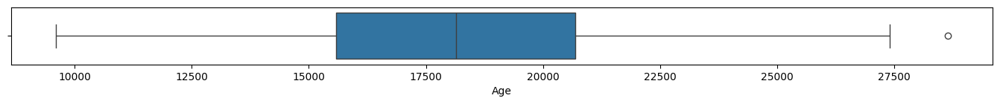

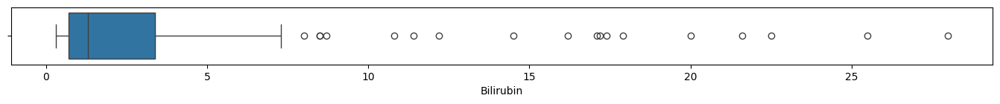

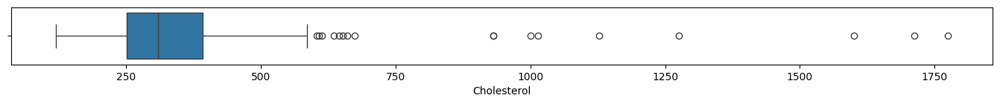

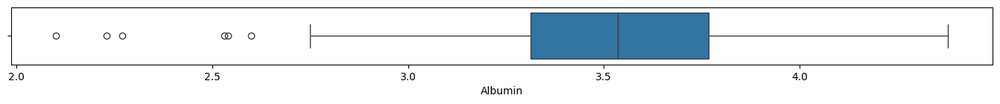

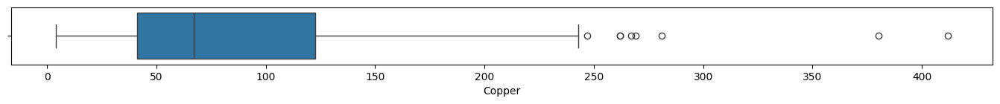

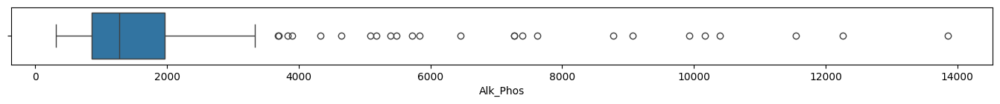

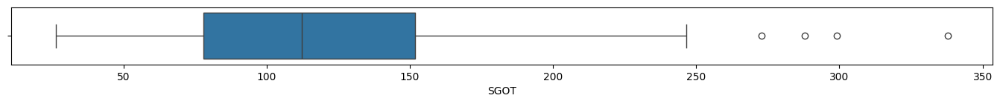

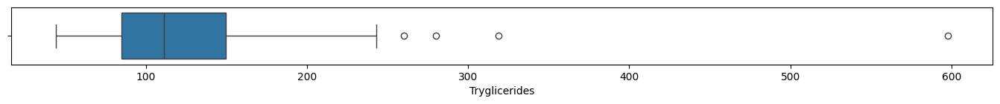

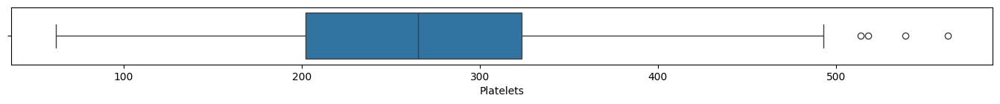

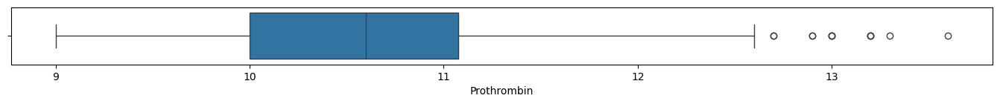

In [90]:
##################################
# Formulating the individual boxplots
# for all numeric columns
##################################
for column in cirrhosis_survival_X_train_imputed_numeric:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=cirrhosis_survival_X_train_imputed_numeric, x=column)

### 1.4.4 Collinearity <a class="anchor" id="1.4.4"></a>

[Pearson’s Correlation Coefficient](https://royalsocietypublishing.org/doi/10.1098/rsta.1896.0007) is a parametric measure of the linear correlation for a pair of features by calculating the ratio between their covariance and the product of their standard deviations. The presence of high absolute correlation values indicate the univariate association between the numeric predictors and the numeric response.

1. All numeric variables in the training subset were retained since majority reported sufficiently moderate and statistically significant correlation with no excessive multicollinearity.
2. Among pairwise combinations of numeric variables in the training subset, the highest Pearson.Correlation.Coefficient values were noted for:
    * <span style="color: #FF0000">Birilubin</span> and <span style="color: #FF0000">Copper</span>: Pearson.Correlation.Coefficient = +0.503
    * <span style="color: #FF0000">Birilubin</span> and <span style="color: #FF0000">SGOT</span>: Pearson.Correlation.Coefficient = +0.444
    * <span style="color: #FF0000">Birilubin</span> and <span style="color: #FF0000">Tryglicerides</span>: Pearson.Correlation.Coefficient = +0.389
    * <span style="color: #FF0000">Birilubin</span> and <span style="color: #FF0000">Cholesterol</span>: Pearson.Correlation.Coefficient = +0.348
    * <span style="color: #FF0000">Birilubin</span> and <span style="color: #FF0000">Prothrombin</span>: Pearson.Correlation.Coefficient = +0.344

In [91]:
##################################
# Formulating a function 
# to plot the correlation matrix
# for all pairwise combinations
# of numeric columns
##################################
def plot_correlation_matrix(corr, mask=None):
    f, ax = plt.subplots(figsize=(11, 9))
    sns.heatmap(corr, 
                ax=ax,
                mask=mask,
                annot=True, 
                vmin=-1, 
                vmax=1, 
                center=0,
                cmap='coolwarm', 
                linewidths=1, 
                linecolor='gray', 
                cbar_kws={'orientation': 'horizontal'}) 

In [92]:
##################################
# Computing the correlation coefficients
# and correlation p-values
# among pairs of numeric columns
##################################
cirrhosis_survival_X_train_imputed_numeric_correlation_pairs = {}
cirrhosis_survival_X_train_imputed_numeric_columns = cirrhosis_survival_X_train_imputed_numeric.columns.tolist()
for numeric_column_a, numeric_column_b in itertools.combinations(cirrhosis_survival_X_train_imputed_numeric_columns, 2):
    cirrhosis_survival_X_train_imputed_numeric_correlation_pairs[numeric_column_a + '_' + numeric_column_b] = stats.pearsonr(
        cirrhosis_survival_X_train_imputed_numeric.loc[:, numeric_column_a], 
        cirrhosis_survival_X_train_imputed_numeric.loc[:, numeric_column_b])

In [93]:
##################################
# Formulating the pairwise correlation summary
# for all numeric columns
##################################
cirrhosis_survival_X_train_imputed_numeric_summary = cirrhosis_survival_X_train_imputed_numeric.from_dict(cirrhosis_survival_X_train_imputed_numeric_correlation_pairs, orient='index')
cirrhosis_survival_X_train_imputed_numeric_summary.columns = ['Pearson.Correlation.Coefficient', 'Correlation.PValue']
display(cirrhosis_survival_X_train_imputed_numeric_summary.sort_values(by=['Pearson.Correlation.Coefficient'], ascending=False).head(20))

,Pearson.Correlation.Coefficient,Correlation.PValue
Bilirubin_SGOT,0.503007,2.210899e-15
Bilirubin_Copper,0.444366,5.768566e-12
Bilirubin_Tryglicerides,0.389493,2.607951e-09
Bilirubin_Cholesterol,0.348174,1.311597e-07
Bilirubin_Prothrombin,0.344724,1.775156e-07
Copper_SGOT,0.305052,4.475849e-06
Cholesterol_SGOT,0.280530,2.635566e-05
Alk_Phos_Tryglicerides,0.265538,7.199789e-05
Cholesterol_Tryglicerides,0.257973,1.169491e-04
Copper_Tryglicerides,0.256448,1.287335e-04


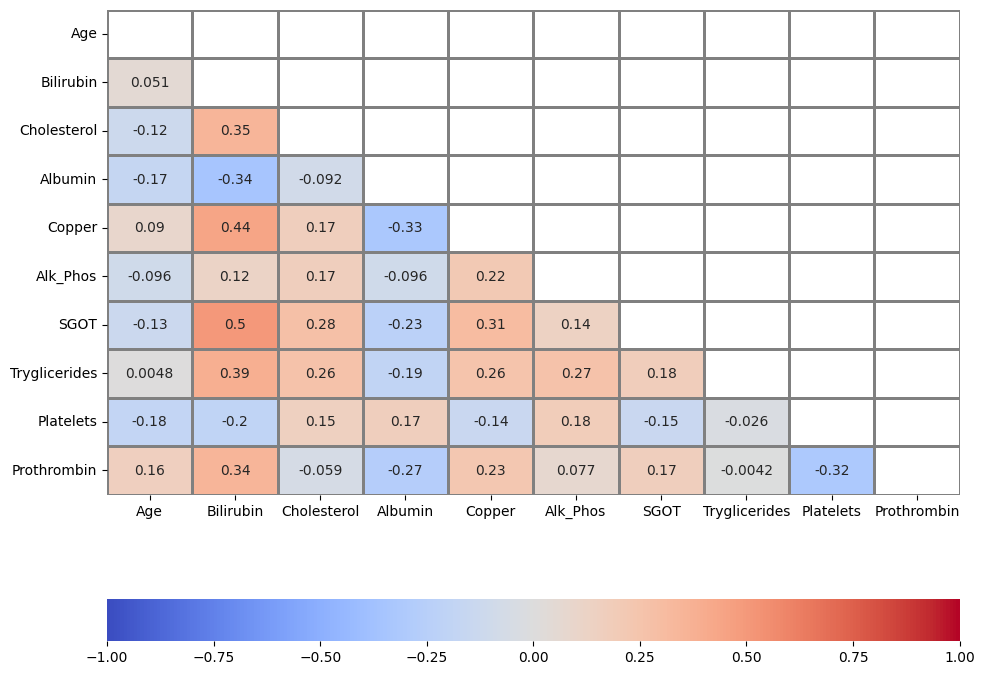

In [94]:
##################################
# Plotting the correlation matrix
# for all pairwise combinations
# of numeric columns
##################################
cirrhosis_survival_X_train_imputed_numeric_correlation = cirrhosis_survival_X_train_imputed_numeric.corr()
mask = np.triu(cirrhosis_survival_X_train_imputed_numeric_correlation)
plot_correlation_matrix(cirrhosis_survival_X_train_imputed_numeric_correlation,mask)
plt.show()

In [95]:
##################################
# Formulating a function 
# to plot the correlation matrix
# for all pairwise combinations
# of numeric columns
# with significant p-values only
##################################
def correlation_significance(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

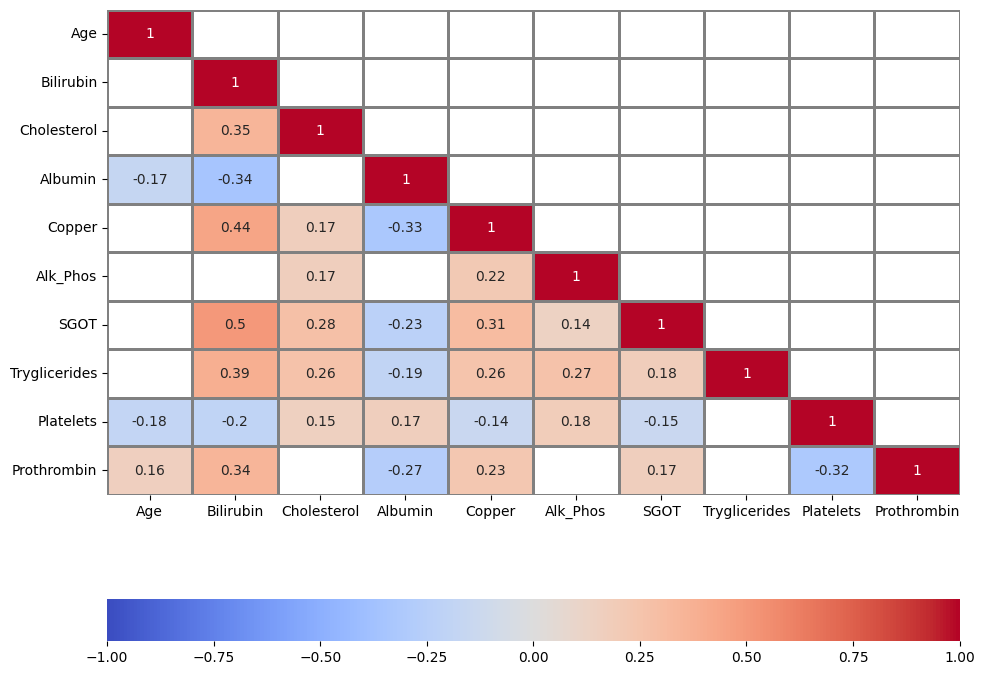

In [96]:
##################################
# Plotting the correlation matrix
# for all pairwise combinations
# of numeric columns
# with significant p-values only
##################################
cirrhosis_survival_X_train_imputed_numeric_correlation_p_values = correlation_significance(cirrhosis_survival_X_train_imputed_numeric)                     
mask = np.invert(np.tril(cirrhosis_survival_X_train_imputed_numeric_correlation_p_values<0.05)) 
plot_correlation_matrix(cirrhosis_survival_X_train_imputed_numeric_correlation,mask)

### 1.4.5 Shape Transformation <a class="anchor" id="1.4.5"></a>

[Yeo-Johnson Transformation](https://academic.oup.com/biomet/article-abstract/87/4/954/232908?redirectedFrom=fulltext&login=false) applies a new family of distributions that can be used without restrictions, extending many of the good properties of the Box-Cox power family. Similar to the Box-Cox transformation, the method also estimates the optimal value of lambda but has the ability to transform both positive and negative values by inflating low variance data and deflating high variance data to create a more uniform data set. While there are no restrictions in terms of the applicable values, the interpretability of the transformed values is more diminished as compared to the other methods.

1. A Yeo-Johnson transformation was applied to all numeric variables in the training subset to improve distributional shape.
2. Most variables in the training subset achieved symmetrical distributions with minimal outliers after transformation.
    * <span style="color: #FF0000">Cholesterol</span>: Outlier.Count = 9, Outlier.Ratio = 0.041, Skewness=-0.083
    * <span style="color: #FF0000">Albumin</span>: Outlier.Count = 4, Outlier.Ratio = 0.018, Skewness=+0.006
    * <span style="color: #FF0000">Platelets</span>: Outlier.Count = 2, Outlier.Ratio = 0.009, Skewness=-0.019
    * <span style="color: #FF0000">Age</span>: Outlier.Count = 1, Outlier.Ratio = 0.004, Skewness=+0.223
    * <span style="color: #FF0000">Copper</span>: Outlier.Count = 1, Outlier.Ratio = 0.004, Skewness=-0.010
    * <span style="color: #FF0000">Alk_Phos</span>: Outlier.Count = 1, Outlier.Ratio = 0.004, Skewness=+0.027
    * <span style="color: #FF0000">SGOT</span>: Outlier.Count = 1, Outlier.Ratio = 0.004, Skewness=-0.001
    * <span style="color: #FF0000">Tryglicerides</span>: Outlier.Count = 1, Outlier.Ratio = 0.004, Skewness=+0.000
3. Outlier data in the testing subset for numeric variables will be treated with Yeo-Johnson transformation downstream using a pipeline involving the final preprocessing steps.


In [97]:
##################################
# Formulating a data subset containing
# variables with noted outliers
##################################
X_train_predictors_with_outliers = ['Bilirubin','Cholesterol','Albumin','Copper','Alk_Phos','SGOT','Tryglicerides','Platelets','Prothrombin']
cirrhosis_survival_X_train_imputed_numeric_with_outliers = cirrhosis_survival_X_train_imputed_numeric[X_train_predictors_with_outliers]

In [98]:
##################################
# Conducting a Yeo-Johnson Transformation
# to address the distributional
# shape of the variables
##################################
yeo_johnson_transformer = PowerTransformer(method='yeo-johnson',
                                          standardize=False)
cirrhosis_survival_X_train_imputed_numeric_with_outliers_array = yeo_johnson_transformer.fit_transform(cirrhosis_survival_X_train_imputed_numeric_with_outliers)

In [99]:
##################################
# Formulating a new dataset object
# for the transformed data
##################################
cirrhosis_survival_X_train_transformed_numeric_with_outliers = pd.DataFrame(cirrhosis_survival_X_train_imputed_numeric_with_outliers_array,
                                                                            columns=cirrhosis_survival_X_train_imputed_numeric_with_outliers.columns)
cirrhosis_survival_X_train_transformed_numeric = pd.concat([cirrhosis_survival_X_train_imputed_numeric[['Age']],
                                                            cirrhosis_survival_X_train_transformed_numeric_with_outliers], 
                                                           axis=1)

In [100]:
cirrhosis_survival_X_train_transformed_numeric.head()

,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin
0,13329,0.830251,1.528771,25.311621,4.367652,2.066062,7.115310,3.357597,58.787709,0.236575
1,12912,0.751147,1.535175,34.049208,6.244827,2.047167,7.303237,3.581345,57.931137,0.236572
2,17180,0.491099,1.523097,32.812930,5.320861,2.043970,7.278682,2.990077,61.554228,0.236573
3,17884,0.760957,1.505627,30.818146,5.264915,2.062590,7.170942,3.288822,29.648190,0.236575
4,15177,0.893603,1.519249,26.533792,6.440904,2.109170,8.385199,3.284119,43.198326,0.236572


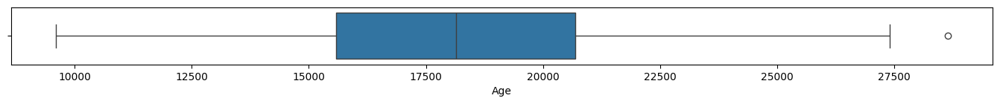

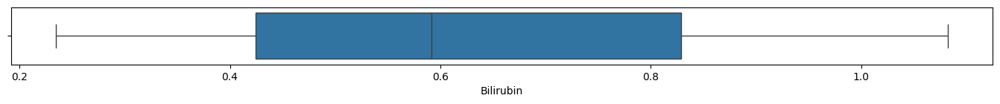

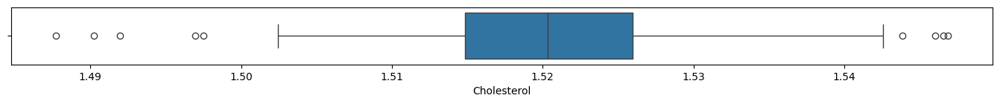

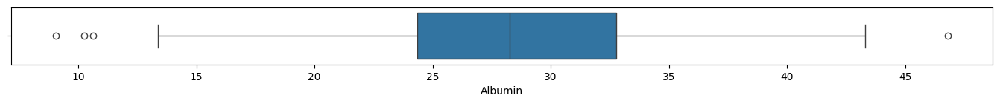

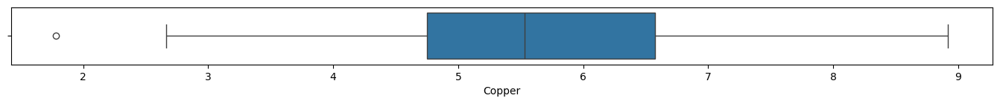

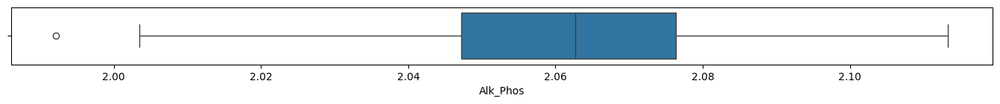

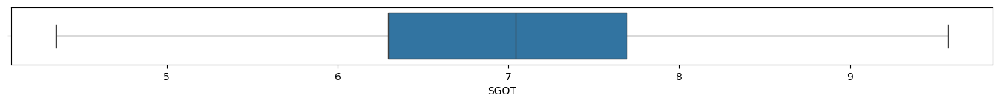

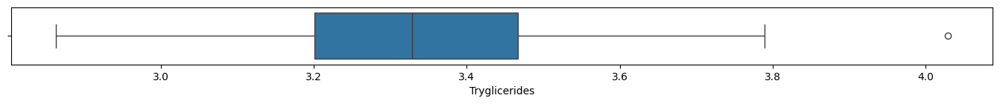

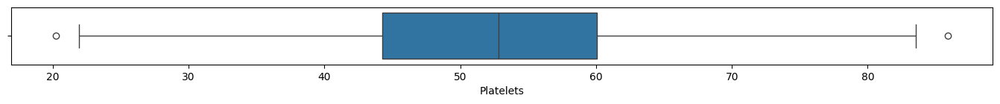

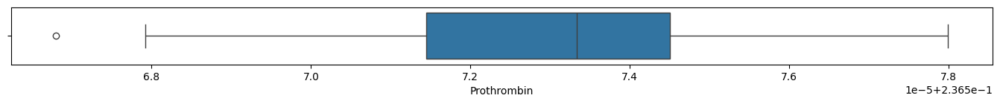

In [101]:
##################################
# Formulating the individual boxplots
# for all transformed numeric columns
##################################
for column in cirrhosis_survival_X_train_transformed_numeric:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=cirrhosis_survival_X_train_transformed_numeric, x=column)

In [102]:
##################################
# Formulating the outlier summary
# for all numeric columns
##################################
X_train_numeric_variable_name_list = list(cirrhosis_survival_X_train_transformed_numeric.columns)
X_train_numeric_skewness_list = cirrhosis_survival_X_train_transformed_numeric.skew()
cirrhosis_survival_X_train_transformed_numeric_q1 = cirrhosis_survival_X_train_transformed_numeric.quantile(0.25)
cirrhosis_survival_X_train_transformed_numeric_q3 = cirrhosis_survival_X_train_transformed_numeric.quantile(0.75)
cirrhosis_survival_X_train_transformed_numeric_iqr = cirrhosis_survival_X_train_transformed_numeric_q3 - cirrhosis_survival_X_train_transformed_numeric_q1
X_train_numeric_outlier_count_list = ((cirrhosis_survival_X_train_transformed_numeric < (cirrhosis_survival_X_train_transformed_numeric_q1 - 1.5 * cirrhosis_survival_X_train_transformed_numeric_iqr)) | (cirrhosis_survival_X_train_transformed_numeric > (cirrhosis_survival_X_train_transformed_numeric_q3 + 1.5 * cirrhosis_survival_X_train_transformed_numeric_iqr))).sum()
X_train_numeric_row_count_list = list([len(cirrhosis_survival_X_train_transformed_numeric)] * len(cirrhosis_survival_X_train_transformed_numeric.columns))
X_train_numeric_outlier_ratio_list = map(truediv, X_train_numeric_outlier_count_list, X_train_numeric_row_count_list)

X_train_numeric_column_outlier_summary = pd.DataFrame(zip(X_train_numeric_variable_name_list,
                                                          X_train_numeric_skewness_list,
                                                          X_train_numeric_outlier_count_list,
                                                          X_train_numeric_row_count_list,
                                                          X_train_numeric_outlier_ratio_list),                                                      
                                        columns=['Numeric.Column.Name',
                                                 'Skewness',
                                                 'Outlier.Count',
                                                 'Row.Count',
                                                 'Outlier.Ratio'])
display(X_train_numeric_column_outlier_summary.sort_values(by=['Outlier.Count'], ascending=False))

,Numeric.Column.Name,Skewness,Outlier.Count,Row.Count,Outlier.Ratio
2,Cholesterol,-0.083072,9,218,0.041284
3,Albumin,0.006523,4,218,0.018349
8,Platelets,-0.019323,2,218,0.009174
0,Age,0.223080,1,218,0.004587
4,Copper,-0.010240,1,218,0.004587
5,Alk_Phos,0.027977,1,218,0.004587
7,Tryglicerides,-0.000881,1,218,0.004587
9,Prothrombin,0.000000,1,218,0.004587
1,Bilirubin,0.263101,0,218,0.000000
6,SGOT,-0.008416,0,218,0.000000


### 1.4.6 Centering and Scaling <a class="anchor" id="1.4.6"></a>

1. All numeric variables in the training subset were transformed using the standardization method to achieve a comparable scale between values.
2. Original data in the testing subset for numeric variables will be treated with standardization scaling downstream using a pipeline involving the final preprocessing steps.

In [103]:
##################################
# Conducting standardization
# to transform the values of the 
# variables into comparable scale
##################################
standardization_scaler = StandardScaler()
cirrhosis_survival_X_train_transformed_numeric_array = standardization_scaler.fit_transform(cirrhosis_survival_X_train_transformed_numeric)

In [104]:
##################################
# Formulating a new dataset object
# for the scaled data
##################################
cirrhosis_survival_X_train_scaled_numeric = pd.DataFrame(cirrhosis_survival_X_train_transformed_numeric_array,
                                                         columns=cirrhosis_survival_X_train_transformed_numeric.columns)

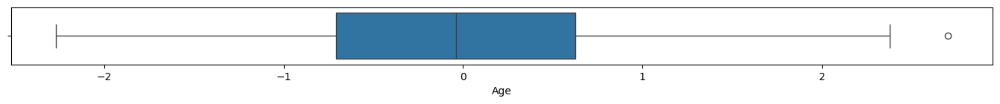

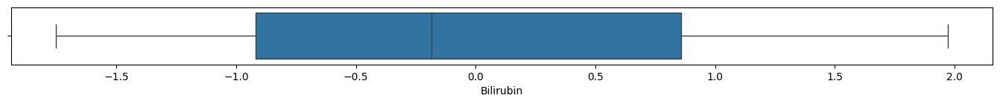

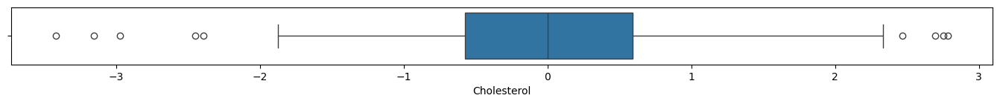

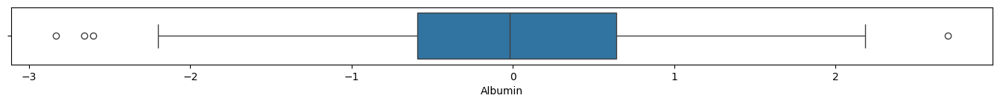

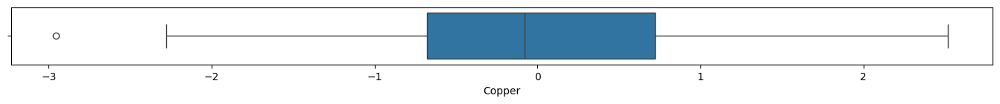

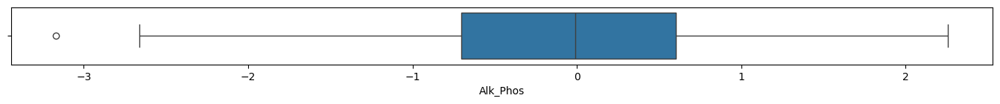

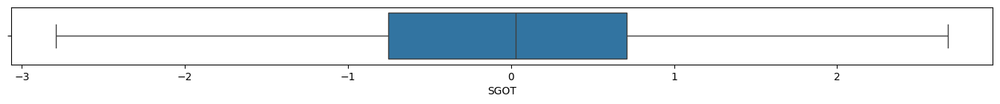

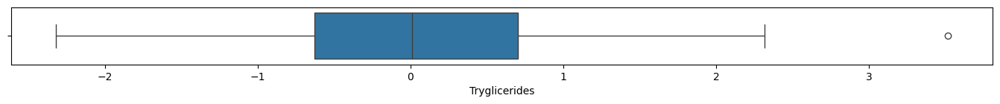

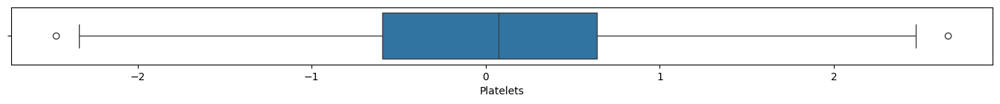

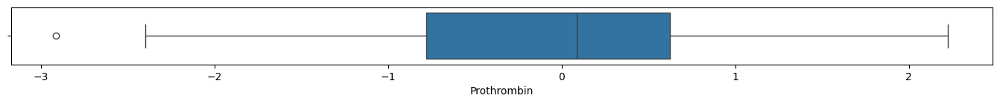

In [105]:
##################################
# Formulating the individual boxplots
# for all transformed numeric columns
##################################
for column in cirrhosis_survival_X_train_scaled_numeric:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=cirrhosis_survival_X_train_scaled_numeric, x=column)

### 1.4.7 Data Encoding <a class="anchor" id="1.4.7"></a>

1. Binary encoding was applied to the predictor object columns in the training subset:
    * <span style="color: #FF0000">Status</span>
    * <span style="color: #FF0000">Drug</span>
    * <span style="color: #FF0000">Sex</span>
    * <span style="color: #FF0000">Ascites</span>
    * <span style="color: #FF0000">Hepatomegaly</span>
    * <span style="color: #FF0000">Spiders</span>
    * <span style="color: #FF0000">Edema</span>
1. One-hot encoding was applied to the <span style="color: #FF0000">Stage</span> variable resulting to 4 additional columns in the training subset:
    * <span style="color: #FF0000">Stage_1.0</span>
    * <span style="color: #FF0000">Stage_2.0</span>
    * <span style="color: #FF0000">Stage_3.0</span>
    * <span style="color: #FF0000">Stage_4.0</span>
3. Original data in the testing subset for object variables will be treated with binary and one-hot encoding downstream using a pipeline involving the final preprocessing steps.

In [106]:
##################################
# Applying a binary encoding transformation
# for the two-level object columns
##################################
cirrhosis_survival_X_train_cleaned_object['Sex'] = cirrhosis_survival_X_train_cleaned_object['Sex'].replace({'M':0, 'F':1}) 
cirrhosis_survival_X_train_cleaned_object['Ascites'] = cirrhosis_survival_X_train_cleaned_object['Ascites'].replace({'N':0, 'Y':1}) 
cirrhosis_survival_X_train_cleaned_object['Drug'] = cirrhosis_survival_X_train_cleaned_object['Drug'].replace({'Placebo':0, 'D-penicillamine':1}) 
cirrhosis_survival_X_train_cleaned_object['Hepatomegaly'] = cirrhosis_survival_X_train_cleaned_object['Hepatomegaly'].replace({'N':0, 'Y':1}) 
cirrhosis_survival_X_train_cleaned_object['Spiders'] = cirrhosis_survival_X_train_cleaned_object['Spiders'].replace({'N':0, 'Y':1}) 
cirrhosis_survival_X_train_cleaned_object['Edema'] = cirrhosis_survival_X_train_cleaned_object['Edema'].replace({'N':0, 'Y':1, 'S':1}) 

In [107]:
##################################
# Formulating the multi-level object column stage
# for encoding transformation
##################################
cirrhosis_survival_X_train_cleaned_object_stage_encoded = pd.DataFrame(cirrhosis_survival_X_train_cleaned_object.loc[:, 'Stage'].to_list(),
                                                                       columns=['Stage'])

In [108]:
##################################
# Applying a one-hot encoding transformation
# for the multi-level object column stage
##################################
cirrhosis_survival_X_train_cleaned_object_stage_encoded = pd.get_dummies(cirrhosis_survival_X_train_cleaned_object_stage_encoded, columns=['Stage'])

In [109]:
##################################
# Applying a one-hot encoding transformation
# for the multi-level object column stage
##################################
cirrhosis_survival_X_train_cleaned_encoded_object = pd.concat([cirrhosis_survival_X_train_cleaned_object.drop(['Stage'], axis=1), 
                                                               cirrhosis_survival_X_train_cleaned_object_stage_encoded], axis=1)
cirrhosis_survival_X_train_cleaned_encoded_object.head()

,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Stage_1.0,Stage_2.0,Stage_3.0,Stage_4.0
0,1,1,0,0,0,0,False,True,False,False
1,1,0,0,0,0,0,False,False,True,False
2,1,1,0,0,0,0,False,True,False,False
3,0,1,1,1,1,1,False,False,False,True
4,0,1,0,1,0,0,False,True,False,False


### 1.4.8 Preprocessed Data Description <a class="anchor" id="1.4.8"></a>

1. A preprocessing pipeline was formulated to standardize the data transformation methods applied to both the training and testing subsets.
2. The preprocessed training subset is comprised of:
    * **218 rows** (observations)
    * **22 columns** (variables)
        * **2/22 event | duration** (boolean | numeric)
             * <span style="color: #FF0000">Status</span>
             * <span style="color: #FF0000">N_Days</span>
        * **10/22 predictor** (numeric)
             * <span style="color: #FF0000">Age</span>
             * <span style="color: #FF0000">Bilirubin</span>
             * <span style="color: #FF0000">Cholesterol</span>
             * <span style="color: #FF0000">Albumin</span>
             * <span style="color: #FF0000">Copper</span>
             * <span style="color: #FF0000">Alk_Phos</span>
             * <span style="color: #FF0000">SGOT</span>
             * <span style="color: #FF0000">Triglycerides</span>
             * <span style="color: #FF0000">Platelets</span>
             * <span style="color: #FF0000">Prothrombin</span>
        * **10/22 predictor** (object)
             * <span style="color: #FF0000">Drug</span>
             * <span style="color: #FF0000">Sex</span>
             * <span style="color: #FF0000">Ascites</span>
             * <span style="color: #FF0000">Hepatomegaly</span>
             * <span style="color: #FF0000">Spiders</span>
             * <span style="color: #FF0000">Edema</span>
             * <span style="color: #FF0000">Stage_1.0</span>
             * <span style="color: #FF0000">Stage_2.0</span>
             * <span style="color: #FF0000">Stage_3.0</span>
             * <span style="color: #FF0000">Stage_4.0</span>
3. The preprocessed testing subset is comprised of:
    * **94 rows** (observations)
    * **22 columns** (variables)
        * **2/22 event | duration** (boolean | numeric)
             * <span style="color: #FF0000">Status</span>
             * <span style="color: #FF0000">N_Days</span>
        * **10/22 predictor** (numeric)
             * <span style="color: #FF0000">Age</span>
             * <span style="color: #FF0000">Bilirubin</span>
             * <span style="color: #FF0000">Cholesterol</span>
             * <span style="color: #FF0000">Albumin</span>
             * <span style="color: #FF0000">Copper</span>
             * <span style="color: #FF0000">Alk_Phos</span>
             * <span style="color: #FF0000">SGOT</span>
             * <span style="color: #FF0000">Triglycerides</span>
             * <span style="color: #FF0000">Platelets</span>
             * <span style="color: #FF0000">Prothrombin</span>
        * **10/22 predictor** (object)
             * <span style="color: #FF0000">Drug</span>
             * <span style="color: #FF0000">Sex</span>
             * <span style="color: #FF0000">Ascites</span>
             * <span style="color: #FF0000">Hepatomegaly</span>
             * <span style="color: #FF0000">Spiders</span>
             * <span style="color: #FF0000">Edema</span>
             * <span style="color: #FF0000">Stage_1.0</span>
             * <span style="color: #FF0000">Stage_2.0</span>
             * <span style="color: #FF0000">Stage_3.0</span>
             * <span style="color: #FF0000">Stage_4.0</span>

In [110]:
##################################
# Consolidating all preprocessed
# numeric and object predictors
# for the training subset
##################################
cirrhosis_survival_X_train_preprocessed = pd.concat([cirrhosis_survival_X_train_scaled_numeric,
                                                     cirrhosis_survival_X_train_cleaned_encoded_object], 
                                                     axis=1)
cirrhosis_survival_X_train_preprocessed.head()

,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Stage_1.0,Stage_2.0,Stage_3.0,Stage_4.0
0,-1.296446,0.863802,0.885512,-0.451884,-0.971563,0.140990,0.104609,0.155256,0.539120,0.747580,1,1,0,0,0,0,False,True,False,False
1,-1.405311,0.516350,1.556983,0.827618,0.468389,-0.705337,0.301441,1.275281,0.472266,-0.315794,1,0,0,0,0,0,False,False,True,False
2,-0.291081,-0.625875,0.290561,0.646582,-0.240371,-0.848544,0.275723,-1.684460,0.755044,0.087130,1,1,0,0,0,0,False,True,False,False
3,-0.107291,0.559437,-1.541148,0.354473,-0.283286,-0.014525,0.162878,-0.189015,-1.735183,0.649171,0,1,1,1,1,1,False,False,False,True
4,-0.813996,1.142068,-0.112859,-0.272913,0.618797,2.071847,1.434674,-0.212560,-0.677612,-0.315794,0,1,0,1,0,0,False,True,False,False


In [111]:
##################################
# Creating a pre-processing pipeline
# for numeric predictors
##################################
cirrhosis_survival_numeric_predictors = ['Age', 'Bilirubin','Cholesterol', 'Albumin','Copper', 'Alk_Phos','SGOT', 'Tryglicerides','Platelets', 'Prothrombin']
numeric_transformer = Pipeline(steps=[
    ('imputer', IterativeImputer(estimator = lr,
                                 max_iter = 10,
                                 tol = 1e-10,
                                 imputation_order = 'ascending',
                                 random_state=88888888)),
    ('yeo_johnson', PowerTransformer(method='yeo-johnson',
                                    standardize=False)),
    ('scaler', StandardScaler())])

preprocessor = ColumnTransformer(
    transformers=[('num', numeric_transformer, cirrhosis_survival_numeric_predictors)])

In [112]:
##################################
# Fitting and transforming 
# training subset numeric predictors
##################################
cirrhosis_survival_X_train_numeric_preprocessed = preprocessor.fit_transform(cirrhosis_survival_X_train_cleaned)
cirrhosis_survival_X_train_numeric_preprocessed = pd.DataFrame(cirrhosis_survival_X_train_numeric_preprocessed,
                                                                columns=cirrhosis_survival_numeric_predictors)
cirrhosis_survival_X_train_numeric_preprocessed.head()

,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin
0,-1.342097,0.863802,0.886087,-0.451884,-0.972098,0.140990,0.104609,0.155130,0.540960,0.747580
1,-1.470901,0.516350,1.554523,0.827618,0.467579,-0.705337,0.301441,1.275222,0.474140,-0.315794
2,-0.239814,-0.625875,0.293280,0.646582,-0.241205,-0.848544,0.275723,-1.684460,0.756741,0.087130
3,-0.052733,0.559437,-1.534283,0.354473,-0.284113,-0.014525,0.162878,-0.189139,-1.735375,0.649171
4,-0.795010,1.142068,-0.108933,-0.272913,0.618030,2.071847,1.434674,-0.212684,-0.675951,-0.315794


In [113]:
##################################
# Performing pre-processing operations
# for object predictors
# in the training subset
##################################
cirrhosis_survival_object_predictors = ['Drug', 'Sex','Ascites', 'Hepatomegaly','Spiders', 'Edema','Stage']
cirrhosis_survival_X_train_object = cirrhosis_survival_X_train_cleaned.copy()
cirrhosis_survival_X_train_object = cirrhosis_survival_X_train_object[cirrhosis_survival_object_predictors]
cirrhosis_survival_X_train_object.reset_index(drop=True, inplace=True)
cirrhosis_survival_X_train_object.head()

,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Stage
0,D-penicillamine,F,N,N,N,N,2.0
1,D-penicillamine,M,N,N,N,N,3.0
2,D-penicillamine,F,N,N,N,N,2.0
3,Placebo,F,Y,Y,Y,Y,4.0
4,Placebo,F,N,Y,N,N,2.0


In [114]:
##################################
# Applying a binary encoding transformation
# for the two-level object columns
# in the training subset
##################################
cirrhosis_survival_X_train_object['Sex'].replace({'M':0, 'F':1}, inplace=True) 
cirrhosis_survival_X_train_object['Ascites'].replace({'N':0, 'Y':1}, inplace=True) 
cirrhosis_survival_X_train_object['Drug'].replace({'Placebo':0, 'D-penicillamine':1}, inplace=True) 
cirrhosis_survival_X_train_object['Hepatomegaly'].replace({'N':0, 'Y':1}, inplace=True) 
cirrhosis_survival_X_train_object['Spiders'].replace({'N':0, 'Y':1}, inplace=True) 
cirrhosis_survival_X_train_object['Edema'].replace({'N':0, 'Y':1, 'S':1}, inplace=True) 
cirrhosis_survival_X_train_object_stage_encoded = pd.DataFrame(cirrhosis_survival_X_train_object.loc[:, 'Stage'].to_list(),
                                                                       columns=['Stage'])
cirrhosis_survival_X_train_object_stage_encoded = pd.get_dummies(cirrhosis_survival_X_train_object_stage_encoded, columns=['Stage'])
cirrhosis_survival_X_train_object_preprocessed = pd.concat([cirrhosis_survival_X_train_object.drop(['Stage'], axis=1), 
                                                            cirrhosis_survival_X_train_object_stage_encoded], 
                                                           axis=1)
cirrhosis_survival_X_train_object_preprocessed.head()

,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Stage_1.0,Stage_2.0,Stage_3.0,Stage_4.0
0,1,1,0,0,0,0,False,True,False,False
1,1,0,0,0,0,0,False,False,True,False
2,1,1,0,0,0,0,False,True,False,False
3,0,1,1,1,1,1,False,False,False,True
4,0,1,0,1,0,0,False,True,False,False


In [115]:
##################################
# Consolidating the preprocessed
# training subset
##################################
cirrhosis_survival_X_train_preprocessed = pd.concat([cirrhosis_survival_X_train_numeric_preprocessed, cirrhosis_survival_X_train_object_preprocessed], 
                                                    axis=1)
cirrhosis_survival_X_train_preprocessed.head()

,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Stage_1.0,Stage_2.0,Stage_3.0,Stage_4.0
0,-1.342097,0.863802,0.886087,-0.451884,-0.972098,0.140990,0.104609,0.155130,0.540960,0.747580,1,1,0,0,0,0,False,True,False,False
1,-1.470901,0.516350,1.554523,0.827618,0.467579,-0.705337,0.301441,1.275222,0.474140,-0.315794,1,0,0,0,0,0,False,False,True,False
2,-0.239814,-0.625875,0.293280,0.646582,-0.241205,-0.848544,0.275723,-1.684460,0.756741,0.087130,1,1,0,0,0,0,False,True,False,False
3,-0.052733,0.559437,-1.534283,0.354473,-0.284113,-0.014525,0.162878,-0.189139,-1.735375,0.649171,0,1,1,1,1,1,False,False,False,True
4,-0.795010,1.142068,-0.108933,-0.272913,0.618030,2.071847,1.434674,-0.212684,-0.675951,-0.315794,0,1,0,1,0,0,False,True,False,False


In [116]:
##################################
# Verifying the dimensions of the
# preprocessed training subset
##################################
cirrhosis_survival_X_train_preprocessed.shape

(218, 20)

In [117]:
##################################
# Fitting and transforming 
# testing subset numeric predictors
##################################
cirrhosis_survival_X_test_numeric_preprocessed = preprocessor.transform(cirrhosis_survival_X_test_cleaned)
cirrhosis_survival_X_test_numeric_preprocessed = pd.DataFrame(cirrhosis_survival_X_test_numeric_preprocessed,
                                                                columns=cirrhosis_survival_numeric_predictors)
cirrhosis_survival_X_test_numeric_preprocessed.head()

,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin
0,1.043704,0.744396,0.922380,0.240951,0.045748,0.317282,-0.078335,2.671950,1.654815,-0.948196
1,-1.936476,-0.764558,0.160096,-0.600950,-0.179138,-0.245613,0.472422,-0.359800,0.348533,0.439089
2,-1.749033,0.371523,0.558115,0.646582,-0.159024,0.339454,0.685117,-3.109146,-0.790172,-0.617113
3,-0.485150,-0.918484,-0.690904,1.629765,0.028262,1.713791,-1.387751,0.155130,0.679704,0.087130
4,-0.815655,1.286438,2.610501,-0.722153,0.210203,0.602860,3.494936,-0.053214,-0.475634,-1.714435


In [118]:
##################################
# Performing pre-processing operations
# for object predictors
# in the testing subset
##################################
cirrhosis_survival_object_predictors = ['Drug', 'Sex','Ascites', 'Hepatomegaly','Spiders', 'Edema','Stage']
cirrhosis_survival_X_test_object = cirrhosis_survival_X_test_cleaned.copy()
cirrhosis_survival_X_test_object = cirrhosis_survival_X_test_object[cirrhosis_survival_object_predictors]
cirrhosis_survival_X_test_object.reset_index(drop=True, inplace=True)
cirrhosis_survival_X_test_object.head()

,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Stage
0,D-penicillamine,F,N,N,Y,S,3.0
1,Placebo,F,N,N,N,N,4.0
2,D-penicillamine,F,N,Y,N,N,4.0
3,D-penicillamine,M,N,N,N,N,1.0
4,Placebo,F,N,Y,N,N,2.0


In [119]:
##################################
# Applying a binary encoding transformation
# for the two-level object columns
# in the testing subset
##################################
cirrhosis_survival_X_test_object['Sex'].replace({'M':0, 'F':1}, inplace=True) 
cirrhosis_survival_X_test_object['Ascites'].replace({'N':0, 'Y':1}, inplace=True) 
cirrhosis_survival_X_test_object['Drug'].replace({'Placebo':0, 'D-penicillamine':1}, inplace=True) 
cirrhosis_survival_X_test_object['Hepatomegaly'].replace({'N':0, 'Y':1}, inplace=True) 
cirrhosis_survival_X_test_object['Spiders'].replace({'N':0, 'Y':1}, inplace=True) 
cirrhosis_survival_X_test_object['Edema'].replace({'N':0, 'Y':1, 'S':1}, inplace=True) 
cirrhosis_survival_X_test_object_stage_encoded = pd.DataFrame(cirrhosis_survival_X_test_object.loc[:, 'Stage'].to_list(),
                                                                       columns=['Stage'])
cirrhosis_survival_X_test_object_stage_encoded = pd.get_dummies(cirrhosis_survival_X_test_object_stage_encoded, columns=['Stage'])
cirrhosis_survival_X_test_object_preprocessed = pd.concat([cirrhosis_survival_X_test_object.drop(['Stage'], axis=1), 
                                                            cirrhosis_survival_X_test_object_stage_encoded], 
                                                           axis=1)
cirrhosis_survival_X_test_object_preprocessed.head()

,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Stage_1.0,Stage_2.0,Stage_3.0,Stage_4.0
0,1,1,0,0,1,1,False,False,True,False
1,0,1,0,0,0,0,False,False,False,True
2,1,1,0,1,0,0,False,False,False,True
3,1,0,0,0,0,0,True,False,False,False
4,0,1,0,1,0,0,False,True,False,False


In [120]:
##################################
# Consolidating the preprocessed
# testing subset
##################################
cirrhosis_survival_X_test_preprocessed = pd.concat([cirrhosis_survival_X_test_numeric_preprocessed, cirrhosis_survival_X_test_object_preprocessed], 
                                                    axis=1)
cirrhosis_survival_X_test_preprocessed.head()

,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Stage_1.0,Stage_2.0,Stage_3.0,Stage_4.0
0,1.043704,0.744396,0.922380,0.240951,0.045748,0.317282,-0.078335,2.671950,1.654815,-0.948196,1,1,0,0,1,1,False,False,True,False
1,-1.936476,-0.764558,0.160096,-0.600950,-0.179138,-0.245613,0.472422,-0.359800,0.348533,0.439089,0,1,0,0,0,0,False,False,False,True
2,-1.749033,0.371523,0.558115,0.646582,-0.159024,0.339454,0.685117,-3.109146,-0.790172,-0.617113,1,1,0,1,0,0,False,False,False,True
3,-0.485150,-0.918484,-0.690904,1.629765,0.028262,1.713791,-1.387751,0.155130,0.679704,0.087130,1,0,0,0,0,0,True,False,False,False
4,-0.815655,1.286438,2.610501,-0.722153,0.210203,0.602860,3.494936,-0.053214,-0.475634,-1.714435,0,1,0,1,0,0,False,True,False,False


In [121]:
##################################
# Verifying the dimensions of the
# preprocessed testing subset
##################################
cirrhosis_survival_X_test_preprocessed.shape

(94, 20)

## 1.5. Data Exploration <a class="anchor" id="1.5"></a>

### 1.5.1 Exploratory Data Analysis <a class="anchor" id="1.5.1"></a>

1. The estimated baseline survival plot indicated a 50% survival rate at <span style="color: #FF0000">N_Days=3358</span>.
2. Bivariate analysis identified individual predictors with potential association to the event status based on visual inspection.
    * Higher values for the following numeric predictors are associated with <span style="color: #FF0000">Status=True</span>: 
        * <span style="color: #FF0000">Age</span>
        * <span style="color: #FF0000">Bilirubin</span>   
        * <span style="color: #FF0000">Copper</span>
        * <span style="color: #FF0000">Alk_Phos</span> 
        * <span style="color: #FF0000">SGOT</span>   
        * <span style="color: #FF0000">Tryglicerides</span> 
        * <span style="color: #FF0000">Prothrombin</span>    
    * Higher counts for the following object predictors are associated with better differentiation between <span style="color: #FF0000">Status=True</span> and <span style="color: #FF0000">Status=False</span>:  
        * <span style="color: #FF0000">Drug</span>
        * <span style="color: #FF0000">Sex</span>
        * <span style="color: #FF0000">Ascites</span>
        * <span style="color: #FF0000">Hepatomegaly</span>
        * <span style="color: #FF0000">Spiders</span>
        * <span style="color: #FF0000">Edema</span>
        * <span style="color: #FF0000">Stage_1.0</span>
        * <span style="color: #FF0000">Stage_2.0</span>
        * <span style="color: #FF0000">Stage_3.0</span>
        * <span style="color: #FF0000">Stage_4.0</span>
2. Bivariate analysis identified individual predictors with potential association to the survival time based on visual inspection.
    * Higher values for the following numeric predictors are positively associated with <span style="color: #FF0000">N_Days</span>: 
        * <span style="color: #FF0000">Albumin</span>        
        * <span style="color: #FF0000">Platelets</span>
    * Levels for the following object predictors are associated with differences in <span style="color: #FF0000">N_Days</span> between <span style="color: #FF0000">Status=True</span> and <span style="color: #FF0000">Status=False</span>:  
        * <span style="color: #FF0000">Drug</span>
        * <span style="color: #FF0000">Sex</span>
        * <span style="color: #FF0000">Ascites</span>
        * <span style="color: #FF0000">Hepatomegaly</span>
        * <span style="color: #FF0000">Spiders</span>
        * <span style="color: #FF0000">Edema</span>
        * <span style="color: #FF0000">Stage_1.0</span>
        * <span style="color: #FF0000">Stage_2.0</span>
        * <span style="color: #FF0000">Stage_3.0</span>
        * <span style="color: #FF0000">Stage_4.0</span>

In [122]:
##################################
# Formulating a complete dataframe
# from the training subset for EDA
##################################
cirrhosis_survival_y_train_cleaned.reset_index(drop=True, inplace=True)
cirrhosis_survival_train_EDA = pd.concat([cirrhosis_survival_y_train_cleaned,
                                          cirrhosis_survival_X_train_preprocessed],
                                         axis=1)
cirrhosis_survival_train_EDA.head()

,Status,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,...,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Stage_1.0,Stage_2.0,Stage_3.0,Stage_4.0
0,False,2475,-1.342097,0.863802,0.886087,-0.451884,-0.972098,0.140990,0.104609,0.155130,...,1,1,0,0,0,0,False,True,False,False
1,False,877,-1.470901,0.516350,1.554523,0.827618,0.467579,-0.705337,0.301441,1.275222,...,1,0,0,0,0,0,False,False,True,False
2,False,3050,-0.239814,-0.625875,0.293280,0.646582,-0.241205,-0.848544,0.275723,-1.684460,...,1,1,0,0,0,0,False,True,False,False
3,True,110,-0.052733,0.559437,-1.534283,0.354473,-0.284113,-0.014525,0.162878,-0.189139,...,0,1,1,1,1,1,False,False,False,True
4,True,3839,-0.795010,1.142068,-0.108933,-0.272913,0.618030,2.071847,1.434674,-0.212684,...,0,1,0,1,0,0,False,True,False,False


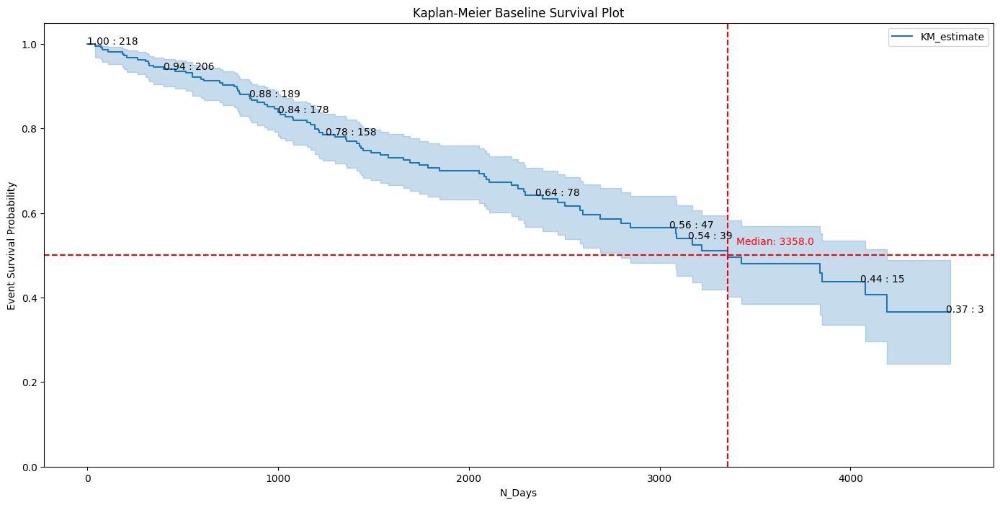

In [123]:
##################################
# Plotting the baseline survival curve
# and computing the survival rates
##################################
kmf = KaplanMeierFitter()
kmf.fit(durations=cirrhosis_survival_train_EDA['N_Days'], event_observed=cirrhosis_survival_train_EDA['Status'])
plt.figure(figsize=(17, 8))
kmf.plot_survival_function()
plt.title('Kaplan-Meier Baseline Survival Plot')
plt.ylim(0, 1.05)
plt.xlabel('N_Days')
plt.ylabel('Event Survival Probability')

##################################
# Determing the at-risk numbers
##################################
at_risk_counts = kmf.event_table.at_risk
survival_probabilities = kmf.survival_function_.values.flatten()
time_points = kmf.survival_function_.index
for time, prob, at_risk in zip(time_points, survival_probabilities, at_risk_counts):
    if time % 50 == 0: 
        plt.text(time, prob, f'{prob:.2f} : {at_risk}', ha='left', fontsize=10)
median_survival_time = kmf.median_survival_time_
plt.axvline(x=median_survival_time, color='r', linestyle='--')
plt.axhline(y=0.5, color='r', linestyle='--')
plt.text(3400, 0.52, f'Median: {median_survival_time}', ha='left', va='bottom', color='r', fontsize=10)
plt.show()

In [124]:
##################################
# Computing the median survival time
##################################
median_survival_time = kmf.median_survival_time_
print(f'Median Survival Time: {median_survival_time}')

Median Survival Time: 3358.0


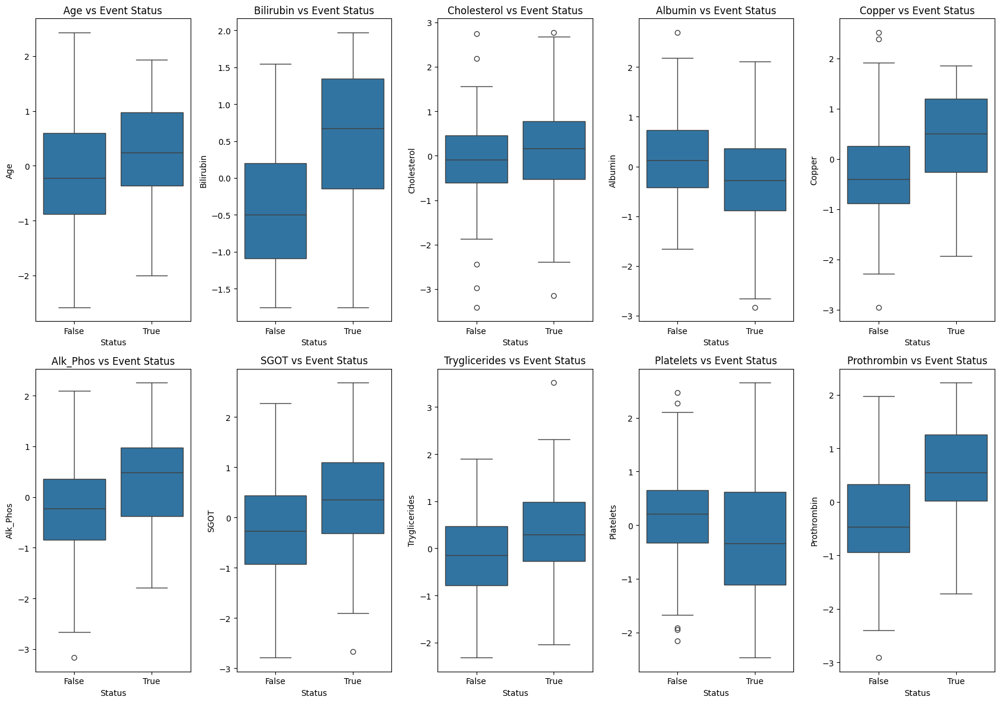

In [125]:
##################################
# Exploring the relationships between
# the numeric predictors and event status
##################################
cirrhosis_survival_numeric_predictors = ['Age', 'Bilirubin','Cholesterol', 'Albumin','Copper', 'Alk_Phos','SGOT', 'Tryglicerides','Platelets', 'Prothrombin']
plt.figure(figsize=(17, 12))
for i in range(1, 11):
    plt.subplot(2, 5, i)
    sns.boxplot(x='Status', y=cirrhosis_survival_numeric_predictors[i-1], data=cirrhosis_survival_train_EDA)
    plt.title(f'{cirrhosis_survival_numeric_predictors[i-1]} vs Event Status')
plt.tight_layout()
plt.show()

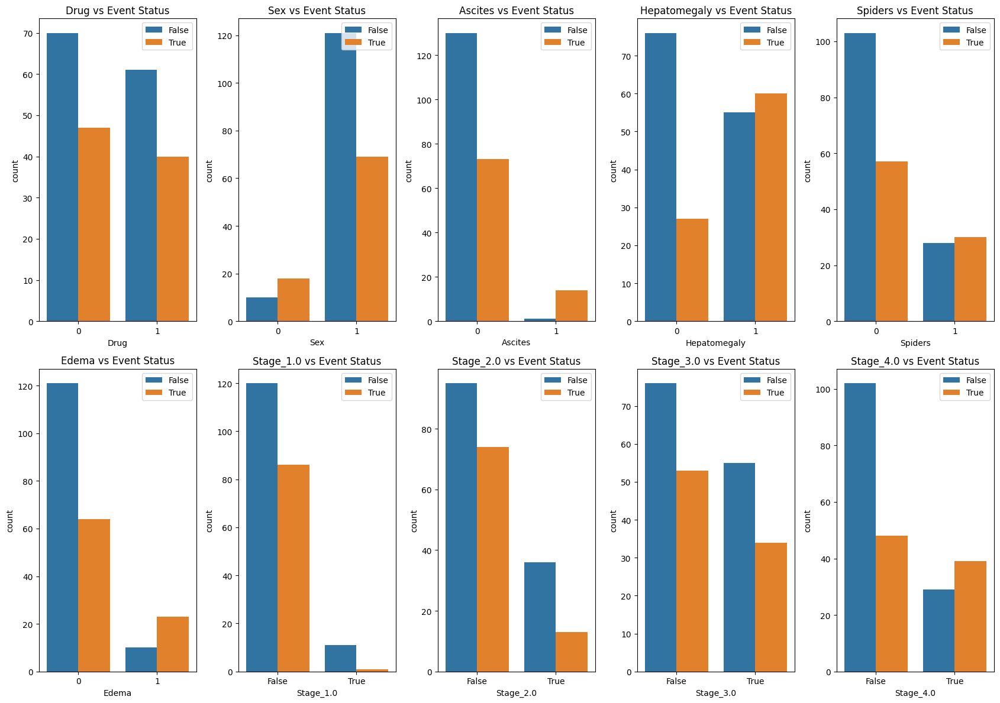

In [126]:
##################################
# Exploring the relationships between
# the object predictors and event status
##################################
cirrhosis_survival_object_predictors = ['Drug', 'Sex','Ascites', 'Hepatomegaly','Spiders', 'Edema','Stage_1.0','Stage_2.0','Stage_3.0','Stage_4.0']
plt.figure(figsize=(17, 12))
for i in range(1, 11):
    plt.subplot(2, 5, i)
    sns.countplot(x=cirrhosis_survival_object_predictors[i-1], hue='Status', data=cirrhosis_survival_train_EDA)
    plt.title(f'{cirrhosis_survival_object_predictors[i-1]} vs Event Status')
    plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

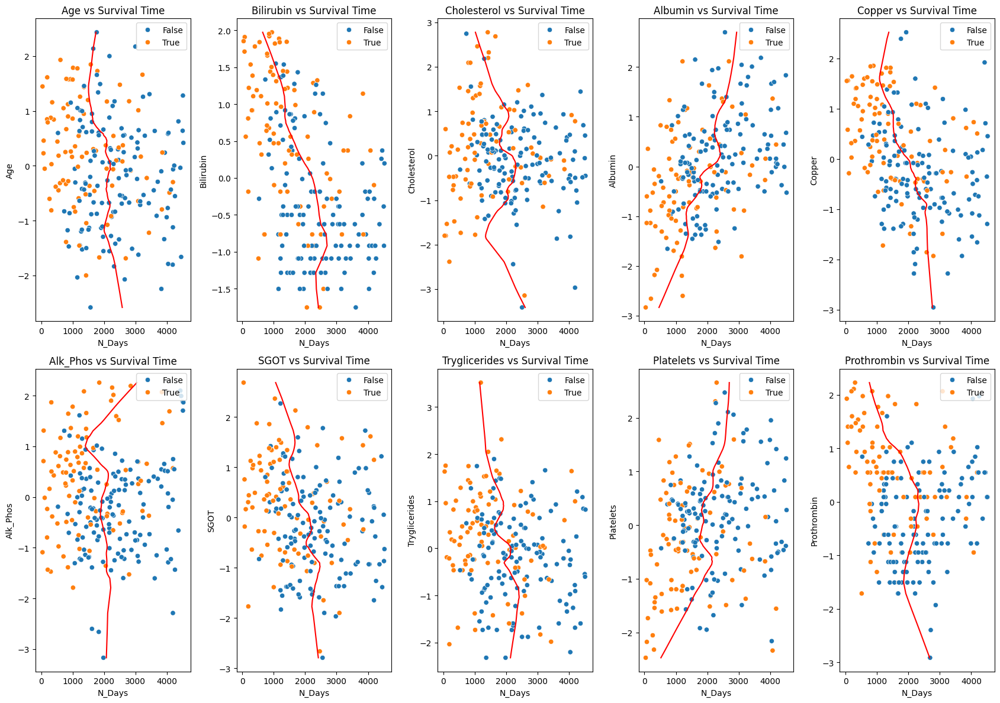

In [127]:
##################################
# Exploring the relationships between
# the numeric predictors and survival time
##################################
plt.figure(figsize=(17, 12))
for i in range(1, 11):
    plt.subplot(2, 5, i)
    sns.scatterplot(x='N_Days', y=cirrhosis_survival_numeric_predictors[i-1], data=cirrhosis_survival_train_EDA, hue='Status')
    loess_smoothed = lowess(cirrhosis_survival_train_EDA['N_Days'], cirrhosis_survival_train_EDA[cirrhosis_survival_numeric_predictors[i-1]], frac=0.3)
    plt.plot(loess_smoothed[:, 1], loess_smoothed[:, 0], color='red')
    plt.title(f'{cirrhosis_survival_numeric_predictors[i-1]} vs Survival Time')
    plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

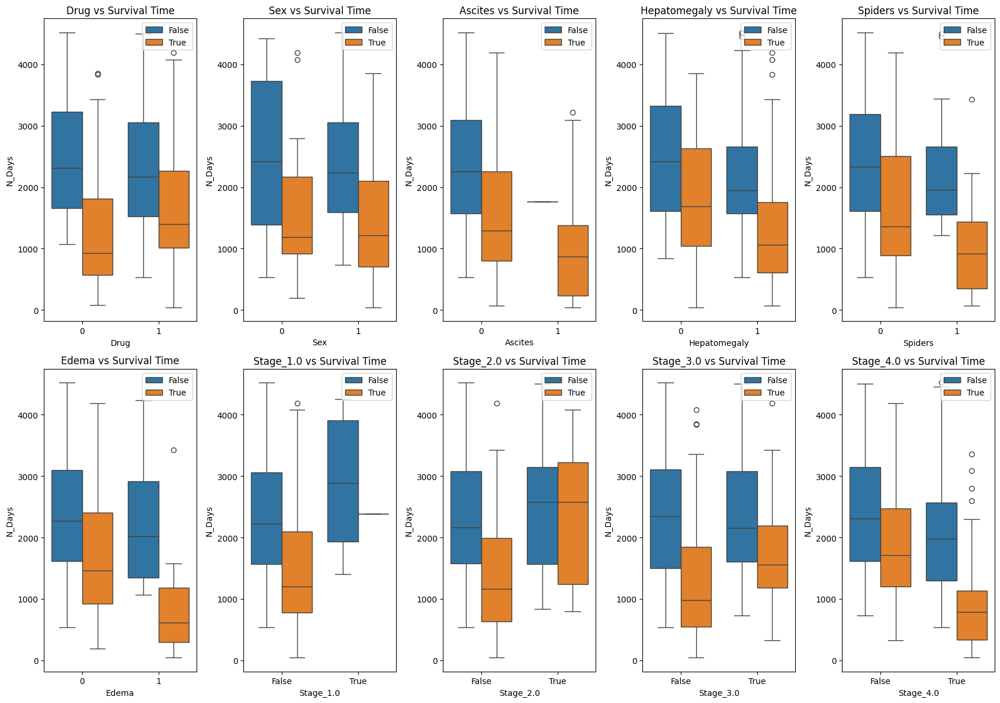

In [128]:
##################################
# Exploring the relationships between
# the object predictors and survival time
##################################
plt.figure(figsize=(17, 12))
for i in range(1, 11):
    plt.subplot(2, 5, i)
    sns.boxplot(x=cirrhosis_survival_object_predictors[i-1], y='N_Days', hue='Status', data=cirrhosis_survival_train_EDA)
    plt.title(f'{cirrhosis_survival_object_predictors[i-1]} vs Survival Time')
    plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

### 1.5.2 Hypothesis Testing <a class="anchor" id="1.5.2"></a>

1. The relationship between the numeric predictors to the <span style="color: #FF0000">Status</span> event variable was statistically evaluated using the following hypotheses:
    * **Null**: Difference in the means between groups True and False is equal to zero  
    * **Alternative**: Difference in the means between groups True and False is not equal to zero   
2. There is sufficient evidence to conclude of a statistically significant difference between the means of the numeric measurements obtained from the <span style="color: #FF0000">Status</span> groups in 10 numeric predictors given their high t-test statistic values with reported low p-values less than the significance level of 0.05.
    * <span style="color: #FF0000">Bilirubin</span>: T.Test.Statistic=-8.031, T.Test.PValue=0.000
    * <span style="color: #FF0000">Prothrombin</span>: T.Test.Statistic=-7.062, T.Test.PValue=0.000 
    * <span style="color: #FF0000">Copper</span>: T.Test.Statistic=-5.699, T.Test.PValue=0.000  
    * <span style="color: #FF0000">Alk_Phos</span>: T.Test.Statistic=-4.638, T.Test.PValue=0.000 
    * <span style="color: #FF0000">SGOT</span>: T.Test.Statistic=-4.207, T.Test.PValue=0.000 
    * <span style="color: #FF0000">Albumin</span>: T.Test.Statistic=+3.871, T.Test.PValue=0.000  
    * <span style="color: #FF0000">Tryglicerides</span>: T.Test.Statistic=-3.575, T.Test.PValue=0.000   
    * <span style="color: #FF0000">Age</span>: T.Test.Statistic=-3.264, T.Test.PValue=0.001
    * <span style="color: #FF0000">Platelets</span>: T.Test.Statistic=+3.261, T.Test.PValue=0.001
    * <span style="color: #FF0000">Cholesterol</span>: T.Test.Statistic=-2.256, T.Test.PValue=0.025
3. The relationship between the object predictors to the <span style="color: #FF0000">Status</span> event variable was statistically evaluated using the following hypotheses:
    * **Null**: The object predictor is independent of the event variable 
    * **Alternative**: The object predictor is dependent on the event variable   
4. There is sufficient evidence to conclude of a statistically significant relationship between the individual categories and the <span style="color: #FF0000">Status</span> groups in 8 object predictors given their high chisquare statistic values with reported low p-values less than the significance level of 0.05.
    * <span style="color: #FF0000">Ascites</span>: ChiSquare.Test.Statistic=16.854, ChiSquare.Test.PValue=0.000
    * <span style="color: #FF0000">Hepatomegaly</span>: ChiSquare.Test.Statistic=14.206, ChiSquare.Test.PValue=0.000   
    * <span style="color: #FF0000">Edema</span>: ChiSquare.Test.Statistic=12.962, ChiSquare.Test.PValue=0.001 
    * <span style="color: #FF0000">Stage_4.0</span>: ChiSquare.Test.Statistic=11.505, ChiSquare.Test.PValue=0.00
    * <span style="color: #FF0000">Sex</span>: ChiSquare.Test.Statistic=6.837, ChiSquare.Test.PValue=0.008
    * <span style="color: #FF0000">Stage_2.0</span>: ChiSquare.Test.Statistic=4.024, ChiSquare.Test.PValue=0.045   
    * <span style="color: #FF0000">Stage_1.0</span>: ChiSquare.Test.Statistic=3.978, ChiSquare.Test.PValue=0.046 
    * <span style="color: #FF0000">Spiders</span>: ChiSquare.Test.Statistic=3.953, ChiSquare.Test.PValue=0.047
5. The relationship between the object predictors to the <span style="color: #FF0000">Status</span> and <span style="color: #FF0000">N_Days</span> variables was statistically evaluated using the following hypotheses:
    * **Null**: There is no difference in survival probabilities among cases belonging to each category of the object predictor.
    * **Alternative**: There is a difference in survival probabilities among cases belonging to each category of the object predictor.
6. There is sufficient evidence to conclude of a statistically significant difference in survival probabilities between the individual categories and the <span style="color: #FF0000">Status</span> groups with respect to the survival duration <span style="color: #FF0000">N_Days</span> in 8 object predictors given their high log-rank test statistic values with reported low p-values less than the significance level of 0.05.
    * <span style="color: #FF0000">Ascites</span>: LR.Test.Statistic=37.792, LR.Test.PValue=0.000
    * <span style="color: #FF0000">Edema</span>: LR.Test.Statistic=31.619, LR.Test.PValue=0.000 
    * <span style="color: #FF0000">Stage_4.0</span>: LR.Test.Statistic=26.482, LR.Test.PValue=0.000
    * <span style="color: #FF0000">Hepatomegaly</span>: LR.Test.Statistic=20.350, LR.Test.PValue=0.000   
    * <span style="color: #FF0000">Spiders</span>: LR.Test.Statistic=10.762, LR.Test.PValue=0.001
    * <span style="color: #FF0000">Stage_2.0</span>: LR.Test.Statistic=6.775, LR.Test.PValue=0.009   
    * <span style="color: #FF0000">Sex</span>: LR.Test.Statistic=5.514, LR.Test.PValue=0.018
    * <span style="color: #FF0000">Stage_1.0</span>: LR.Test.Statistic=5.473, LR.Test.PValue=0.019 
7. The relationship between the binned numeric predictors to the <span style="color: #FF0000">Status</span> and <span style="color: #FF0000">N_Days</span> variables was statistically evaluated using the following hypotheses:
    * **Null**: There is no difference in survival probabilities among cases belonging to each category of the binned numeric predictor.
    * **Alternative**: There is a difference in survival probabilities among cases belonging to each category of the binned numeric predictor.
8. There is sufficient evidence to conclude of a statistically significant difference in survival probabilities between the individual categories and the <span style="color: #FF0000">Status</span> groups with respect to the survival duration <span style="color: #FF0000">N_Days</span> in 9 binned numeric predictors given their high log-rank test statistic values with reported low p-values less than the significance level of 0.05.
    * <span style="color: #FF0000">Binned_Bilirubin</span>: LR.Test.Statistic=62.559, LR.Test.PValue=0.000
    * <span style="color: #FF0000">Binned_Albumin</span>: LR.Test.Statistic=29.444, LR.Test.PValue=0.000 
    * <span style="color: #FF0000">Binned_Copper</span>: LR.Test.Statistic=27.452, LR.Test.PValue=0.000
    * <span style="color: #FF0000">Binned_Prothrombin</span>: LR.Test.Statistic=21.695, LR.Test.PValue=0.000   
    * <span style="color: #FF0000">Binned_SGOT</span>: LR.Test.Statistic=16.178, LR.Test.PValue=0.000
    * <span style="color: #FF0000">Binned_Tryglicerides</span>: LR.Test.Statistic=11.512, LR.Test.PValue=0.000   
    * <span style="color: #FF0000">Binned_Age</span>: LR.Test.Statistic=9.012, LR.Test.PValue=0.002
    * <span style="color: #FF0000">Binned_Platelets</span>: LR.Test.Statistic=6.741, LR.Test.PValue=0.009 
    * <span style="color: #FF0000">Binned_Alk_Phos</span>: LR.Test.Statistic=5.503, LR.Test.PValue=0.018 


In [129]:
##################################
# Computing the t-test 
# statistic and p-values
# between the event variable
# and numeric predictor columns
##################################
cirrhosis_survival_numeric_ttest_event = {}
for numeric_column in cirrhosis_survival_numeric_predictors:
    group_0 = cirrhosis_survival_train_EDA[cirrhosis_survival_train_EDA.loc[:,'Status']==False]
    group_1 = cirrhosis_survival_train_EDA[cirrhosis_survival_train_EDA.loc[:,'Status']==True]
    cirrhosis_survival_numeric_ttest_event['Status_' + numeric_column] = stats.ttest_ind(
        group_0[numeric_column], 
        group_1[numeric_column], 
        equal_var=True)

In [130]:
##################################
# Formulating the pairwise ttest summary
# between the event variable
# and numeric predictor columns
##################################
cirrhosis_survival_numeric_ttest_summary = cirrhosis_survival_train_EDA.from_dict(cirrhosis_survival_numeric_ttest_event, orient='index')
cirrhosis_survival_numeric_ttest_summary.columns = ['T.Test.Statistic', 'T.Test.PValue']
display(cirrhosis_survival_numeric_ttest_summary.sort_values(by=['T.Test.PValue'], ascending=True))

,T.Test.Statistic,T.Test.PValue
Status_Bilirubin,-8.030789,6.198797e-14
Status_Prothrombin,-7.062933,2.204961e-11
Status_Copper,-5.699409,3.913575e-08
Status_Alk_Phos,-4.638524,6.077981e-06
Status_SGOT,-4.207123,3.791642e-05
Status_Albumin,3.871216,1.434736e-04
Status_Tryglicerides,-3.575779,4.308371e-04
Status_Age,-3.264563,1.274679e-03
Status_Platelets,3.261042,1.289850e-03
Status_Cholesterol,-2.256073,2.506758e-02


In [131]:
##################################
# Computing the chisquare
# statistic and p-values
# between the event variable
# and categorical predictor columns
##################################
cirrhosis_survival_object_chisquare_event = {}
for object_column in cirrhosis_survival_object_predictors:
    contingency_table = pd.crosstab(cirrhosis_survival_train_EDA[object_column], 
                                    cirrhosis_survival_train_EDA['Status'])
    cirrhosis_survival_object_chisquare_event['Status_' + object_column] = stats.chi2_contingency(
        contingency_table)[0:2]

In [132]:
##################################
# Formulating the pairwise chisquare summary
# between the event variable
# and categorical predictor columns
##################################
cirrhosis_survival_object_chisquare_event_summary = cirrhosis_survival_train_EDA.from_dict(cirrhosis_survival_object_chisquare_event, orient='index')
cirrhosis_survival_object_chisquare_event_summary.columns = ['ChiSquare.Test.Statistic', 'ChiSquare.Test.PValue']
display(cirrhosis_survival_object_chisquare_event_summary.sort_values(by=['ChiSquare.Test.PValue'], ascending=True))

,ChiSquare.Test.Statistic,ChiSquare.Test.PValue
Status_Ascites,16.854134,0.000040
Status_Hepatomegaly,14.206045,0.000164
Status_Edema,12.962303,0.000318
Status_Stage_4.0,11.505826,0.000694
Status_Sex,6.837272,0.008928
Status_Stage_2.0,4.024677,0.044839
Status_Stage_1.0,3.977918,0.046101
Status_Spiders,3.953826,0.046765
Status_Stage_3.0,0.082109,0.774459
Status_Drug,0.000000,1.000000


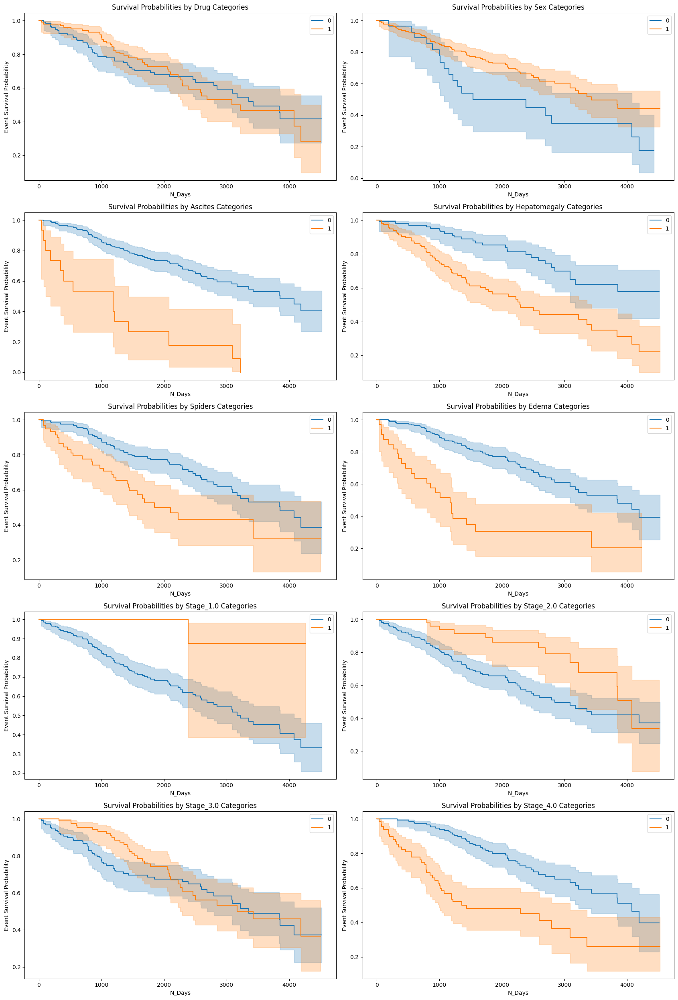

In [133]:
##################################
# Exploring the relationships between
# the object predictors with
# survival event and duration
##################################
plt.figure(figsize=(17, 25))
for i in range(0, len(cirrhosis_survival_object_predictors)):
    ax = plt.subplot(5, 2, i+1)
    for group in [0,1]:
        kmf.fit(durations=cirrhosis_survival_train_EDA[cirrhosis_survival_train_EDA[cirrhosis_survival_object_predictors[i]] == group]['N_Days'],
                event_observed=cirrhosis_survival_train_EDA[cirrhosis_survival_train_EDA[cirrhosis_survival_object_predictors[i]] == group]['Status'], label=group)
        kmf.plot_survival_function(ax=ax)
    plt.title(f'Survival Probabilities by {cirrhosis_survival_object_predictors[i]} Categories')
    plt.xlabel('N_Days')
    plt.ylabel('Event Survival Probability')
plt.tight_layout()
plt.show()

In [134]:
##################################
# Computing the log-rank test
# statistic and p-values
# between the event and duration variables
# with the object predictor columns
##################################
cirrhosis_survival_object_lrtest_event = {}
for object_column in cirrhosis_survival_object_predictors:
    groups = [0,1]
    group_0_event = cirrhosis_survival_train_EDA[cirrhosis_survival_train_EDA[object_column] == groups[0]]['Status']
    group_1_event = cirrhosis_survival_train_EDA[cirrhosis_survival_train_EDA[object_column] == groups[1]]['Status']
    group_0_duration = cirrhosis_survival_train_EDA[cirrhosis_survival_train_EDA[object_column] == groups[0]]['N_Days']
    group_1_duration = cirrhosis_survival_train_EDA[cirrhosis_survival_train_EDA[object_column] == groups[1]]['N_Days']
    lr_test = logrank_test(group_0_duration, group_1_duration,event_observed_A=group_0_event, event_observed_B=group_1_event)
    cirrhosis_survival_object_lrtest_event['Status_NDays_' + object_column] = (lr_test.test_statistic, lr_test.p_value)

In [135]:
##################################
# Formulating the log-rank test summary
# between the event and duration variables
# with the object predictor columns
##################################
cirrhosis_survival_object_lrtest_summary = cirrhosis_survival_train_EDA.from_dict(cirrhosis_survival_object_lrtest_event, orient='index')
cirrhosis_survival_object_lrtest_summary.columns = ['LR.Test.Statistic', 'LR.Test.PValue']
display(cirrhosis_survival_object_lrtest_summary.sort_values(by=['LR.Test.PValue'], ascending=True))

,LR.Test.Statistic,LR.Test.PValue
Status_NDays_Ascites,37.792220,7.869499e-10
Status_NDays_Edema,31.619652,1.875223e-08
Status_NDays_Stage_4.0,26.482676,2.659121e-07
Status_NDays_Hepatomegaly,20.360210,6.414988e-06
Status_NDays_Spiders,10.762275,1.035900e-03
Status_NDays_Stage_2.0,6.775033,9.244176e-03
Status_NDays_Sex,5.514094,1.886385e-02
Status_NDays_Stage_1.0,5.473270,1.930946e-02
Status_NDays_Stage_3.0,0.478031,4.893156e-01
Status_NDays_Drug,0.000016,9.968084e-01


In [136]:
##################################
# Creating an alternate copy of the 
# EDA data which will utilize
# binning for numeric predictors
##################################
cirrhosis_survival_train_EDA_binned = cirrhosis_survival_train_EDA.copy()

##################################
# Creating a function to bin
# numeric predictors into two groups
##################################
def bin_numeric_predictor(df, predictor):
    median = df[predictor].median()
    df[f'Binned_{predictor}'] = np.where(df[predictor] <= median, 0, 1)
    return df

##################################
# Binning the numeric predictors
# in the alternate EDA data into two groups
##################################
for numeric_column in cirrhosis_survival_numeric_predictors:
    cirrhosis_survival_train_EDA_binned = bin_numeric_predictor(cirrhosis_survival_train_EDA_binned, numeric_column)
    
##################################
# Formulating the binned numeric predictors
##################################    
cirrhosis_survival_binned_numeric_predictors = ["Binned_" + predictor for predictor in cirrhosis_survival_numeric_predictors]

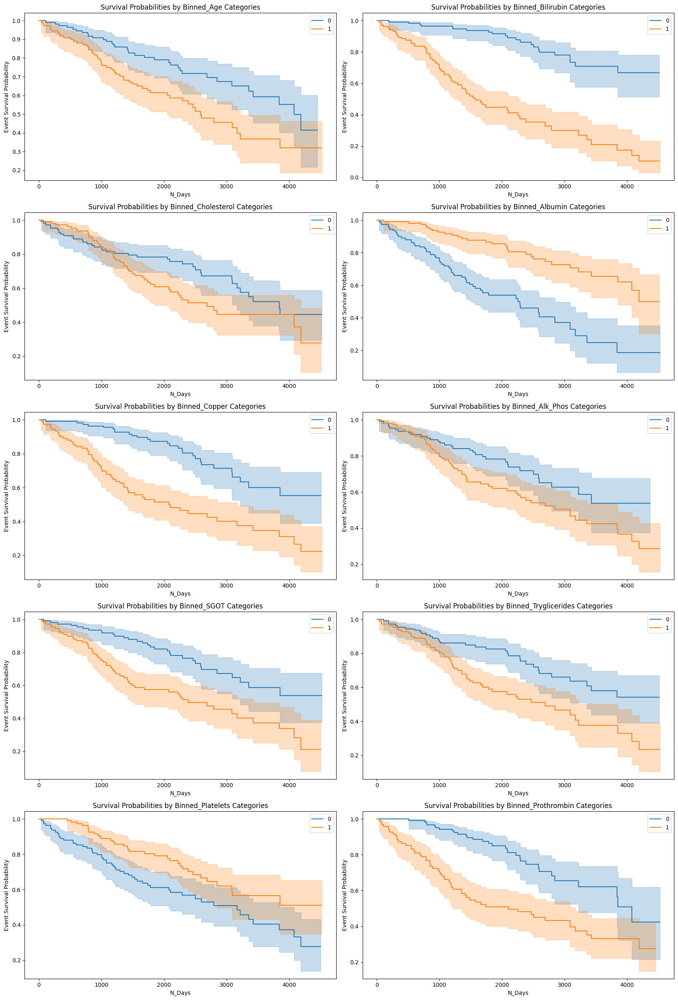

In [137]:
##################################
# Exploring the relationships between
# the binned numeric predictors with
# survival event and duration
##################################
plt.figure(figsize=(17, 25))
for i in range(0, len(cirrhosis_survival_binned_numeric_predictors)):
    ax = plt.subplot(5, 2, i+1)
    for group in [0,1]:
        kmf.fit(durations=cirrhosis_survival_train_EDA_binned[cirrhosis_survival_train_EDA_binned[cirrhosis_survival_binned_numeric_predictors[i]] == group]['N_Days'],
                event_observed=cirrhosis_survival_train_EDA_binned[cirrhosis_survival_train_EDA_binned[cirrhosis_survival_binned_numeric_predictors[i]] == group]['Status'], label=group)
        kmf.plot_survival_function(ax=ax)
    plt.title(f'Survival Probabilities by {cirrhosis_survival_binned_numeric_predictors[i]} Categories')
    plt.xlabel('N_Days')
    plt.ylabel('Event Survival Probability')
plt.tight_layout()
plt.show()

In [138]:
##################################
# Computing the log-rank test
# statistic and p-values
# between the event and duration variables
# with the binned numeric predictor columns
##################################
cirrhosis_survival_binned_numeric_lrtest_event = {}
for binned_numeric_column in cirrhosis_survival_binned_numeric_predictors:
    groups = [0,1]
    group_0_event = cirrhosis_survival_train_EDA_binned[cirrhosis_survival_train_EDA_binned[binned_numeric_column] == groups[0]]['Status']
    group_1_event = cirrhosis_survival_train_EDA_binned[cirrhosis_survival_train_EDA_binned[binned_numeric_column] == groups[1]]['Status']
    group_0_duration = cirrhosis_survival_train_EDA_binned[cirrhosis_survival_train_EDA_binned[binned_numeric_column] == groups[0]]['N_Days']
    group_1_duration = cirrhosis_survival_train_EDA_binned[cirrhosis_survival_train_EDA_binned[binned_numeric_column] == groups[1]]['N_Days']
    lr_test = logrank_test(group_0_duration, group_1_duration,event_observed_A=group_0_event, event_observed_B=group_1_event)
    cirrhosis_survival_binned_numeric_lrtest_event['Status_NDays_' + binned_numeric_column] = (lr_test.test_statistic, lr_test.p_value)

In [139]:
##################################
# Formulating the log-rank test summary
# between the event and duration variables
# with the binned numeric predictor columns
##################################
cirrhosis_survival_binned_numeric_lrtest_summary = cirrhosis_survival_train_EDA_binned.from_dict(cirrhosis_survival_binned_numeric_lrtest_event, orient='index')
cirrhosis_survival_binned_numeric_lrtest_summary.columns = ['LR.Test.Statistic', 'LR.Test.PValue']
display(cirrhosis_survival_binned_numeric_lrtest_summary.sort_values(by=['LR.Test.PValue'], ascending=True))

,LR.Test.Statistic,LR.Test.PValue
Status_NDays_Binned_Bilirubin,62.559303,2.585412e-15
Status_NDays_Binned_Albumin,29.444808,5.753197e-08
Status_NDays_Binned_Copper,27.452421,1.610072e-07
Status_NDays_Binned_Prothrombin,21.695995,3.194575e-06
Status_NDays_Binned_SGOT,16.178483,5.764520e-05
Status_NDays_Binned_Tryglicerides,11.512960,6.911262e-04
Status_NDays_Binned_Age,9.011700,2.682568e-03
Status_NDays_Binned_Platelets,6.741196,9.421142e-03
Status_NDays_Binned_Alk_Phos,5.503850,1.897465e-02
Status_NDays_Binned_Cholesterol,3.773953,5.205647e-02


### 1.6.1 Premodelling Data Description <a class="anchor" id="1.6.1"></a>

1. To improve interpretation, reduce dimensionality and avoid inducing design matrix singularity, 3 object predictors were dropped prior to modelling:
    * <span style="color: #FF0000">Stage_1.0</span>
    * <span style="color: #FF0000">Stage_2.0</span>
    * <span style="color: #FF0000">Stage_3.0</span>
2. To evaluate the feature selection capabilities of the candidate models, all remaining predictors were accounted during the model development process using the training subset:
    * **218 rows** (observations)
    * **19 columns** (variables)
        * **2/19 event | duration** (boolean | numeric)
             * <span style="color: #FF0000">Status</span>
             * <span style="color: #FF0000">N_Days</span>
        * **10/19 predictor** (numeric)
             * <span style="color: #FF0000">Age</span>
             * <span style="color: #FF0000">Bilirubin</span>
             * <span style="color: #FF0000">Cholesterol</span>
             * <span style="color: #FF0000">Albumin</span>
             * <span style="color: #FF0000">Copper</span>
             * <span style="color: #FF0000">Alk_Phos</span>
             * <span style="color: #FF0000">SGOT</span>
             * <span style="color: #FF0000">Triglycerides</span>
             * <span style="color: #FF0000">Platelets</span>
             * <span style="color: #FF0000">Prothrombin</span>
        * **7/19 predictor** (object)
             * <span style="color: #FF0000">Drug</span>
             * <span style="color: #FF0000">Sex</span>
             * <span style="color: #FF0000">Ascites</span>
             * <span style="color: #FF0000">Hepatomegaly</span>
             * <span style="color: #FF0000">Spiders</span>
             * <span style="color: #FF0000">Edema</span>
             * <span style="color: #FF0000">Stage_4.0</span>
3. Similarly, all remaining predictors were accounted during the model evaluation process using the testing subset:
    * **94 rows** (observations)
    * **19 columns** (variables)
        * **2/19 event | duration** (boolean | numeric)
             * <span style="color: #FF0000">Status</span>
             * <span style="color: #FF0000">N_Days</span>
        * **10/19 predictor** (numeric)
             * <span style="color: #FF0000">Age</span>
             * <span style="color: #FF0000">Bilirubin</span>
             * <span style="color: #FF0000">Cholesterol</span>
             * <span style="color: #FF0000">Albumin</span>
             * <span style="color: #FF0000">Copper</span>
             * <span style="color: #FF0000">Alk_Phos</span>
             * <span style="color: #FF0000">SGOT</span>
             * <span style="color: #FF0000">Triglycerides</span>
             * <span style="color: #FF0000">Platelets</span>
             * <span style="color: #FF0000">Prothrombin</span>
        * **7/19 predictor** (object)
             * <span style="color: #FF0000">Drug</span>
             * <span style="color: #FF0000">Sex</span>
             * <span style="color: #FF0000">Ascites</span>
             * <span style="color: #FF0000">Hepatomegaly</span>
             * <span style="color: #FF0000">Spiders</span>
             * <span style="color: #FF0000">Edema</span>
             * <span style="color: #FF0000">Stage_4.0</span>

In [140]:
##################################
# Formulating a complete dataframe
# from the training subset for modelling
##################################
cirrhosis_survival_y_train_cleaned.reset_index(drop=True, inplace=True)
cirrhosis_survival_train_modeling = pd.concat([cirrhosis_survival_y_train_cleaned,
                                               cirrhosis_survival_X_train_preprocessed],
                                              axis=1)
cirrhosis_survival_train_modeling.drop(columns=['Stage_1.0', 'Stage_2.0', 'Stage_3.0'], axis=1, inplace=True)
cirrhosis_survival_train_modeling['Stage_4.0'] = cirrhosis_survival_train_modeling['Stage_4.0'].replace({True: 1, False: 0})
cirrhosis_survival_train_modeling.head()

,Status,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Stage_4.0
0,False,2475,-1.342097,0.863802,0.886087,-0.451884,-0.972098,0.140990,0.104609,0.155130,0.540960,0.747580,1,1,0,0,0,0,0
1,False,877,-1.470901,0.516350,1.554523,0.827618,0.467579,-0.705337,0.301441,1.275222,0.474140,-0.315794,1,0,0,0,0,0,0
2,False,3050,-0.239814,-0.625875,0.293280,0.646582,-0.241205,-0.848544,0.275723,-1.684460,0.756741,0.087130,1,1,0,0,0,0,0
3,True,110,-0.052733,0.559437,-1.534283,0.354473,-0.284113,-0.014525,0.162878,-0.189139,-1.735375,0.649171,0,1,1,1,1,1,1
4,True,3839,-0.795010,1.142068,-0.108933,-0.272913,0.618030,2.071847,1.434674,-0.212684,-0.675951,-0.315794,0,1,0,1,0,0,0


In [141]:
##################################
# Formulating a complete dataframe
# from the testing subset for modelling
##################################
cirrhosis_survival_y_test_cleaned.reset_index(drop=True, inplace=True)
cirrhosis_survival_test_modeling = pd.concat([cirrhosis_survival_y_test_cleaned,
                                               cirrhosis_survival_X_test_preprocessed],
                                              axis=1)
cirrhosis_survival_test_modeling.drop(columns=['Stage_1.0', 'Stage_2.0', 'Stage_3.0'], axis=1, inplace=True)
cirrhosis_survival_test_modeling['Stage_4.0'] = cirrhosis_survival_test_modeling['Stage_4.0'].replace({True: 1, False: 0})
cirrhosis_survival_test_modeling.head()

,Status,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Stage_4.0
0,False,3336,1.043704,0.744396,0.922380,0.240951,0.045748,0.317282,-0.078335,2.671950,1.654815,-0.948196,1,1,0,0,1,1,0
1,False,1321,-1.936476,-0.764558,0.160096,-0.600950,-0.179138,-0.245613,0.472422,-0.359800,0.348533,0.439089,0,1,0,0,0,0,1
2,False,1435,-1.749033,0.371523,0.558115,0.646582,-0.159024,0.339454,0.685117,-3.109146,-0.790172,-0.617113,1,1,0,1,0,0,1
3,False,4459,-0.485150,-0.918484,-0.690904,1.629765,0.028262,1.713791,-1.387751,0.155130,0.679704,0.087130,1,0,0,0,0,0,0
4,False,2721,-0.815655,1.286438,2.610501,-0.722153,0.210203,0.602860,3.494936,-0.053214,-0.475634,-1.714435,0,1,0,1,0,0,0


### 1.6.2 Weibull Accelerated Failure Time Model <a class="anchor" id="1.6.2"></a>

[Survival Analysis](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) deals with the analysis of time-to-event data. It focuses on the expected duration of time until one or more events of interest occur, such as death, failure, or relapse. This type of analysis is used to study and model the time until the occurrence of an event, taking into account that the event might not have occurred for all subjects during the study period. Several key aspects of survival analysis include the survival function which refers to the probability that an individual survives longer than a certain time, hazard function which describes the instantaneous rate at which events occur, given no prior event, and censoring pertaining to a condition where the event of interest has not occurred for some subjects during the observation period.

[Right-Censored Survival Data](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) occurs when the event of interest has not happened for some subjects by the end of the study period or the last follow-up time. This type of censoring is common in survival analysis because not all individuals may experience the event before the study ends, or they might drop out or be lost to follow-up. Right-censored data is crucial in survival analysis as it allows the inclusion of all subjects in the analysis, providing more accurate and reliable estimates.

[Accelerated Failure Time Models](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) are a class of survival analysis models used to analyze time-to-event data by directly modelling the survival time itself. An AFT model assumes that the effect of covariates accelerates or decelerates the life time of an event by some constant factor. The mathematical equation is represented by the logarithm of the survival time being equal to the sum of the vector of covariates multiplied to the vector of regression coefficients; and the product of the scale parameter and a random variable with a specified distribution. In an AFT model, the coefficients represent the multiplicative effect on the survival time. An exponentiated regression coefficient greater than one prolongs survival time, while a value less than one shortens it. The scale parameter determines the spread or variability of survival times. AFT models assume that the effect of covariates on survival time is multiplicative and that the survival times can be transformed to follow a specific distribution.

[Weibull Accelerated Failure Time Models](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) assumes that the survival time errors follow a Weibull distribution. The mathematical equation is represented by the logarithm of the survival time being equal to the sum of the vector of covariates multiplied to the vector of regression coefficients; and the product of the scale parameter and a Weibull-distributed error term. This model is flexible as it can model both increasing and decreasing hazard rates over time and can be used to model various types of survival data. However, the results may be complex to interpret if the shape parameter does not align well with the data, and the model can also be sensitive to the distributional assumptions.

[Weibull Accelerated Failure Time Models](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) assumes that the survival time errors follow a Weibull distribution. The mathematical equation is represented by the logarithm of the survival time being equal to the sum of the vector of covariates multiplied to the vector of regression coefficients; and the product of the scale parameter and a Weibull-distributed error term. This model is flexible as it can model both increasing and decreasing hazard rates over time and can be used to model various types of survival data. However, the results may be complex to interpret if the shape parameter does not align well with the data, and the model can also be sensitive to the distributional assumptions.

[Concordance Index](https://lifelines.readthedocs.io/en/latest/lifelines.utils.html) measures the model's ability to correctly order pairs of observations based on their predicted survival times. Values range from 0.5 to 1.0 indicating no predictive power (random guessing) and perfect predictions, respectively. As a metric, it provides a measure of discriminative ability and useful for ranking predictions. However, it does not provide information on the magnitude of errors and may be insensitive to the calibration of predicted survival probabilities.

[Mean Absolute Error](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_absolute_error.html) measures the average magnitude of the errors between predicted and actual survival times. Lower MAE values indicate better model performance, while reflecting the average prediction error in the same units as the survival time. As a metric, it is intuitive and easy to interpret while providing a direct measure of prediction accuracy. However, it may be sensitive to outliers and does not consider the probabilistic nature of survival predictions.

[Brier Score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.brier_score_loss.html) measures the accuracy of probabilistic predictions of survival at a specific time point. Values range from 0 to 1 with a lower brier scores indicating better accuracy. A Brier score of 0 indicates perfect predictions, while a score of 1 indicates the worst possible predictions. As a metric, it considers both discrimination and calibration, while reflecting the accuracy of predicted survival probabilities. However, it requires specifying a time point and aggregating scores over time points may be less interpretable.

1. The [weibull accelerated failure time model](https://lifelines.readthedocs.io/en/latest/fitters/regression/WeibullAFTFitter.html) from the <mark style="background-color: #CCECFF"><b>lifelines.WeibullAFTFitter</b></mark> Python library API was implemented. 
2. The model implementation used 1 hyperparameter:
    * <span style="color: #FF0000">penalizer</span> = penalty to the size of the coefficients during regression fixed at a value = 0.30
3. Only 3 of the 17 predictors, which were determined by the model as statistically significant, were used for prediction:
    * <span style="color: #FF0000">Bilirubin</span>: Increase in value associated with a decrease in time to event 
    * <span style="color: #FF0000">Prothrombin</span>: Increase in value associated with a decrease in time to event 
    * <span style="color: #FF0000">Age</span>: Increase in value associated with a decrease in time to event 
4. The cross-validated model performance of the model is summarized as follows:
    * **Concordance Index** = 0.8250
    * **Mean Absolute Error** = 2303.6056
    * **Brier Score** = 0.5125
5. The apparent model performance of the model is summarized as follows:
    * **Concordance Index** = 0.8291
    * **Mean Absolute Error** = 2280.7437
    * **Brier Score** = 0.5151
6. The independent test model performance of the model is summarized as follows:
    * **Concordance Index** = 0.8526
    * **Mean Absolute Error** = 1948.8733
    * **Brier Score** = 0.5375
7. Comparable apparent and cross-validated model performance was observed, indicative of the presence of minimal model overfitting.
8. The MAE for event observations were typically lower because the errors were directly tied to the observed event times, which are known and can be more accurately predicted. For censored observations, the prediction error reflects the model's inability to pinpoint the exact event time, leading to higher MAE due to the larger variability and the longer tail of potential event times beyond the censoring point.
9. Survival probability curves estimated for all cases. Shorter median survival times were observed for:
    * Event cases as compared to censored cases
    * Higher values for <span style="color: #FF0000">Bilirubin</span> as compared to lower values
    * Higher values for <span style="color: #FF0000">Prothrombin</span> as compared to lower values
    * Higher values for <span style="color: #FF0000">Age</span> as compared to lower values
10. SHAP values were computed for the significant predictors, with contributions to the model output ranked as follows:
    * Higher values for <span style="color: #FF0000">Bilirubin</span> result to the event expected to occur sooner
    * Higher values for <span style="color: #FF0000">Prothrombin</span> result to the event expected to occur sooner
    * Higher values for <span style="color: #FF0000">Age</span> result to the event expected to occur sooner

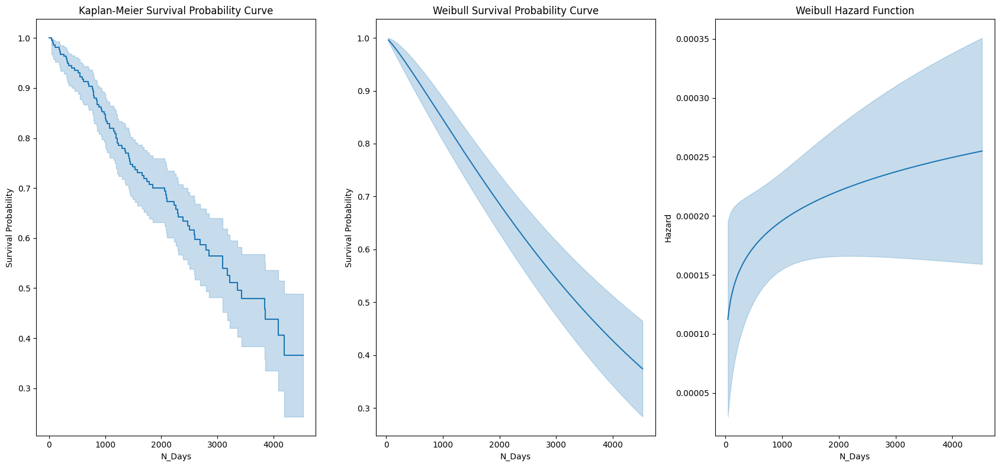

In [142]:
##################################
# Assessing the survival probability 
# and hazard function plots
# with a Weibull distribution
##################################
cirrhosis_survival_weibull = WeibullFitter()
cirrhosis_survival_weibull.fit(durations=cirrhosis_survival_train_modeling['N_Days'], 
                               event_observed=cirrhosis_survival_train_modeling['Status'])

##################################
# Fitting a Kaplan-Meier estimation
##################################
cirrhosis_survival_km = KaplanMeierFitter()
cirrhosis_survival_km.fit(durations=cirrhosis_survival_train_modeling['N_Days'],
                          event_observed=cirrhosis_survival_train_modeling['Status'])

##################################
# Generating the survival probability 
# and hazard function plots
##################################
plt.figure(figsize=(17, 8))

##################################
# Generating the Kaplan-Meier
# survival probability plot
##################################
plt.subplot(1, 3, 1)
cirrhosis_survival_km.plot_survival_function()
plt.title("Kaplan-Meier Survival Probability Curve")
plt.xlabel("N_Days")
plt.ylabel("Survival Probability")
plt.legend('',frameon=False)

##################################
# Generating the Weibull
# survival probability plot
##################################
plt.subplot(1, 3, 2)
cirrhosis_survival_weibull.plot_survival_function()
plt.title("Weibull Survival Probability Curve")
plt.xlabel("N_Days")
plt.ylabel("Survival Probability")
plt.legend('',frameon=False)

##################################
# Generating the Weibull
# hazard function plot
##################################
plt.subplot(1, 3, 3)
cirrhosis_survival_weibull.plot_hazard()
plt.title("Weibull Hazard Function")
plt.xlabel("N_Days")
plt.ylabel("Hazard")
plt.legend('',frameon=False)

##################################
# Consolidating all plots
##################################
plt.tight_layout()
plt.show()

In [143]:
##################################
# Formulating the Accelerated Failure Time model
# based on a Weibull distribution
# and generating the summary
##################################
cirrhosis_survival_aft_weibull = WeibullAFTFitter(penalizer=0.30)
cirrhosis_survival_aft_weibull.fit(cirrhosis_survival_train_modeling, duration_col='N_Days', event_col='Status')
cirrhosis_survival_aft_weibull.print_summary()

<lifelines.WeibullAFTFitter: fitted with 218 total observations, 131 right-censored observations>
             duration col = 'N_Days'
                event col = 'Status'
                penalizer = 0.3
   number of observations = 218
number of events observed = 87
           log-likelihood = -777.86
         time fit was run = 2024-10-14 07:41:30 UTC

---
                       coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
param   covariate                                                                                                      
lambda_ Age           -0.17      0.85      0.07           -0.30           -0.03                0.74                0.98
        Albumin        0.10      1.10      0.08           -0.05            0.25                0.95                1.28
        Alk_Phos      -0.04      0.96      0.07           -0.18            0.11                0.83                1.11
        Ascites       -0.20      0.82      0.23           -0.66            0.26                0.51                1.29
        Bilirubin     -0.29      0.75      0.09           -0.46           -0.12                0.63                0.88
        Cholesterol   -0.05      0.95      0.08           -0.20            0.10                0.82                1.11
        Copper        -0.11      0.89      0.08           -0.27            0.04                0.77                1.04
        Drug           0.10      1.10      0.14           -0.17            0.37                0.84                1.44
        Edema         -0.33      0.72      0.18           -0.68            0.01                0.51                1.01
        Hepatomegaly  -0.11      0.90      0.15           -0.40            0.19                0.67                1.20
        Platelets      0.05      1.06      0.07           -0.08            0.19                0.92                1.21
        Prothrombin   -0.19      0.83      0.08           -0.34           -0.05                0.71                0.96
        SGOT          -0.11      0.90      0.08           -0.26            0.04                0.77                1.04
        Sex            0.02      1.02      0.19           -0.35            0.40                0.70                1.49
        Spiders       -0.04      0.96      0.16           -0.35            0.27                0.71                1.30
        Stage_4.0     -0.15      0.86      0.16           -0.46            0.16                0.63                1.17
        Tryglicerides -0.06      0.94      0.07           -0.20            0.08                0.82                1.08
        Intercept      8.52   5006.58      0.21            8.10            8.94             3292.49             7613.01
rho_    Intercept      0.34      1.41      0.07            0.20            0.49                1.22                1.63

                       cmp to     z      p  -log2(p)
param   covariate                                   
lambda_ Age              0.00 -2.31   0.02      5.59
        Albumin          0.00  1.27   0.20      2.29
        Alk_Phos         0.00 -0.52   0.60      0.74
        Ascites          0.00 -0.87   0.38      1.38
        Bilirubin        0.00 -3.39 <0.005     10.47
        Cholesterol      0.00 -0.61   0.54      0.89
        Copper           0.00 -1.46   0.15      2.79
        Drug             0.00  0.71   0.48      1.07
        Edema            0.00 -1.88   0.06      4.05
        Hepatomegaly     0.00 -0.72   0.47      1.08
        Platelets        0.00  0.77   0.44      1.18
        Prothrombin      0.00 -2.56   0.01      6.57
        SGOT             0.00 -1.44   0.15      2.74
        Sex              0.00  0.11   0.91      0.14
        Spiders          0.00 -0.26   0.79      0.33
        Stage_4.0        0.00 -0.96   0.34      1.56
        Tryglicerides    0.00 -0.88   0.38      1.40
        Intercept        0.00 39.84 <0.005       inf
rho_    Intercept        0.00  4.61 <0.005     17.96
---
Co

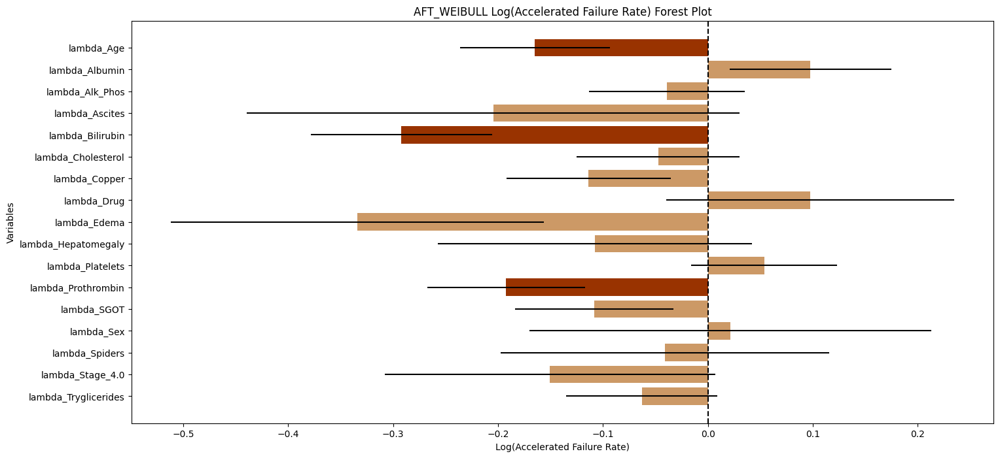

In [144]:
##################################
# Plotting the log accelerated failure rate of the
# formulated Accelerated Failure Time model
# based on a Weibull distribution
##################################
cirrhosis_survival_aft_weibull_summary = cirrhosis_survival_aft_weibull.summary
cirrhosis_survival_aft_weibull_summary_params = pd.DataFrame(cirrhosis_survival_aft_weibull.params_)
significant = cirrhosis_survival_aft_weibull_summary['p'] < 0.05
cirrhosis_survival_aft_weibull_summary_log_accelerated_failure_rate = (list(cirrhosis_survival_aft_weibull_summary_params.iloc[:,0].values))
plt.figure(figsize=(17, 8))
colors = ['#993300' if sig else '#CC9966' for sig in significant]

plt.barh([(index[0] + index[1]) for index in cirrhosis_survival_aft_weibull_summary_params.index[0:17]], 
         cirrhosis_survival_aft_weibull_summary_log_accelerated_failure_rate[0:17], 
         xerr=cirrhosis_survival_aft_weibull_summary['se(coef)'][0:17], 
         color=colors)
plt.xlabel('Log(Accelerated Failure Rate)')
plt.ylabel('Variables')
plt.title('AFT_WEIBULL Log(Accelerated Failure Rate) Forest Plot')
plt.axvline(x=0, color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.show()

In [145]:
##################################
# Determining the number of
# significant predictors
##################################
cirrhosis_survival_aft_weibull_significant = sum(cirrhosis_survival_aft_weibull_summary['p'] < 0.05)
display(f"Number of Significant Predictors: {cirrhosis_survival_aft_weibull_significant-2}")

'Number of Significant Predictors: 3'

In [146]:
##################################
# Formulating the Accelerated Failure Time model
# based on a Weibull distribution,
# using the significant predictors only
# and generating the summary
##################################
feature_subset = ['Bilirubin','Prothrombin','Age','N_Days','Status']
cirrhosis_survival_aft_weibull = WeibullAFTFitter(penalizer=0.30)
cirrhosis_survival_aft_weibull.fit(cirrhosis_survival_train_modeling[feature_subset], duration_col='N_Days', event_col='Status')
cirrhosis_survival_aft_weibull.print_summary()

<lifelines.WeibullAFTFitter: fitted with 218 total observations, 131 right-censored observations>
             duration col = 'N_Days'
                event col = 'Status'
                penalizer = 0.3
   number of observations = 218
number of events observed = 87
           log-likelihood = -789.68
         time fit was run = 2024-10-14 07:41:31 UTC

---
                     coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
param   covariate                                                                                                    
lambda_ Age         -0.19      0.83      0.06           -0.31           -0.06                0.73                0.94
        Bilirubin   -0.51      0.60      0.07           -0.64           -0.38                0.53                0.68
        Prothrombin -0.27      0.77      0.07           -0.40           -0.13                0.67                0.88
        Intercept    8.36   4272.85      0.09            8.19            8.53             3594.18             5079.66
rho_    Intercept    0.35      1.42      0.07            0.21            0.50                1.23                1.64

                     cmp to     z      p  -log2(p)
param   covariate                                 
lambda_ Age            0.00 -2.97 <0.005      8.40
        Bilirubin      0.00 -7.56 <0.005     44.52
        Prothrombin    0.00 -3.85 <0.005     13.03
        Intercept      0.00 94.73 <0.005       inf
rho_    Intercept      0.00  4.74 <0.005     18.81
---
Concordance = 0.83
AIC = 1589.35
log-likelihood ratio test = 78.11 on 3 df
-log2(p) of ll-ratio test = 53.51

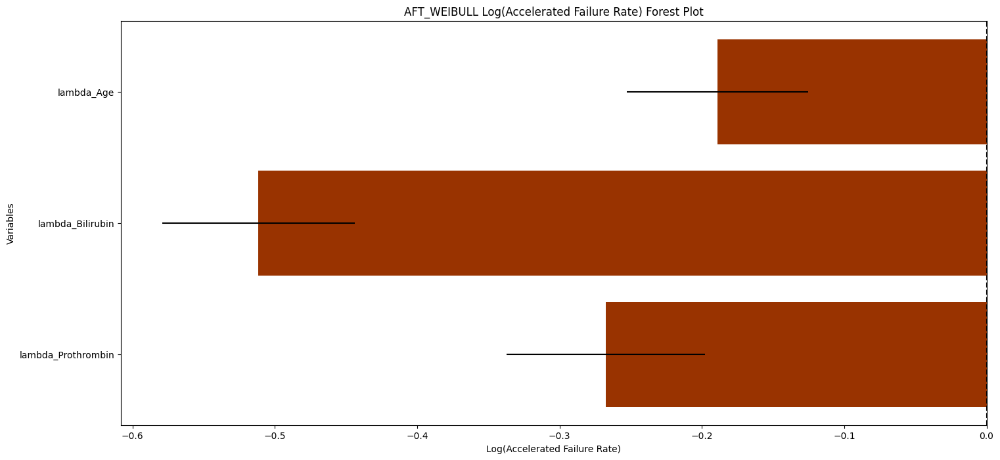

In [147]:
##################################
# Plotting the log accelerated failure rate of the
# formulated Accelerated Failure Time model
# using the significant predictors only
# based on a Weibull distribution
##################################
cirrhosis_survival_aft_weibull_summary = cirrhosis_survival_aft_weibull.summary
cirrhosis_survival_aft_weibull_summary_params = pd.DataFrame(cirrhosis_survival_aft_weibull.params_)
significant = cirrhosis_survival_aft_weibull_summary['p'] < 0.05
cirrhosis_survival_aft_weibull_summary_log_accelerated_failure_rate = (list(cirrhosis_survival_aft_weibull_summary_params.iloc[:,0].values))
plt.figure(figsize=(17, 8))
colors = ['#993300' if sig else '#CC9966' for sig in significant]

plt.barh([(index[0] + index[1]) for index in cirrhosis_survival_aft_weibull_summary_params.index[0:3]], 
         cirrhosis_survival_aft_weibull_summary_log_accelerated_failure_rate[0:3], 
         xerr=cirrhosis_survival_aft_weibull_summary['se(coef)'][0:3], 
         color=colors)
plt.xlabel('Log(Accelerated Failure Rate)')
plt.ylabel('Variables')
plt.title('AFT_WEIBULL Log(Accelerated Failure Rate) Forest Plot')
plt.axvline(x=0, color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.show()

In [148]:
##################################
# Gathering the apparent model performance
# as baseline for evaluating overfitting
##################################
cirrhosis_survival_aft_weibull.fit(cirrhosis_survival_train_modeling[feature_subset], duration_col='N_Days', event_col='Status')
train_predictions = cirrhosis_survival_aft_weibull.predict_median(cirrhosis_survival_train_modeling)
cirrhosis_survival_aft_weibull_train_ci = concordance_index(cirrhosis_survival_train_modeling['N_Days'], 
                                                            train_predictions, 
                                                            cirrhosis_survival_train_modeling['Status'])
time_point = cirrhosis_survival_train_modeling['N_Days'].median()
cirrhosis_survival_aft_weibull_train_mae = mean_absolute_error(cirrhosis_survival_train_modeling['N_Days'], train_predictions)
cirrhosis_survival_aft_weibull_train_brier = brier_score_loss(cirrhosis_survival_train_modeling['Status'], 
                                                              cirrhosis_survival_aft_weibull.predict_survival_function(cirrhosis_survival_train_modeling, 
                                                                                                                       times=[time_point]).T[time_point])
display(f"Apparent Concordance Index: {cirrhosis_survival_aft_weibull_train_ci}")
display(f"Apparent MAE: {cirrhosis_survival_aft_weibull_train_mae}")
display(f"Apparent Brier Score: {cirrhosis_survival_aft_weibull_train_brier}")

'Apparent Concordance Index: 0.8290799739921977'

'Apparent MAE: 2280.743783352582'

'Apparent Brier Score: 0.5151484140783107'

In [149]:
##################################
# Performing 5-Fold Cross-Validation
# on the training data
##################################
kf = KFold(n_splits=5, shuffle=True, random_state=88888888)
ci_scores = []
mae_scores = []
brier_scores = []

for train_index, val_index in kf.split(cirrhosis_survival_train_modeling):
    df_train_fold = cirrhosis_survival_train_modeling.iloc[train_index]
    df_val_fold = cirrhosis_survival_train_modeling.iloc[val_index]
    
    cirrhosis_survival_aft_weibull.fit(df_train_fold[feature_subset], duration_col='N_Days', event_col='Status')
    val_predictions = cirrhosis_survival_aft_weibull.predict_median(df_val_fold)
    time_point = df_val_fold['N_Days'].median()
    ci = concordance_index(df_val_fold['N_Days'], val_predictions, df_val_fold['Status'])
    mae = mean_absolute_error(df_val_fold['N_Days'], val_predictions)
    brier = brier_score_loss(df_val_fold['Status'],
                             cirrhosis_survival_aft_weibull.predict_survival_function(df_val_fold, 
                                                                                      times=[time_point]).T[time_point])
    ci_scores.append(ci)
    mae_scores.append(mae)
    brier_scores.append(brier)

cirrhosis_survival_aft_weibull_cv_ci_mean = np.mean(ci_scores)
cirrhosis_survival_aft_weibull_cv_ci_std = np.std(ci_scores)
cirrhosis_survival_aft_weibull_cv_mae_mean = np.mean(mae_scores)
cirrhosis_survival_aft_weibull_cv_brier_mean = np.mean(brier_scores)

display(f"Cross-Validated Concordance Index: {cirrhosis_survival_aft_weibull_cv_ci_mean}")
display(f"Cross-Validated MAE: {cirrhosis_survival_aft_weibull_cv_mae_mean}")
display(f"Cross-Validated Brier Score: {cirrhosis_survival_aft_weibull_cv_brier_mean}")

'Cross-Validated Concordance Index: 0.82500812019991'

'Cross-Validated MAE: 2303.605627546008'

'Cross-Validated Brier Score: 0.5125825238516044'

In [150]:
##################################
# Evaluating the model performance
# on test data
##################################
test_predictions = cirrhosis_survival_aft_weibull.predict_median(cirrhosis_survival_test_modeling)
cirrhosis_survival_aft_weibull_test_ci = concordance_index(cirrhosis_survival_test_modeling['N_Days'], 
                                                           test_predictions, 
                                                           cirrhosis_survival_test_modeling['Status'])
time_point = cirrhosis_survival_test_modeling['N_Days'].median()
cirrhosis_survival_aft_weibull_test_mae = mean_absolute_error(cirrhosis_survival_test_modeling['N_Days'], test_predictions)
cirrhosis_survival_aft_weibull_test_brier = brier_score_loss(cirrhosis_survival_test_modeling['Status'], 
                                                              cirrhosis_survival_aft_weibull.predict_survival_function(cirrhosis_survival_test_modeling, 
                                                                                                                       times=[time_point]).T[time_point])
display(f"Apparent Concordance Index: {cirrhosis_survival_aft_weibull_test_ci}")
display(f"Apparent MAE: {cirrhosis_survival_aft_weibull_test_mae}")
display(f"Apparent Brier Score: {cirrhosis_survival_aft_weibull_test_brier}")

'Apparent Concordance Index: 0.8526077097505669'

'Apparent MAE: 1948.8733802238894'

'Apparent Brier Score: 0.5375559341601058'

In [151]:
##################################
# Gathering the model performance metrics
# from training, cross-validation and test
##################################
aft_weibull_set = pd.DataFrame(["Train","Cross-Validation","Test"]*3)
aft_weibull_metric = pd.DataFrame((["Concordance.Index"]*3) + (["MAE"]*3) + (["Brier.Score"]*3))
aft_weibull_metric_values = pd.DataFrame([cirrhosis_survival_aft_weibull_train_ci,
                                           cirrhosis_survival_aft_weibull_cv_ci_mean,
                                           cirrhosis_survival_aft_weibull_test_ci,
                                           cirrhosis_survival_aft_weibull_train_mae,
                                           cirrhosis_survival_aft_weibull_cv_mae_mean,
                                           cirrhosis_survival_aft_weibull_test_mae,
                                           cirrhosis_survival_aft_weibull_train_brier,
                                           cirrhosis_survival_aft_weibull_cv_brier_mean,
                                           cirrhosis_survival_aft_weibull_test_brier])
aft_weibull_method = pd.DataFrame(["AFT_WEIBULL"]*9)
aft_weibull_summary = pd.concat([aft_weibull_set,
                                       aft_weibull_metric,
                                       aft_weibull_metric_values,
                                       aft_weibull_method], 
                                      axis=1)
aft_weibull_summary.columns = ['Set', 'Metric', 'Value', 'Method']
aft_weibull_summary.reset_index(inplace=True, drop=True)
display(aft_weibull_summary)

,Set,Metric,Value,Method
0,Train,Concordance.Index,0.829080,AFT_WEIBULL
1,Cross-Validation,Concordance.Index,0.825008,AFT_WEIBULL
2,Test,Concordance.Index,0.852608,AFT_WEIBULL
3,Train,MAE,2280.743783,AFT_WEIBULL
4,Cross-Validation,MAE,2303.605628,AFT_WEIBULL
5,Test,MAE,1948.873380,AFT_WEIBULL
6,Train,Brier.Score,0.515148,AFT_WEIBULL
7,Cross-Validation,Brier.Score,0.512583,AFT_WEIBULL
8,Test,Brier.Score,0.537556,AFT_WEIBULL


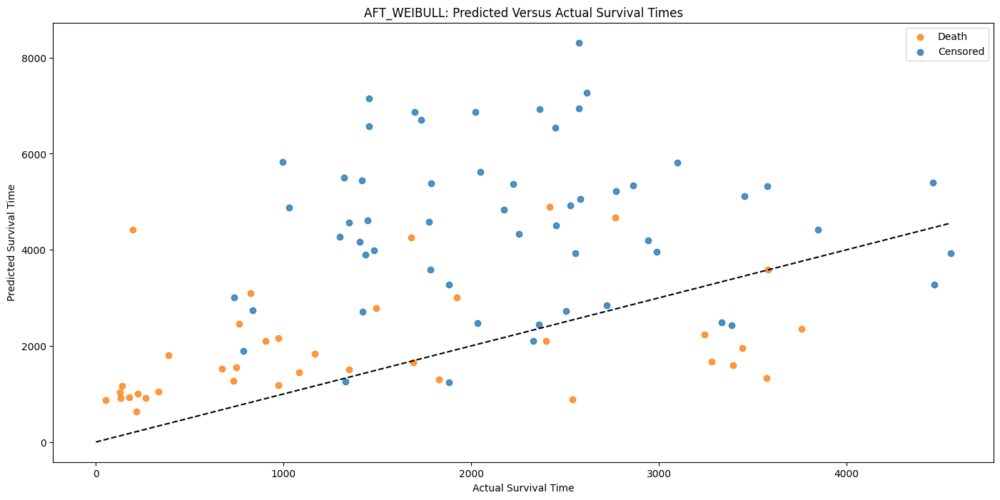

In [152]:
##################################
# Evaluating the predicted
# and actual survival times
##################################
predicted_survival_times = cirrhosis_survival_aft_weibull.predict_median(cirrhosis_survival_test_modeling)
fig, ax = plt.subplots(figsize=(17, 8))
for status, color, label in zip([True, False], ['#FF7F0E','#1F77B4'], ['Death', 'Censored']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Status'] == status]
    ax.scatter(subset['N_Days'], predicted_survival_times.iloc[subset.index], c=color, label=label, alpha=0.8)
ax.set_xlabel('Actual Survival Time')
ax.set_ylabel('Predicted Survival Time')
ax.set_title('AFT_WEIBULL: Predicted Versus Actual Survival Times')
ax.legend()
plt.plot([0, cirrhosis_survival_test_modeling['N_Days'].max()], 
         [0, cirrhosis_survival_test_modeling['N_Days'].max()], 
         color='black', linestyle='--')
plt.show()

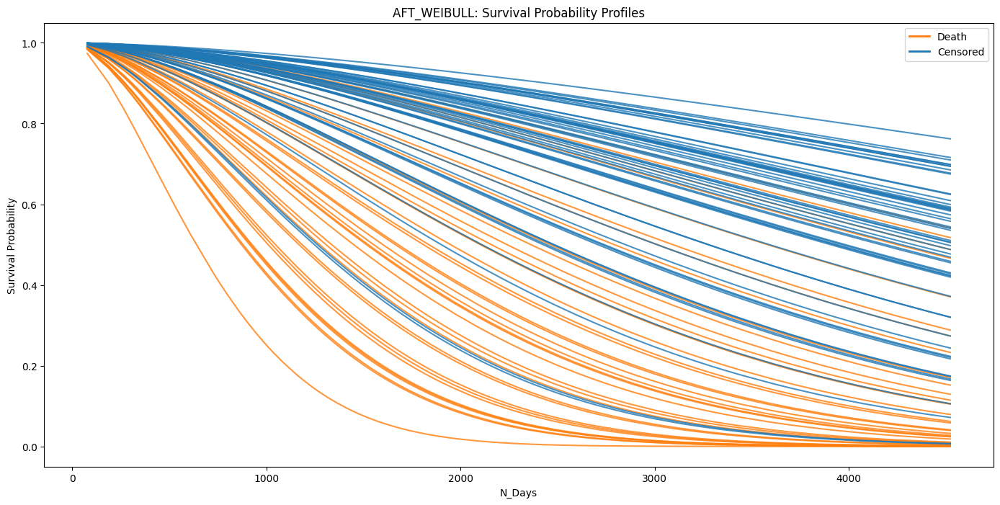

In [153]:
##################################
# Plotting the individual
# survival probability profiles
##################################
plt.figure(figsize=(17, 8))
for status, color, label in zip([True, False], ['#FF7F0E','#1F77B4'], ['Death', 'Censored']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Status'] == status]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_weibull.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_WEIBULL: Survival Probability Profiles')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
death_patch = plt.Line2D([0], [0], color='#FF7F0E', lw=2, label='Death')
censored_patch = plt.Line2D([0], [0], color='#1F77B4', lw=2, label='Censored')
plt.legend(handles=[death_patch, censored_patch])
plt.show()

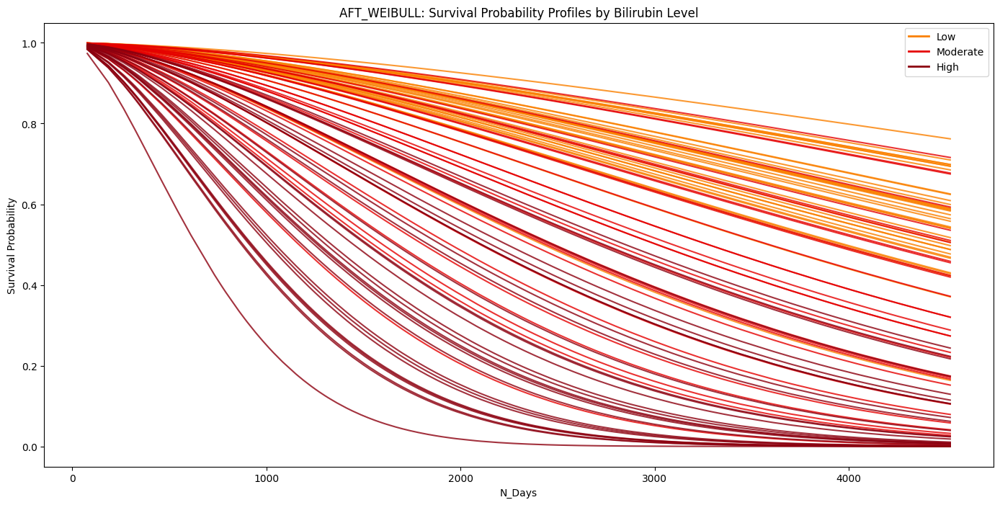

In [154]:
##################################
# Plotting the individual
# survival probability profiles
# for the discretized Bilirubin predictor
##################################
cirrhosis_survival_test_modeling['Bilirubin_Level'] = pd.qcut(cirrhosis_survival_test_modeling['Bilirubin'], 3, labels=['Low','Moderate','High'])
plt.figure(figsize=(17, 8))
for bilirubin_level, color, label in zip(['Low', 'Moderate', 'High'], ['#FA8000','#E50000', '#8C000F'], ['Low', 'Moderate', 'High']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Bilirubin_Level'] == bilirubin_level]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_weibull.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_WEIBULL: Survival Probability Profiles by Bilirubin Level')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
low_patch = plt.Line2D([0], [0], color='#FA8000', lw=2, label='Low')
moderate_patch = plt.Line2D([0], [0], color='#E50000', lw=2, label='Moderate')
high_patch = plt.Line2D([0], [0], color='#8C000F', lw=2, label='High')
plt.legend(handles=[low_patch, moderate_patch, high_patch])
plt.show()

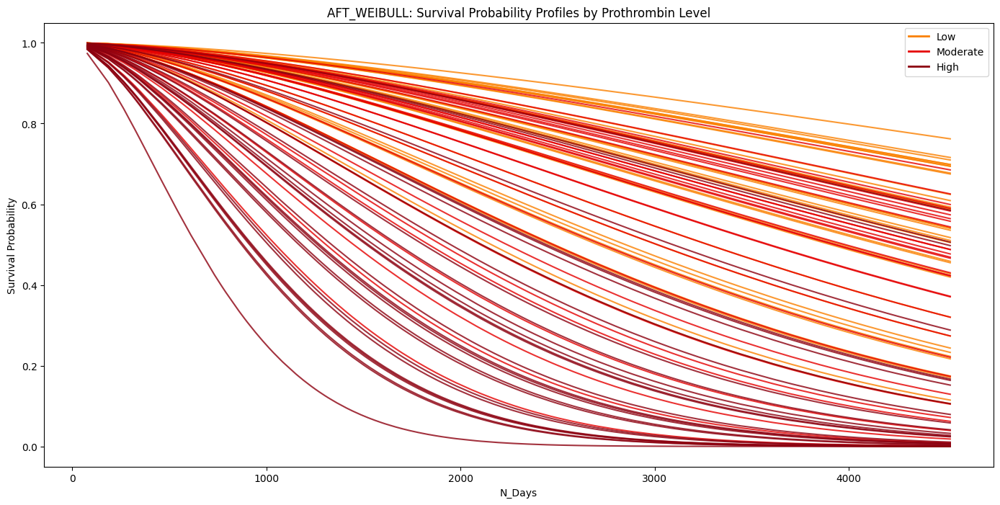

In [155]:
##################################
# Plotting the individual
# survival probability profiles
# for the discretized Prothrombin predictor
##################################
cirrhosis_survival_test_modeling['Prothrombin_Level'] = pd.qcut(cirrhosis_survival_test_modeling['Prothrombin'], 3, labels=['Low','Moderate','High'])
plt.figure(figsize=(17, 8))
for prothrombin_level, color, label in zip(['Low', 'Moderate', 'High'], ['#FA8000','#E50000', '#8C000F'], ['Low', 'Moderate', 'High']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Prothrombin_Level'] == prothrombin_level]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_weibull.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_WEIBULL: Survival Probability Profiles by Prothrombin Level')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
low_patch = plt.Line2D([0], [0], color='#FA8000', lw=2, label='Low')
moderate_patch = plt.Line2D([0], [0], color='#E50000', lw=2, label='Moderate')
high_patch = plt.Line2D([0], [0], color='#8C000F', lw=2, label='High')
plt.legend(handles=[low_patch, moderate_patch, high_patch])
plt.show()

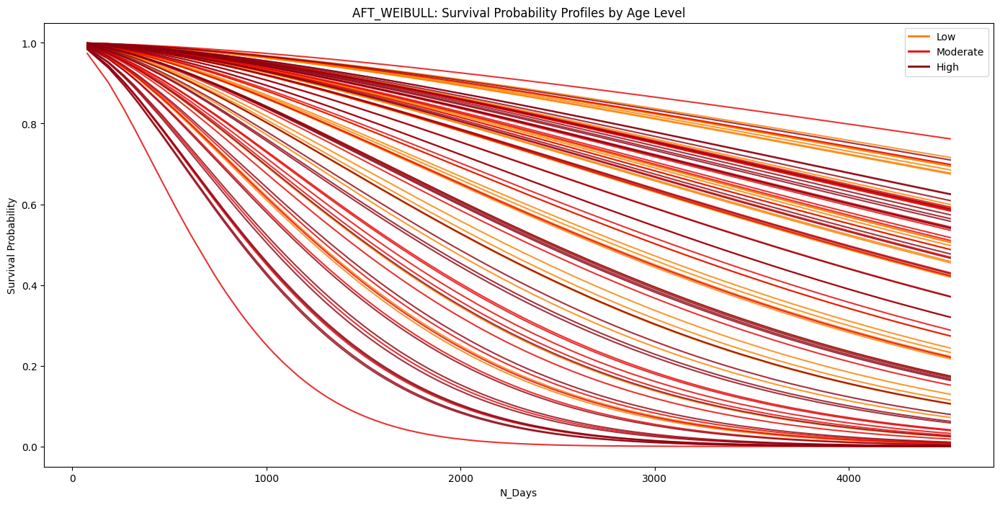

In [156]:
##################################
# Plotting the individual
# survival probability profiles
# for the discretized Age predictor
##################################
cirrhosis_survival_test_modeling['Age_Level'] = pd.qcut(cirrhosis_survival_test_modeling['Age'], 3, labels=['Low','Moderate','High'])
plt.figure(figsize=(17, 8))
for age_level, color, label in zip(['Low', 'Moderate', 'High'], ['#FA8000','#E50000', '#8C000F'], ['Low', 'Moderate', 'High']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Age_Level'] == age_level]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_weibull.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_WEIBULL: Survival Probability Profiles by Age Level')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
low_patch = plt.Line2D([0], [0], color='#FA8000', lw=2, label='Low')
moderate_patch = plt.Line2D([0], [0], color='#E50000', lw=2, label='Moderate')
high_patch = plt.Line2D([0], [0], color='#8C000F', lw=2, label='High')
plt.legend(handles=[low_patch, moderate_patch, high_patch])
plt.show()

In [157]:
##################################
# Defining a prediction function
# for SHAP value estimation
##################################
def aft_predict(fitter, df):
    return fitter.predict_expectation(df)

##################################
# Creating the explainer object
##################################
explainer_weibull = shap.Explainer(lambda x: aft_predict(cirrhosis_survival_aft_weibull, 
                                                         pd.DataFrame(x, columns=cirrhosis_survival_train_modeling.columns[2:])), 
                                   cirrhosis_survival_train_modeling.iloc[:, 2:])
shap_values_weibull = explainer_weibull(cirrhosis_survival_train_modeling.iloc[:, 2:])

PermutationExplainer explainer: 219it [00:25,  5.70it/s]                              


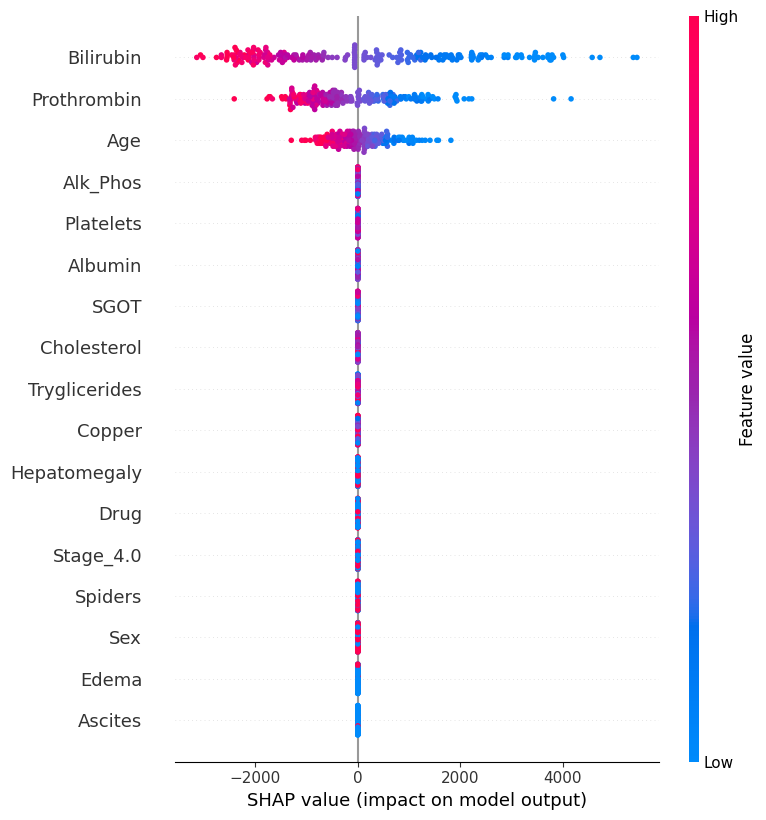

In [158]:
##################################
# Plotting the SHAP summary plot
##################################
shap.summary_plot(shap_values_weibull, 
                  cirrhosis_survival_train_modeling.iloc[:, 2:])

### 1.6.3 Log-Normal Accelerated Failure Time Model <a class="anchor" id="1.6.3"></a>

[Survival Analysis](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) deals with the analysis of time-to-event data. It focuses on the expected duration of time until one or more events of interest occur, such as death, failure, or relapse. This type of analysis is used to study and model the time until the occurrence of an event, taking into account that the event might not have occurred for all subjects during the study period. Several key aspects of survival analysis include the survival function which refers to the probability that an individual survives longer than a certain time, hazard function which describes the instantaneous rate at which events occur, given no prior event, and censoring pertaining to a condition where the event of interest has not occurred for some subjects during the observation period.

[Right-Censored Survival Data](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) occurs when the event of interest has not happened for some subjects by the end of the study period or the last follow-up time. This type of censoring is common in survival analysis because not all individuals may experience the event before the study ends, or they might drop out or be lost to follow-up. Right-censored data is crucial in survival analysis as it allows the inclusion of all subjects in the analysis, providing more accurate and reliable estimates.

[Accelerated Failure Time Models](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) are a class of survival analysis models used to analyze time-to-event data by directly modelling the survival time itself. An AFT model assumes that the effect of covariates accelerates or decelerates the life time of an event by some constant factor. The mathematical equation is represented by the logarithm of the survival time being equal to the sum of the vector of covariates multiplied to the vector of regression coefficients; and the product of the scale parameter and a random variable with a specified distribution. In an AFT model, the coefficients represent the multiplicative effect on the survival time. An exponentiated regression coefficient greater than one prolongs survival time, while a value less than one shortens it. The scale parameter determines the spread or variability of survival times. AFT models assume that the effect of covariates on survival time is multiplicative and that the survival times can be transformed to follow a specific distribution.

[Log-Normal Accelerated Failure Time Model](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) assumes that the logarithm of survival time errors follows a normal distribution. The mathematical equation is represented by the logarithm of the survival time being equal to the sum of the vector of covariates multiplied to the vector of regression coefficients; and the product of the scale parameter and a standard normal error term. This model can be a good fit for data with a log-normal distribution, with well-established statistical properties and straightforward interpretation on the log scale. However, the model can have limited flexibility in hazard rate shapes compared to the Weibull model and can be less intuitive to interpret on the original time scale.

[Concordance Index](https://lifelines.readthedocs.io/en/latest/lifelines.utils.html) measures the model's ability to correctly order pairs of observations based on their predicted survival times. Values range from 0.5 to 1.0 indicating no predictive power (random guessing) and perfect predictions, respectively. As a metric, it provides a measure of discriminative ability and useful for ranking predictions. However, it does not provide information on the magnitude of errors and may be insensitive to the calibration of predicted survival probabilities.

[Mean Absolute Error](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_absolute_error.html) measures the average magnitude of the errors between predicted and actual survival times. Lower MAE values indicate better model performance, while reflecting the average prediction error in the same units as the survival time. As a metric, it is intuitive and easy to interpret while providing a direct measure of prediction accuracy. However, it may be sensitive to outliers and does not consider the probabilistic nature of survival predictions.

[Brier Score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.brier_score_loss.html) measures the accuracy of probabilistic predictions of survival at a specific time point. Values range from 0 to 1 with a lower brier scores indicating better accuracy. A Brier score of 0 indicates perfect predictions, while a score of 1 indicates the worst possible predictions. As a metric, it considers both discrimination and calibration, while reflecting the accuracy of predicted survival probabilities. However, it requires specifying a time point and aggregating scores over time points may be less interpretable.

1. The [log-normal accelerated failure time model](https://lifelines.readthedocs.io/en/latest/fitters/regression/LogNormalAFTFitter.html) from the <mark style="background-color: #CCECFF"><b>lifelines.LogNormalAFTFitter</b></mark> Python library API was implemented. 
2. The model implementation used 1 hyperparameter:
    * <span style="color: #FF0000">penalizer</span> = penalty to the size of the coefficients during regression fixed at a value = 0.30
3. Only 5 of the 17 predictors, which were determined by the model as statistically significant, were used for prediction:
    * <span style="color: #FF0000">Edema</span>: Presence associated with a decrease in time to event 
    * <span style="color: #FF0000">Bilirubin</span>: Increase in value associated with a decrease in time to event 
    * <span style="color: #FF0000">Age</span>: Increase in value associated with a decrease in time to event 
    * <span style="color: #FF0000">Prothrombin</span>: Increase in value associated with a decrease in time to event 
    * <span style="color: #FF0000">Copper</span>: Increase in value associated with a decrease in time to event 
4. The cross-validated model performance of the model is summarized as follows:
    * **Concordance Index** = 0.8255
    * **Mean Absolute Error** = 2502.6369
    * **Brier Score** = 0.5425
5. The apparent model performance of the model is summarized as follows:
    * **Concordance Index** = 0.8413
    * **Mean Absolute Error** = 2518.3594
    * **Brier Score** = 0.5470
6. The independent test model performance of the model is summarized as follows:
    * **Concordance Index** = 0.8753
    * **Mean Absolute Error** = 1904.9879
    * **Brier Score** = 0.5775
7. Comparable apparent and cross-validated model performance was observed, indicative of the presence of minimal model overfitting.
8. The MAE for event observations were typically lower because the errors were directly tied to the observed event times, which are known and can be more accurately predicted. For censored observations, the prediction error reflects the model's inability to pinpoint the exact event time, leading to higher MAE due to the larger variability and the longer tail of potential event times beyond the censoring point.
9. Survival probability curves estimated for all cases. Shorter median survival times were observed for:
    * Event cases as compared to censored cases
    * Presence of <span style="color: #FF0000">Edema</span> as compared to absence
    * Higher values for <span style="color: #FF0000">Bilirubin</span> as compared to lower values
    * Higher values for <span style="color: #FF0000">Age</span> as compared to lower values
    * Higher values for <span style="color: #FF0000">Prothrombin</span> as compared to lower values
    * Higher values for <span style="color: #FF0000">Copper</span> as compared to lower values
10. SHAP values were computed for the significant predictors, with contributions to the model output ranked as follows:
    * Higher values for <span style="color: #FF0000">Bilirubin</span> result to the event expected to occur sooner
    * Higher values for <span style="color: #FF0000">Prothrombin</span> result to the event expected to occur sooner
    * Higher values for <span style="color: #FF0000">Copper</span> result to the event expected to occur sooner
    * Higher values for <span style="color: #FF0000">Age</span> result to the event expected to occur sooner
    * Presence of <span style="color: #FF0000">Edema</span> results to the event expected to occur sooner

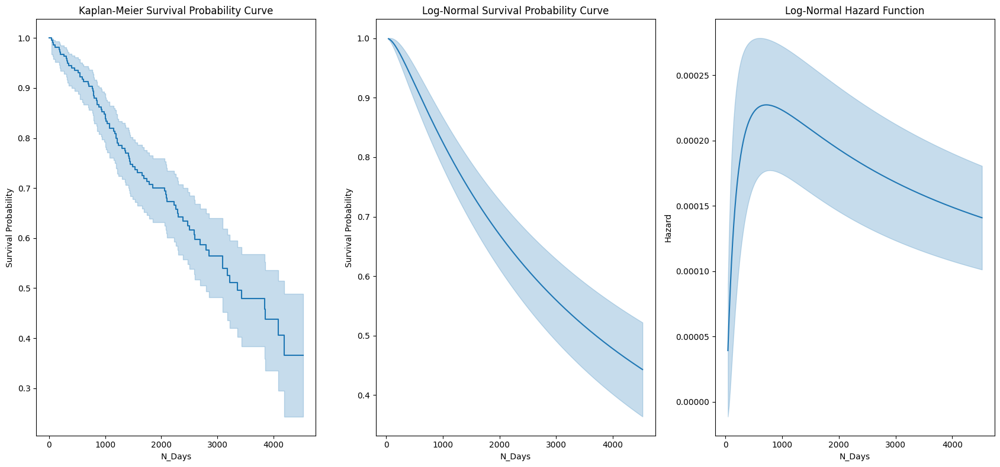

In [159]:
##################################
# Assessing the survival probability 
# and hazard function plots
# with a Log-Normal distribution
##################################
cirrhosis_survival_lognormal = LogNormalFitter()
cirrhosis_survival_lognormal.fit(durations=cirrhosis_survival_train_modeling['N_Days'], 
                                 event_observed=cirrhosis_survival_train_modeling['Status'])

##################################
# Fitting a Kaplan-Meier estimation
##################################
cirrhosis_survival_km = KaplanMeierFitter()
cirrhosis_survival_km.fit(durations=cirrhosis_survival_train_modeling['N_Days'],
                          event_observed=cirrhosis_survival_train_modeling['Status'])

##################################
# Generating the survival probability 
# and hazard function plots
##################################
plt.figure(figsize=(17, 8))

##################################
# Generating the Kaplan-Meier
# survival probability plot
##################################
plt.subplot(1, 3, 1)
cirrhosis_survival_km.plot_survival_function()
plt.title("Kaplan-Meier Survival Probability Curve")
plt.xlabel("N_Days")
plt.ylabel("Survival Probability")
plt.legend('',frameon=False)

##################################
# Generating the Weibull
# survival probability plot
##################################
plt.subplot(1, 3, 2)
cirrhosis_survival_lognormal.plot_survival_function()
plt.title("Log-Normal Survival Probability Curve")
plt.xlabel("N_Days")
plt.ylabel("Survival Probability")
plt.legend('',frameon=False)

##################################
# Generating the Weibull
# hazard function plot
##################################
plt.subplot(1, 3, 3)
cirrhosis_survival_lognormal.plot_hazard()
plt.title("Log-Normal Hazard Function")
plt.xlabel("N_Days")
plt.ylabel("Hazard")
plt.legend('',frameon=False)

##################################
# Consolidating all plots
##################################
plt.tight_layout()
plt.show()

In [160]:
##################################
# Formulating the Accelerated Failure Time model
# based on a Log-Normal distribution
# and generating the summary
##################################
cirrhosis_survival_aft_lognormal = LogNormalAFTFitter(penalizer=0.30)
cirrhosis_survival_aft_lognormal.fit(cirrhosis_survival_train_modeling, duration_col='N_Days', event_col='Status')
cirrhosis_survival_aft_lognormal.print_summary()

<lifelines.LogNormalAFTFitter: fitted with 218 total observations, 131 right-censored observations>
             duration col = 'N_Days'
                event col = 'Status'
                penalizer = 0.3
   number of observations = 218
number of events observed = 87
           log-likelihood = -769.81
         time fit was run = 2024-10-14 07:42:04 UTC

---
                      coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
param  covariate                                                                                                      
mu_    Age           -0.18      0.83      0.07           -0.32           -0.05                0.73                0.95
       Albumin        0.08      1.09      0.07           -0.06            0.22                0.95                1.25
       Alk_Phos      -0.03      0.97      0.07           -0.17            0.11                0.85                1.12
       Ascites       -0.33      0.72      0.25           -0.81            0.16                0.44                1.17
       Bilirubin     -0.26      0.77      0.08           -0.42           -0.09                0.66                0.91
       Cholesterol    0.01      1.01      0.07           -0.13            0.16                0.88                1.17
       Copper        -0.16      0.85      0.07           -0.30           -0.01                0.74                0.99
       Drug           0.09      1.10      0.13           -0.16            0.35                0.85                1.42
       Edema         -0.37      0.69      0.18           -0.73           -0.01                0.48                0.99
       Hepatomegaly  -0.06      0.94      0.14           -0.34            0.22                0.71                1.24
       Platelets      0.08      1.08      0.07           -0.06            0.21                0.94                1.24
       Prothrombin   -0.18      0.83      0.07           -0.33           -0.04                0.72                0.96
       SGOT          -0.09      0.91      0.07           -0.23            0.05                0.79                1.05
       Sex            0.04      1.04      0.19           -0.32            0.40                0.72                1.49
       Spiders       -0.18      0.84      0.15           -0.47            0.12                0.62                1.12
       Stage_4.0     -0.26      0.77      0.15           -0.57            0.04                0.57                1.04
       Tryglicerides -0.09      0.92      0.07           -0.23            0.05                0.80                1.05
       Intercept      8.26   3879.36      0.21            7.86            8.67             2580.42             5832.16
sigma_ Intercept     -0.14      0.87      0.07           -0.28           -0.01                0.76                0.99

                      cmp to     z      p  -log2(p)
param  covariate                                   
mu_    Age              0.00 -2.62   0.01      6.85
       Albumin          0.00  1.16   0.24      2.03
       Alk_Phos         0.00 -0.40   0.69      0.54
       Ascites          0.00 -1.32   0.19      2.43
       Bilirubin        0.00 -3.06 <0.005      8.83
       Cholesterol      0.00  0.18   0.86      0.22
       Copper           0.00 -2.12   0.03      4.89
       Drug             0.00  0.70   0.48      1.05
       Edema            0.00 -2.04   0.04      4.60
       Hepatomegaly     0.00 -0.43   0.67      0.58
       Platelets        0.00  1.11   0.27      1.92
       Prothrombin      0.00 -2.53   0.01      6.47
       SGOT             0.00 -1.24   0.22      2.21
       Sex              0.00  0.21   0.83      0.26
       Spiders          0.00 -1.19   0.24      2.08
       Stage_4.0        0.00 -1.70   0.09      3.50
       Tryglicerides    0.00 -1.24   0.22      2.21
       Intercept        0.00 39.72 <0.005       inf
sigma_ Intercept        0.00 -2.15   0.03      5.00
---
Concordance = 0.85
AIC = 1577.63
log-likel

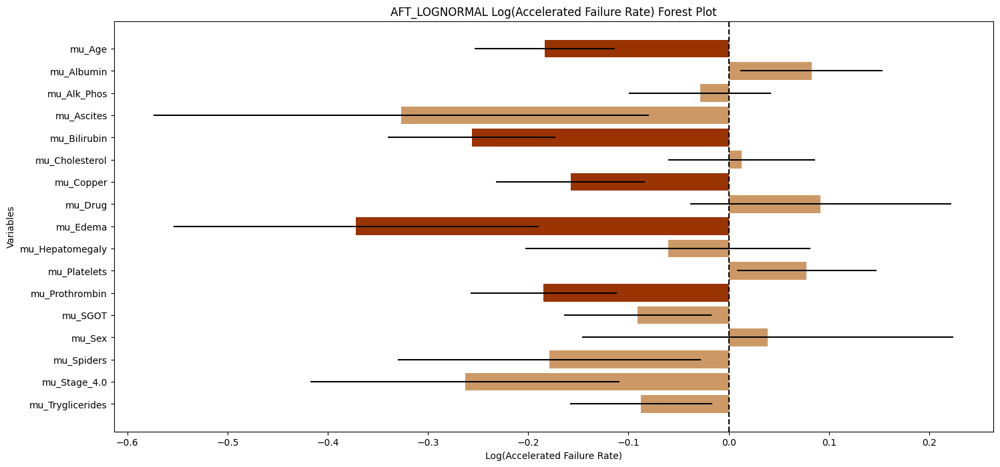

In [161]:
##################################
# Plotting the log accelerated failure rate of the
# formulated Accelerated Failure Time model
# based on a Log-Normal distribution
##################################
cirrhosis_survival_aft_lognormal_summary = cirrhosis_survival_aft_lognormal.summary
cirrhosis_survival_aft_lognormal_summary_params = pd.DataFrame(cirrhosis_survival_aft_lognormal.params_)
significant = cirrhosis_survival_aft_lognormal_summary['p'] < 0.05
cirrhosis_survival_aft_lognormal_summary_log_accelerated_failure_rate = (list(cirrhosis_survival_aft_lognormal_summary_params.iloc[:,0].values))
plt.figure(figsize=(17, 8))
colors = ['#993300' if sig else '#CC9966' for sig in significant]

plt.barh([(index[0] + index[1]) for index in cirrhosis_survival_aft_lognormal_summary_params.index[0:17]], 
         cirrhosis_survival_aft_lognormal_summary_log_accelerated_failure_rate[0:17], 
         xerr=cirrhosis_survival_aft_lognormal_summary['se(coef)'][0:17], 
         color=colors)
plt.xlabel('Log(Accelerated Failure Rate)')
plt.ylabel('Variables')
plt.title('AFT_LOGNORMAL Log(Accelerated Failure Rate) Forest Plot')
plt.axvline(x=0, color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.show()

In [162]:
##################################
# Determining the number of
# significant predictors
##################################
cirrhosis_survival_aft_lognormal_significant = sum(cirrhosis_survival_aft_lognormal_summary['p'] < 0.05)
display(f"Number of Significant Predictors: {cirrhosis_survival_aft_lognormal_significant-2}")

'Number of Significant Predictors: 5'

In [163]:
##################################
# Formulating the Accelerated Failure Time model
# based on a Log-Normal distribution
# using the significant predictors only
# and generating the summary
##################################
feature_subset = ['Bilirubin','Prothrombin','Age','Copper','Edema','N_Days','Status']
cirrhosis_survival_aft_lognormal = LogNormalAFTFitter(penalizer=0.30)
cirrhosis_survival_aft_lognormal.fit(cirrhosis_survival_train_modeling[feature_subset], duration_col='N_Days', event_col='Status')
cirrhosis_survival_aft_lognormal.print_summary()

<lifelines.LogNormalAFTFitter: fitted with 218 total observations, 131 right-censored observations>
             duration col = 'N_Days'
                event col = 'Status'
                penalizer = 0.3
   number of observations = 218
number of events observed = 87
           log-likelihood = -779.28
         time fit was run = 2024-10-14 07:42:05 UTC

---
                    coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
param  covariate                                                                                                    
mu_    Age         -0.19      0.83      0.07           -0.32           -0.06                0.73                0.94
       Bilirubin   -0.37      0.69      0.07           -0.52           -0.23                0.60                0.79
       Copper      -0.22      0.80      0.07           -0.36           -0.08                0.70                0.93
       Edema       -0.56      0.57      0.17           -0.90           -0.21                0.41                0.81
       Prothrombin -0.26      0.77      0.07           -0.40           -0.12                0.67                0.88
       Intercept    8.18   3566.84      0.09            8.00            8.36             2978.10             4271.97
sigma_ Intercept   -0.11      0.90      0.07           -0.24            0.02                0.79                1.02

                    cmp to     z      p  -log2(p)
param  covariate                                 
mu_    Age            0.00 -2.90 <0.005      8.05
       Bilirubin      0.00 -5.10 <0.005     21.51
       Copper         0.00 -3.02 <0.005      8.61
       Edema          0.00 -3.19 <0.005      9.47
       Prothrombin    0.00 -3.73 <0.005     12.35
       Intercept      0.00 88.87 <0.005       inf
sigma_ Intercept      0.00 -1.66   0.10      3.38
---
Concordance = 0.84
AIC = 1572.55
log-likelihood ratio test = 103.65 on 5 df
-log2(p) of ll-ratio test = 66.59

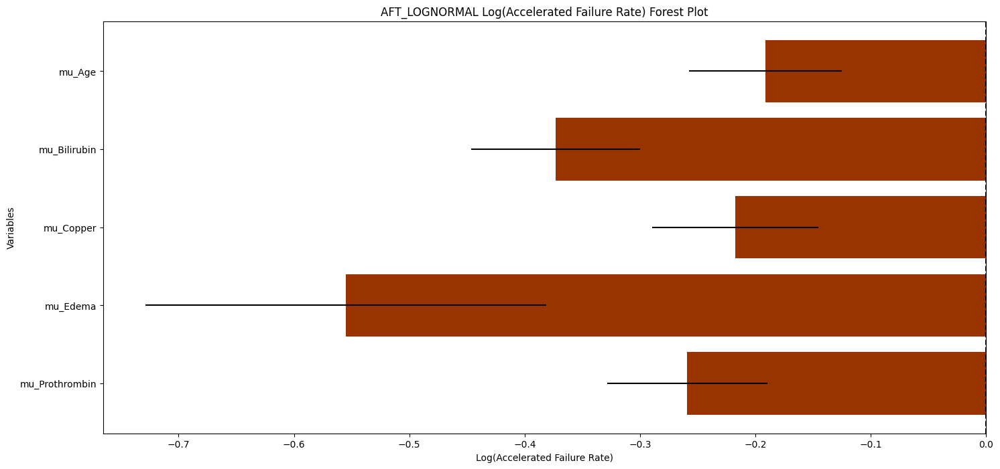

In [164]:
##################################
# Plotting the log accelerated failure rate of the
# formulated Accelerated Failure Time model
# using the significant predictors only
# based on a Log-Normal distribution
##################################
cirrhosis_survival_aft_lognormal_summary = cirrhosis_survival_aft_lognormal.summary
cirrhosis_survival_aft_lognormal_summary_params = pd.DataFrame(cirrhosis_survival_aft_lognormal.params_)
significant = cirrhosis_survival_aft_lognormal_summary['p'] < 0.05
cirrhosis_survival_aft_lognormal_summary_log_accelerated_failure_rate = (list(cirrhosis_survival_aft_lognormal_summary_params.iloc[:,0].values))
plt.figure(figsize=(17, 8))
colors = ['#993300' if sig else '#CC9966' for sig in significant]

plt.barh([(index[0] + index[1]) for index in cirrhosis_survival_aft_lognormal_summary_params.index[0:5]], 
         cirrhosis_survival_aft_lognormal_summary_log_accelerated_failure_rate[0:5], 
         xerr=cirrhosis_survival_aft_lognormal_summary['se(coef)'][0:5], 
         color=colors)
plt.xlabel('Log(Accelerated Failure Rate)')
plt.ylabel('Variables')
plt.title('AFT_LOGNORMAL Log(Accelerated Failure Rate) Forest Plot')
plt.axvline(x=0, color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.show()

In [165]:
##################################
# Gathering the apparent model performance
# as baseline for evaluating overfitting
##################################
cirrhosis_survival_aft_lognormal.fit(cirrhosis_survival_train_modeling[feature_subset], duration_col='N_Days', event_col='Status')
train_predictions = cirrhosis_survival_aft_lognormal.predict_median(cirrhosis_survival_train_modeling)
cirrhosis_survival_aft_lognormal_train_ci = concordance_index(cirrhosis_survival_train_modeling['N_Days'], 
                                                            train_predictions, 
                                                            cirrhosis_survival_train_modeling['Status'])
time_point = cirrhosis_survival_train_modeling['N_Days'].median()
cirrhosis_survival_aft_lognormal_train_mae = mean_absolute_error(cirrhosis_survival_train_modeling['N_Days'], train_predictions)
cirrhosis_survival_aft_lognormal_train_brier = brier_score_loss(cirrhosis_survival_train_modeling['Status'], 
                                                              cirrhosis_survival_aft_lognormal.predict_survival_function(cirrhosis_survival_train_modeling, 
                                                                                                                       times=[time_point]).T[time_point])
display(f"Apparent Concordance Index: {cirrhosis_survival_aft_lognormal_train_ci}")
display(f"Apparent MAE: {cirrhosis_survival_aft_lognormal_train_mae}")
display(f"Apparent Brier Score: {cirrhosis_survival_aft_lognormal_train_brier}")

'Apparent Concordance Index: 0.8413524057217165'

'Apparent MAE: 2518.3593852441572'

'Apparent Brier Score: 0.5470406779352227'

In [166]:
##################################
# Performing 5-Fold Cross-Validation
# on the training data
##################################
kf = KFold(n_splits=5, shuffle=True, random_state=88888888)
ci_scores = []
mae_scores = []
brier_scores = []

for train_index, val_index in kf.split(cirrhosis_survival_train_modeling):
    df_train_fold = cirrhosis_survival_train_modeling.iloc[train_index]
    df_val_fold = cirrhosis_survival_train_modeling.iloc[val_index]
    
    cirrhosis_survival_aft_lognormal.fit(df_train_fold[feature_subset], duration_col='N_Days', event_col='Status')
    val_predictions = cirrhosis_survival_aft_lognormal.predict_median(df_val_fold)
    time_point = df_val_fold['N_Days'].median()
    ci = concordance_index(df_val_fold['N_Days'], val_predictions, df_val_fold['Status'])
    mae = mean_absolute_error(df_val_fold['N_Days'], val_predictions)
    brier = brier_score_loss(df_val_fold['Status'],
                             cirrhosis_survival_aft_lognormal.predict_survival_function(df_val_fold, 
                                                                                      times=[time_point]).T[time_point])
    ci_scores.append(ci)
    mae_scores.append(mae)
    brier_scores.append(brier)

cirrhosis_survival_aft_lognormal_cv_ci_mean = np.mean(ci_scores)
cirrhosis_survival_aft_lognormal_cv_ci_std = np.std(ci_scores)
cirrhosis_survival_aft_lognormal_cv_mae_mean = np.mean(mae_scores)
cirrhosis_survival_aft_lognormal_cv_brier_mean = np.mean(brier_scores)

display(f"Cross-Validated Concordance Index: {cirrhosis_survival_aft_lognormal_cv_ci_mean}")
display(f"Cross-Validated MAE: {cirrhosis_survival_aft_lognormal_cv_mae_mean}")
display(f"Cross-Validated Brier Score: {cirrhosis_survival_aft_lognormal_cv_brier_mean}")

'Cross-Validated Concordance Index: 0.8255764006037584'

'Cross-Validated MAE: 2502.6369548831367'

'Cross-Validated Brier Score: 0.5425832599120203'

In [167]:
##################################
# Evaluating the model performance
# on test data
##################################
test_predictions = cirrhosis_survival_aft_lognormal.predict_median(cirrhosis_survival_test_modeling)
cirrhosis_survival_aft_lognormal_test_ci = concordance_index(cirrhosis_survival_test_modeling['N_Days'], 
                                                           test_predictions, 
                                                           cirrhosis_survival_test_modeling['Status'])
time_point = cirrhosis_survival_test_modeling['N_Days'].median()
cirrhosis_survival_aft_lognormal_test_mae = mean_absolute_error(cirrhosis_survival_test_modeling['N_Days'], test_predictions)
cirrhosis_survival_aft_lognormal_test_brier = brier_score_loss(cirrhosis_survival_test_modeling['Status'], 
                                                              cirrhosis_survival_aft_lognormal.predict_survival_function(cirrhosis_survival_test_modeling, 
                                                                                                                       times=[time_point]).T[time_point])
display(f"Apparent Concordance Index: {cirrhosis_survival_aft_lognormal_test_ci}")
display(f"Apparent MAE: {cirrhosis_survival_aft_lognormal_test_mae}")
display(f"Apparent Brier Score: {cirrhosis_survival_aft_lognormal_test_brier}")

'Apparent Concordance Index: 0.8752834467120182'

'Apparent MAE: 1904.9879866903511'

'Apparent Brier Score: 0.5775019785104171'

In [168]:
##################################
# Gathering the model performance metrics
# from training, cross-validation and test
##################################
aft_lognormal_set = pd.DataFrame(["Train","Cross-Validation","Test"]*3)
aft_lognormal_metric = pd.DataFrame((["Concordance.Index"]*3) + (["MAE"]*3) + (["Brier.Score"]*3))
aft_lognormal_metric_values = pd.DataFrame([cirrhosis_survival_aft_lognormal_train_ci,
                                           cirrhosis_survival_aft_lognormal_cv_ci_mean,
                                           cirrhosis_survival_aft_lognormal_test_ci,
                                           cirrhosis_survival_aft_lognormal_train_mae,
                                           cirrhosis_survival_aft_lognormal_cv_mae_mean,
                                           cirrhosis_survival_aft_lognormal_test_mae,
                                           cirrhosis_survival_aft_lognormal_train_brier,
                                           cirrhosis_survival_aft_lognormal_cv_brier_mean,
                                           cirrhosis_survival_aft_lognormal_test_brier])
aft_lognormal_method = pd.DataFrame(["AFT_LOGNORMAL"]*9)
aft_lognormal_summary = pd.concat([aft_lognormal_set,
                                       aft_lognormal_metric,
                                       aft_lognormal_metric_values,
                                       aft_lognormal_method], 
                                      axis=1)
aft_lognormal_summary.columns = ['Set', 'Metric', 'Value', 'Method']
aft_lognormal_summary.reset_index(inplace=True, drop=True)
display(aft_lognormal_summary)


,Set,Metric,Value,Method
0,Train,Concordance.Index,0.841352,AFT_LOGNORMAL
1,Cross-Validation,Concordance.Index,0.825576,AFT_LOGNORMAL
2,Test,Concordance.Index,0.875283,AFT_LOGNORMAL
3,Train,MAE,2518.359385,AFT_LOGNORMAL
4,Cross-Validation,MAE,2502.636955,AFT_LOGNORMAL
5,Test,MAE,1904.987987,AFT_LOGNORMAL
6,Train,Brier.Score,0.547041,AFT_LOGNORMAL
7,Cross-Validation,Brier.Score,0.542583,AFT_LOGNORMAL
8,Test,Brier.Score,0.577502,AFT_LOGNORMAL


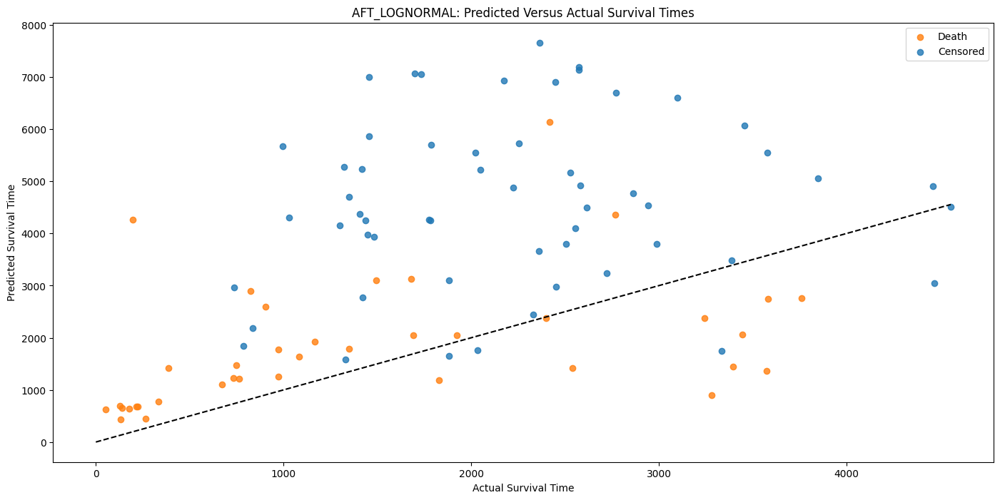

In [169]:
##################################
# Evaluating the predicted
# and actual survival times
##################################
predicted_survival_times = cirrhosis_survival_aft_lognormal.predict_median(cirrhosis_survival_test_modeling)
fig, ax = plt.subplots(figsize=(17, 8))
for status, color, label in zip([True, False], ['#FF7F0E','#1F77B4'], ['Death', 'Censored']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Status'] == status]
    ax.scatter(subset['N_Days'], predicted_survival_times.iloc[subset.index], c=color, label=label, alpha=0.8)
ax.set_xlabel('Actual Survival Time')
ax.set_ylabel('Predicted Survival Time')
ax.set_title('AFT_LOGNORMAL: Predicted Versus Actual Survival Times')
ax.legend()
plt.plot([0, cirrhosis_survival_test_modeling['N_Days'].max()], 
         [0, cirrhosis_survival_test_modeling['N_Days'].max()], 
         color='black', linestyle='--')
plt.show()

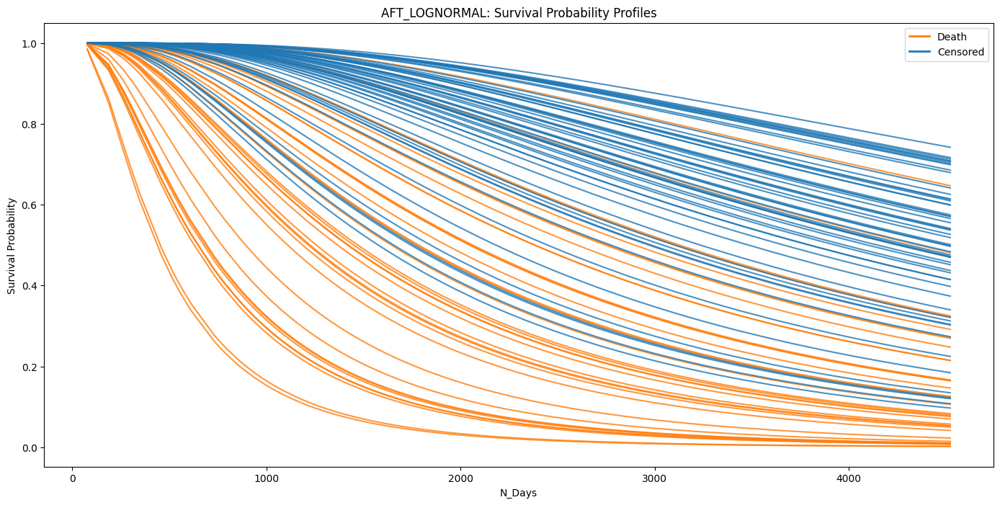

In [170]:
##################################
# Plotting the individual
# survival probability profiles
##################################
plt.figure(figsize=(17, 8))
for status, color, label in zip([True, False], ['#FF7F0E','#1F77B4'], ['Death', 'Censored']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Status'] == status]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_lognormal.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_LOGNORMAL: Survival Probability Profiles')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
death_patch = plt.Line2D([0], [0], color='#FF7F0E', lw=2, label='Death')
censored_patch = plt.Line2D([0], [0], color='#1F77B4', lw=2, label='Censored')
plt.legend(handles=[death_patch, censored_patch])
plt.show()

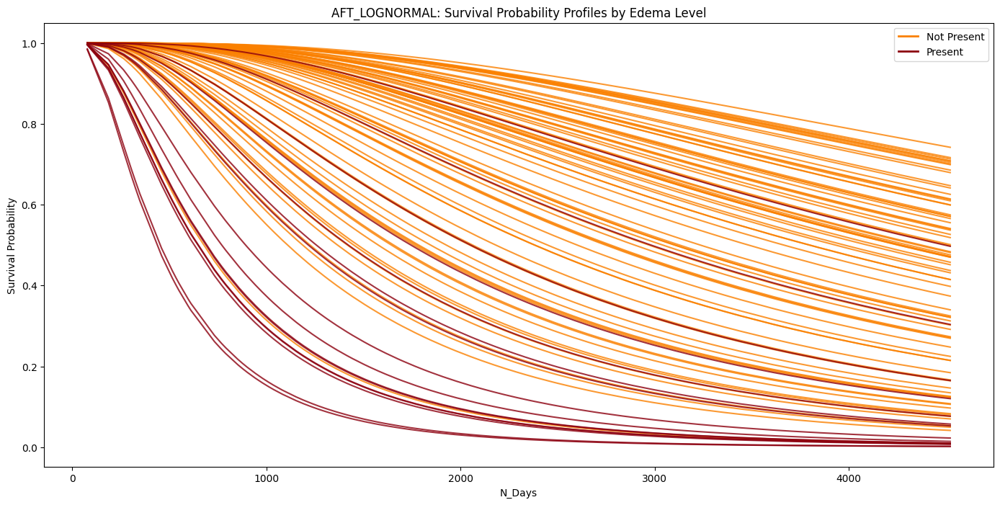

In [171]:
##################################
# Plotting the individual
# survival probability profiles
# for the discretized Edema predictor
##################################
plt.figure(figsize=(17, 8))
for edema_level, color, label in zip([0, 1], ['#FA8000', '#8C000F'], ['Not Present', 'Present']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Edema'] == edema_level]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_lognormal.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_LOGNORMAL: Survival Probability Profiles by Edema Level')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
not_present_patch = plt.Line2D([0], [0], color='#FA8000', lw=2, label='Not Present')
present_patch = plt.Line2D([0], [0], color='#8C000F', lw=2, label='Present')
plt.legend(handles=[not_present_patch, present_patch])
plt.show()

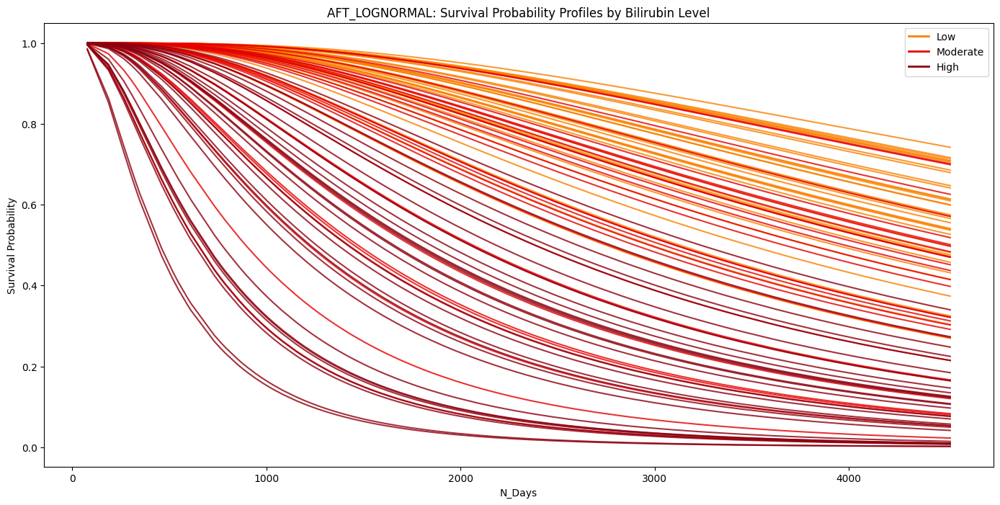

In [172]:
##################################
# Plotting the individual
# survival probability profiles
# for the discretized Bilirubin predictor
##################################
cirrhosis_survival_test_modeling['Bilirubin_Level'] = pd.qcut(cirrhosis_survival_test_modeling['Bilirubin'], 3, labels=['Low','Moderate','High'])
plt.figure(figsize=(17, 8))
for bilirubin_level, color, label in zip(['Low', 'Moderate', 'High'], ['#FA8000','#E50000', '#8C000F'], ['Low', 'Moderate', 'High']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Bilirubin_Level'] == bilirubin_level]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_lognormal.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_LOGNORMAL: Survival Probability Profiles by Bilirubin Level')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
low_patch = plt.Line2D([0], [0], color='#FA8000', lw=2, label='Low')
moderate_patch = plt.Line2D([0], [0], color='#E50000', lw=2, label='Moderate')
high_patch = plt.Line2D([0], [0], color='#8C000F', lw=2, label='High')
plt.legend(handles=[low_patch, moderate_patch, high_patch])
plt.show()

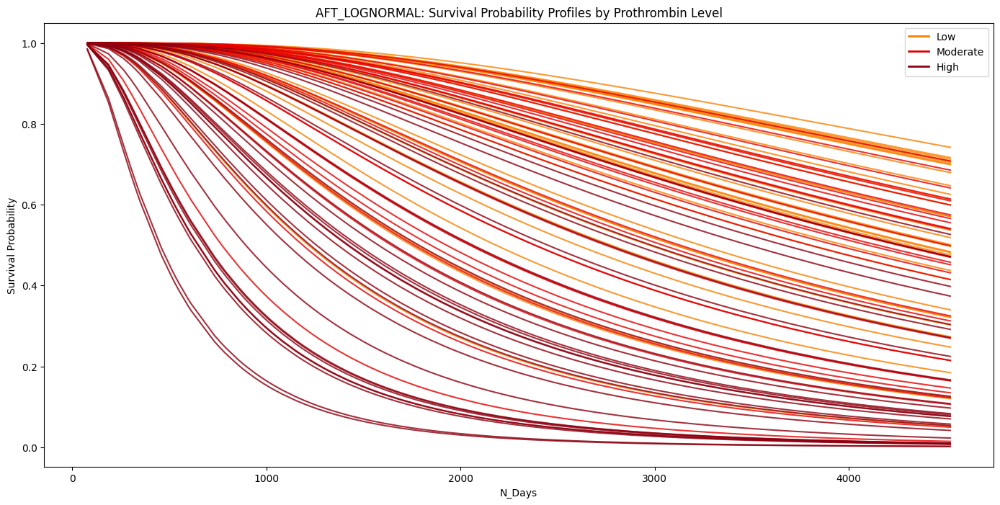

In [173]:
##################################
# Plotting the individual
# survival probability profiles
# for the discretized Prothrombin predictor
##################################
cirrhosis_survival_test_modeling['Prothrombin_Level'] = pd.qcut(cirrhosis_survival_test_modeling['Prothrombin'], 3, labels=['Low','Moderate','High'])
plt.figure(figsize=(17, 8))
for prothrombin_level, color, label in zip(['Low', 'Moderate', 'High'], ['#FA8000','#E50000', '#8C000F'], ['Low', 'Moderate', 'High']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Prothrombin_Level'] == prothrombin_level]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_lognormal.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_LOGNORMAL: Survival Probability Profiles by Prothrombin Level')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
low_patch = plt.Line2D([0], [0], color='#FA8000', lw=2, label='Low')
moderate_patch = plt.Line2D([0], [0], color='#E50000', lw=2, label='Moderate')
high_patch = plt.Line2D([0], [0], color='#8C000F', lw=2, label='High')
plt.legend(handles=[low_patch, moderate_patch, high_patch])
plt.show()

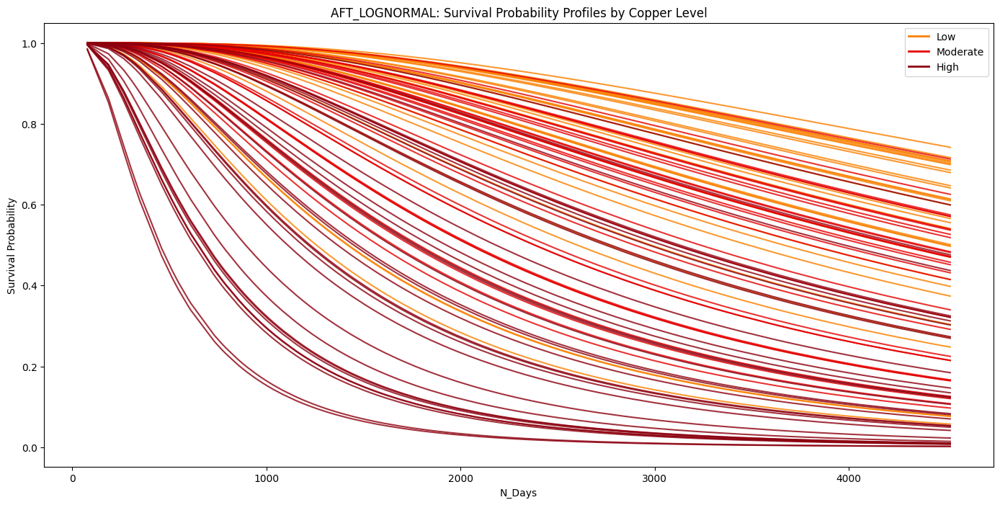

In [174]:
##################################
# Plotting the individual
# survival probability profiles
# for the discretized Copper predictor
##################################
cirrhosis_survival_test_modeling['Copper_Level'] = pd.qcut(cirrhosis_survival_test_modeling['Copper'], 3, labels=['Low','Moderate','High'])
plt.figure(figsize=(17, 8))
for copper_level, color, label in zip(['Low', 'Moderate', 'High'], ['#FA8000','#E50000', '#8C000F'], ['Low', 'Moderate', 'High']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Copper_Level'] == copper_level]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_lognormal.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_LOGNORMAL: Survival Probability Profiles by Copper Level')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
low_patch = plt.Line2D([0], [0], color='#FA8000', lw=2, label='Low')
moderate_patch = plt.Line2D([0], [0], color='#E50000', lw=2, label='Moderate')
high_patch = plt.Line2D([0], [0], color='#8C000F', lw=2, label='High')
plt.legend(handles=[low_patch, moderate_patch, high_patch])
plt.show()

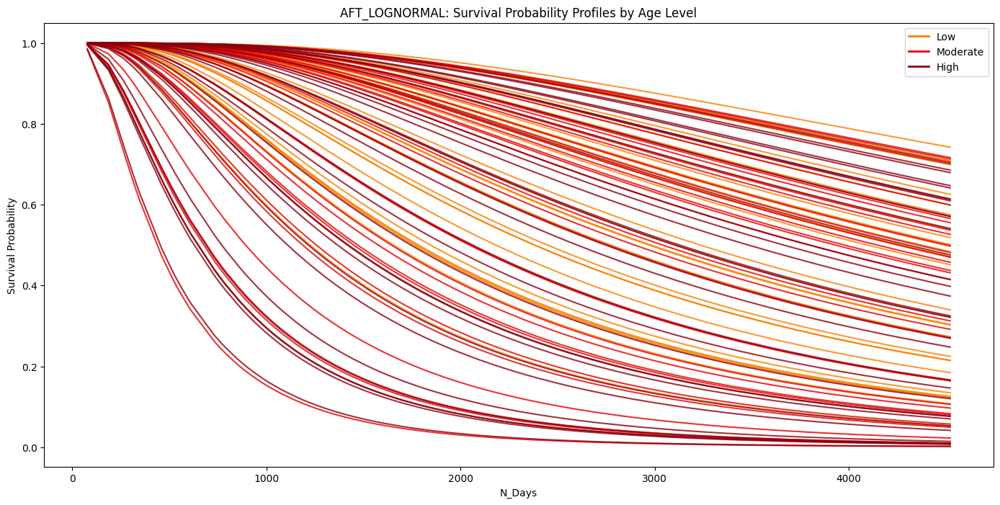

In [175]:
##################################
# Plotting the individual
# survival probability profiles
# for the discretized Age predictor
##################################
cirrhosis_survival_test_modeling['Age_Level'] = pd.qcut(cirrhosis_survival_test_modeling['Age'], 3, labels=['Low','Moderate','High'])
plt.figure(figsize=(17, 8))
for age_level, color, label in zip(['Low', 'Moderate', 'High'], ['#FA8000','#E50000', '#8C000F'], ['Low', 'Moderate', 'High']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Age_Level'] == age_level]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_lognormal.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_LOGNORMAL: Survival Probability Profiles by Age Level')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
low_patch = plt.Line2D([0], [0], color='#FA8000', lw=2, label='Low')
moderate_patch = plt.Line2D([0], [0], color='#E50000', lw=2, label='Moderate')
high_patch = plt.Line2D([0], [0], color='#8C000F', lw=2, label='High')
plt.legend(handles=[low_patch, moderate_patch, high_patch])
plt.show()

In [176]:
##################################
# Defining a prediction function
# for SHAP value estimation
##################################
def aft_predict(fitter, df):
    return fitter.predict_expectation(df)

##################################
# Creating the explainer object
##################################
explainer_lognormal = shap.Explainer(lambda x: aft_predict(cirrhosis_survival_aft_lognormal, 
                                                         pd.DataFrame(x, columns=cirrhosis_survival_train_modeling.columns[2:])), 
                                   cirrhosis_survival_train_modeling.iloc[:, 2:])
shap_values_lognormal = explainer_lognormal(cirrhosis_survival_train_modeling.iloc[:, 2:])


PermutationExplainer explainer: 219it [00:21,  5.49it/s]                              


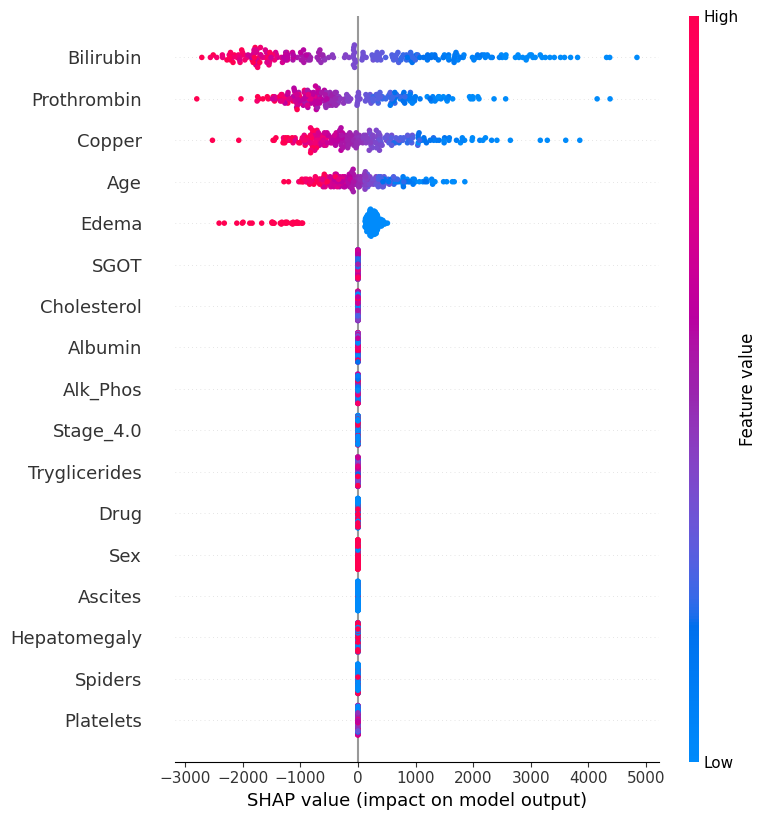

In [177]:
##################################
# Plotting the SHAP summary plot
##################################
shap.summary_plot(shap_values_lognormal, 
                  cirrhosis_survival_train_modeling.iloc[:, 2:])

### 1.6.4 Log-Logistic Accelerated Failure Time Model <a class="anchor" id="1.6.4"></a>

[Survival Analysis](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) deals with the analysis of time-to-event data. It focuses on the expected duration of time until one or more events of interest occur, such as death, failure, or relapse. This type of analysis is used to study and model the time until the occurrence of an event, taking into account that the event might not have occurred for all subjects during the study period. Several key aspects of survival analysis include the survival function which refers to the probability that an individual survives longer than a certain time, hazard function which describes the instantaneous rate at which events occur, given no prior event, and censoring pertaining to a condition where the event of interest has not occurred for some subjects during the observation period.

[Right-Censored Survival Data](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) occurs when the event of interest has not happened for some subjects by the end of the study period or the last follow-up time. This type of censoring is common in survival analysis because not all individuals may experience the event before the study ends, or they might drop out or be lost to follow-up. Right-censored data is crucial in survival analysis as it allows the inclusion of all subjects in the analysis, providing more accurate and reliable estimates.

[Accelerated Failure Time Models](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) are a class of survival analysis models used to analyze time-to-event data by directly modelling the survival time itself. An AFT model assumes that the effect of covariates accelerates or decelerates the life time of an event by some constant factor. The mathematical equation is represented by the logarithm of the survival time being equal to the sum of the vector of covariates multiplied to the vector of regression coefficients; and the product of the scale parameter and a random variable with a specified distribution. In an AFT model, the coefficients represent the multiplicative effect on the survival time. An exponentiated regression coefficient greater than one prolongs survival time, while a value less than one shortens it. The scale parameter determines the spread or variability of survival times. AFT models assume that the effect of covariates on survival time is multiplicative and that the survival times can be transformed to follow a specific distribution.

[Log-Logistic Accelerated Failure Time Model](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) assumes that the survival time errors follow a log-logistic distribution. The mathematical equation is represented by the logarithm of the survival time being equal to the sum of the vector of covariates multiplied to the vector of regression coefficients; and the product of the scale parameter and a standard logistic error term. This model can estimate various hazard shapes, including non-monotonic hazard functions and may be more flexible than the Log Normal model. However, interpretation of results can be complex due to the nature of the logistic distribution and the model structure may be less robust to outliers compared to other models.

[Concordance Index](https://lifelines.readthedocs.io/en/latest/lifelines.utils.html) measures the model's ability to correctly order pairs of observations based on their predicted survival times. Values range from 0.5 to 1.0 indicating no predictive power (random guessing) and perfect predictions, respectively. As a metric, it provides a measure of discriminative ability and useful for ranking predictions. However, it does not provide information on the magnitude of errors and may be insensitive to the calibration of predicted survival probabilities.

[Mean Absolute Error](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_absolute_error.html) measures the average magnitude of the errors between predicted and actual survival times. Lower MAE values indicate better model performance, while reflecting the average prediction error in the same units as the survival time. As a metric, it is intuitive and easy to interpret while providing a direct measure of prediction accuracy. However, it may be sensitive to outliers and does not consider the probabilistic nature of survival predictions.

[Brier Score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.brier_score_loss.html) measures the accuracy of probabilistic predictions of survival at a specific time point. Values range from 0 to 1 with a lower brier scores indicating better accuracy. A Brier score of 0 indicates perfect predictions, while a score of 1 indicates the worst possible predictions. As a metric, it considers both discrimination and calibration, while reflecting the accuracy of predicted survival probabilities. However, it requires specifying a time point and aggregating scores over time points may be less interpretable.

1. The [log-logistic accelerated failure time model](https://lifelines.readthedocs.io/en/latest/fitters/regression/LogLogisticAFTFitter.html) from the <mark style="background-color: #CCECFF"><b>lifelines.LogLogisticAFTFitter</b></mark> Python library API was implemented. 
2. The model implementation used 1 hyperparameter:
    * <span style="color: #FF0000">penalizer</span> = penalty to the size of the coefficients during regression fixed at a value = 0.30
3. Only 5 of the 17 predictors, which were determined by the model as statistically significant, were used for prediction:
    * <span style="color: #FF0000">Bilirubin</span>: Increase in value associated with a decrease in time to event 
    * <span style="color: #FF0000">Prothrombin</span>: Increase in value associated with a decrease in time to event 
    * <span style="color: #FF0000">Age</span>: Increase in value associated with a decrease in time to event 
    * <span style="color: #FF0000">Copper</span>: Increase in value associated with a decrease in time to event 
4. The cross-validated model performance of the model is summarized as follows:
    * **Concordance Index** = 0.8301
    * **Mean Absolute Error** = 2711.6604
    * **Brier Score** = 0.5065
5. The apparent model performance of the model is summarized as follows:
    * **Concordance Index** = 0.8383
    * **Mean Absolute Error** = 2727.4651
    * **Brier Score** = 0.5095
6. The independent test model performance of the model is summarized as follows:
    * **Concordance Index** = 0.8625
    * **Mean Absolute Error** = 2189.9323
    * **Brier Score** = 0.5332
7. Comparable apparent and cross-validated model performance was observed, indicative of the presence of minimal model overfitting.
8. The MAE for event observations were typically lower because the errors were directly tied to the observed event times, which are known and can be more accurately predicted. For censored observations, the prediction error reflects the model's inability to pinpoint the exact event time, leading to higher MAE due to the larger variability and the longer tail of potential event times beyond the censoring point.
9. Survival probability curves estimated for all cases. Shorter median survival times were observed for:
    * Event cases as compared to censored cases
    * Higher values for <span style="color: #FF0000">Bilirubin</span> as compared to lower values
    * Higher values for <span style="color: #FF0000">Prothrombin</span> as compared to lower values
    * Higher values for <span style="color: #FF0000">Age</span> as compared to lower values
    * Higher values for <span style="color: #FF0000">Copper</span> as compared to lower values
10. SHAP values were computed for the significant predictors, with contributions to the model output ranked as follows:
    * Higher values for <span style="color: #FF0000">Bilirubin</span> result to the event expected to occur sooner
    * Higher values for <span style="color: #FF0000">Prothrombin</span> result to the event expected to occur sooner
    * Higher values for <span style="color: #FF0000">Copper</span> result to the event expected to occur sooner
    * Higher values for <span style="color: #FF0000">Age</span> result to the event expected to occur sooner

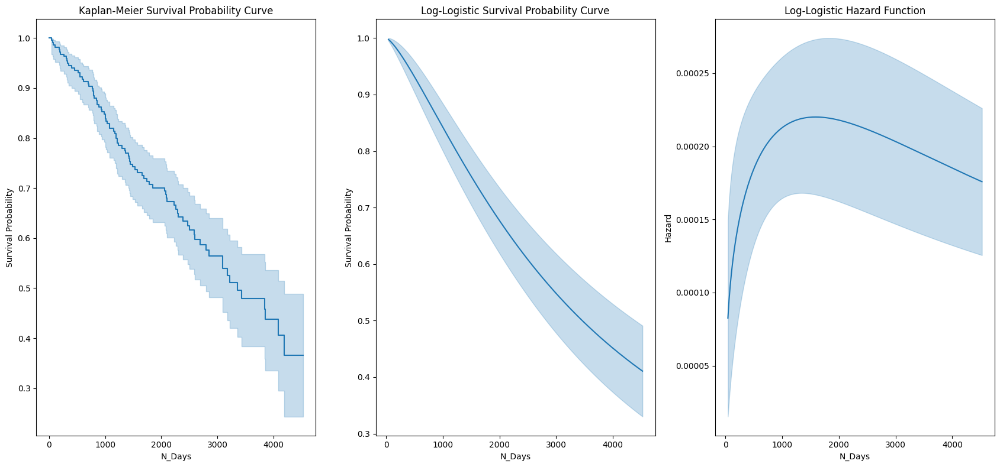

In [178]:
##################################
# Assessing the survival probability 
# and hazard function plots
# with a Log-Logistic distribution
##################################
cirrhosis_survival_loglogistic = LogLogisticFitter()
cirrhosis_survival_loglogistic.fit(durations=cirrhosis_survival_train_modeling['N_Days'], 
                                   event_observed=cirrhosis_survival_train_modeling['Status'])

##################################
# Fitting a Kaplan-Meier estimation
##################################
cirrhosis_survival_km = KaplanMeierFitter()
cirrhosis_survival_km.fit(durations=cirrhosis_survival_train_modeling['N_Days'],
                          event_observed=cirrhosis_survival_train_modeling['Status'])

##################################
# Generating the survival probability 
# and hazard function plots
##################################
plt.figure(figsize=(17, 8))

##################################
# Generating the Kaplan-Meier
# survival probability plot
##################################
plt.subplot(1, 3, 1)
cirrhosis_survival_km.plot_survival_function()
plt.title("Kaplan-Meier Survival Probability Curve")
plt.xlabel("N_Days")
plt.ylabel("Survival Probability")
plt.legend('',frameon=False)

##################################
# Generating the Log-Logistic
# survival probability plot
##################################
plt.subplot(1, 3, 2)
cirrhosis_survival_loglogistic.plot_survival_function()
plt.title("Log-Logistic Survival Probability Curve")
plt.xlabel("N_Days")
plt.ylabel("Survival Probability")
plt.legend('',frameon=False)

##################################
# Generating the log-Logistic
# hazard function plot
##################################
plt.subplot(1, 3, 3)
cirrhosis_survival_loglogistic.plot_hazard()
plt.title("Log-Logistic Hazard Function")
plt.xlabel("N_Days")
plt.ylabel("Hazard")
plt.legend('',frameon=False)

##################################
# Consolidating all plots
##################################
plt.tight_layout()
plt.show()

In [179]:
##################################
# Formulating the Accelerated Failure Time model
# based on a Log-Logistic distribution
# and generating the summary
##################################
cirrhosis_survival_aft_loglogistic = LogLogisticAFTFitter(penalizer=0.30)
cirrhosis_survival_aft_loglogistic.fit(cirrhosis_survival_train_modeling, duration_col='N_Days', event_col='Status')
cirrhosis_survival_aft_loglogistic.print_summary()

<lifelines.LogLogisticAFTFitter: fitted with 218 total observations, 131 right-censored observations>
             duration col = 'N_Days'
                event col = 'Status'
                penalizer = 0.3
   number of observations = 218
number of events observed = 87
           log-likelihood = -781.35
         time fit was run = 2024-10-14 07:42:37 UTC

---
                      coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
param  covariate                                                                                                      
alpha_ Age           -0.18      0.83      0.08           -0.33           -0.04                0.72                0.97
       Albumin        0.10      1.10      0.08           -0.05            0.25                0.95                1.29
       Alk_Phos      -0.05      0.95      0.08           -0.20            0.11                0.82                1.11
       Ascites       -0.29      0.75      0.28           -0.83            0.25                0.43                1.28
       Bilirubin     -0.27      0.77      0.09           -0.44           -0.09                0.64                0.91
       Cholesterol    0.00      1.00      0.08           -0.15            0.16                0.86                1.17
       Copper        -0.16      0.85      0.08           -0.32           -0.01                0.73                0.99
       Drug           0.09      1.10      0.14           -0.19            0.38                0.83                1.46
       Edema         -0.33      0.72      0.20           -0.73            0.06                0.48                1.07
       Hepatomegaly  -0.10      0.90      0.15           -0.40            0.20                0.67                1.22
       Platelets      0.08      1.09      0.08           -0.07            0.23                0.94                1.26
       Prothrombin   -0.20      0.82      0.08           -0.35           -0.04                0.70                0.96
       SGOT          -0.09      0.91      0.08           -0.25            0.06                0.78                1.06
       Sex            0.11      1.12      0.20           -0.29            0.51                0.75                1.66
       Spiders       -0.15      0.86      0.17           -0.47            0.18                0.62                1.20
       Stage_4.0     -0.25      0.78      0.17           -0.57            0.08                0.57                1.08
       Tryglicerides -0.09      0.92      0.08           -0.24            0.07                0.79                1.07
       Intercept      8.28   3927.15      0.23            7.82            8.73             2501.84             6164.47
beta_  Intercept      0.51      1.67      0.08            0.36            0.67                1.43                1.95

                      cmp to     z      p  -log2(p)
param  covariate                                   
alpha_ Age              0.00 -2.42   0.02      6.02
       Albumin          0.00  1.27   0.20      2.30
       Alk_Phos         0.00 -0.60   0.55      0.87
       Ascites          0.00 -1.06   0.29      1.79
       Bilirubin        0.00 -3.00 <0.005      8.55
       Cholesterol      0.00  0.04   0.97      0.05
       Copper           0.00 -2.05   0.04      4.64
       Drug             0.00  0.66   0.51      0.98
       Edema            0.00 -1.65   0.10      3.32
       Hepatomegaly     0.00 -0.66   0.51      0.97
       Platelets        0.00  1.09   0.27      1.87
       Prothrombin      0.00 -2.52   0.01      6.41
       SGOT             0.00 -1.19   0.23      2.09
       Sex              0.00  0.55   0.59      0.77
       Spiders          0.00 -0.87   0.39      1.37
       Stage_4.0        0.00 -1.49   0.14      2.87
       Tryglicerides    0.00 -1.11   0.27      1.90
       Intercept        0.00 35.97 <0.005    938.99
beta_  Intercept        0.00  6.46 <0.005     33.18
---
Concordance = 0.86
AIC = 1600.71
log-lik

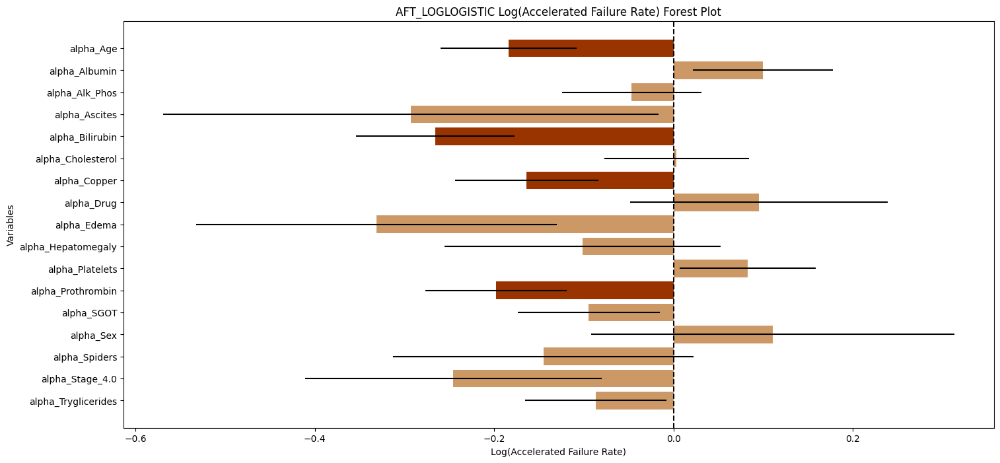

In [180]:
##################################
# Plotting the log accelerated failure rate of the
# formulated Accelerated Failure Time model
# based on a Log-Logistic distribution
##################################
cirrhosis_survival_aft_loglogistic_summary = cirrhosis_survival_aft_loglogistic.summary
cirrhosis_survival_aft_loglogistic_summary_params = pd.DataFrame(cirrhosis_survival_aft_loglogistic.params_)
significant = cirrhosis_survival_aft_loglogistic_summary['p'] < 0.05
cirrhosis_survival_aft_loglogistic_summary_log_accelerated_failure_rate = (list(cirrhosis_survival_aft_loglogistic_summary_params.iloc[:,0].values))
plt.figure(figsize=(17, 8))
colors = ['#993300' if sig else '#CC9966' for sig in significant]

plt.barh([(index[0] + index[1]) for index in cirrhosis_survival_aft_loglogistic_summary_params.index[0:17]], 
         cirrhosis_survival_aft_loglogistic_summary_log_accelerated_failure_rate[0:17], 
         xerr=cirrhosis_survival_aft_loglogistic_summary['se(coef)'][0:17], 
         color=colors)
plt.xlabel('Log(Accelerated Failure Rate)')
plt.ylabel('Variables')
plt.title('AFT_LOGLOGISTIC Log(Accelerated Failure Rate) Forest Plot')
plt.axvline(x=0, color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.show()

In [181]:
##################################
# Determining the number of
# significant predictors
##################################
cirrhosis_survival_aft_loglogistic_significant = sum(cirrhosis_survival_aft_loglogistic_summary['p'] < 0.05)
display(f"Number of Significant Predictors: {cirrhosis_survival_aft_loglogistic_significant-2}")

'Number of Significant Predictors: 4'

In [182]:
##################################
# Formulating the Accelerated Failure Time model
# based on a Log-Logistic distribution
# using the significant predictors only
# and generating the summary
##################################
feature_subset = ['Bilirubin','Prothrombin','Age','Copper','N_Days','Status']
cirrhosis_survival_aft_loglogistic = LogLogisticAFTFitter(penalizer=0.30)
cirrhosis_survival_aft_loglogistic.fit(cirrhosis_survival_train_modeling[feature_subset], duration_col='N_Days', event_col='Status')
cirrhosis_survival_aft_loglogistic.print_summary()

<lifelines.LogLogisticAFTFitter: fitted with 218 total observations, 131 right-censored observations>
             duration col = 'N_Days'
                event col = 'Status'
                penalizer = 0.3
   number of observations = 218
number of events observed = 87
           log-likelihood = -792.48
         time fit was run = 2024-10-14 07:42:37 UTC

---
                    coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
param  covariate                                                                                                    
alpha_ Age         -0.20      0.82      0.07           -0.35           -0.06                0.71                0.94
       Bilirubin   -0.40      0.67      0.08           -0.56           -0.25                0.57                0.78
       Copper      -0.22      0.80      0.08           -0.38           -0.07                0.69                0.93
       Prothrombin -0.29      0.75      0.08           -0.44           -0.14                0.65                0.87
       Intercept    8.17   3530.45      0.10            7.98            8.36             2909.02             4284.63
beta_  Intercept    0.48      1.61      0.08            0.32            0.63                1.38                1.87

                    cmp to     z      p  -log2(p)
param  covariate                                 
alpha_ Age            0.00 -2.80   0.01      7.60
       Bilirubin      0.00 -5.13 <0.005     21.73
       Copper         0.00 -2.84 <0.005      7.80
       Prothrombin    0.00 -3.84 <0.005     13.00
       Intercept      0.00 82.70 <0.005       inf
beta_  Intercept      0.00  6.08 <0.005     29.59
---
Concordance = 0.84
AIC = 1596.96
log-likelihood ratio test = 73.33 on 4 df
-log2(p) of ll-ratio test = 47.66

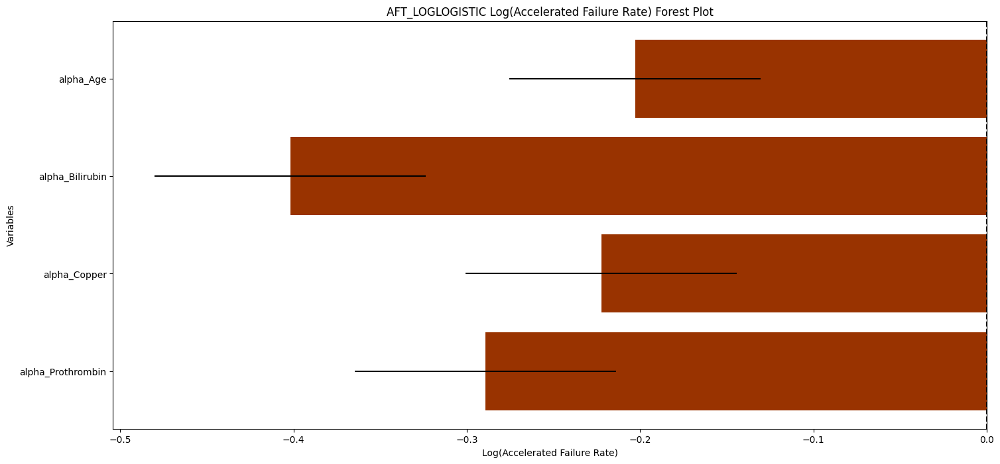

In [183]:
##################################
# Plotting the log accelerated failure rate of the
# formulated Accelerated Failure Time model
# using the significant predictors only
# based on a Log-Logistic distribution
##################################
cirrhosis_survival_aft_loglogistic_summary = cirrhosis_survival_aft_loglogistic.summary
cirrhosis_survival_aft_loglogistic_summary_params = pd.DataFrame(cirrhosis_survival_aft_loglogistic.params_)
significant = cirrhosis_survival_aft_loglogistic_summary['p'] < 0.05
cirrhosis_survival_aft_loglogistic_summary_log_accelerated_failure_rate = (list(cirrhosis_survival_aft_loglogistic_summary_params.iloc[:,0].values))
plt.figure(figsize=(17, 8))
colors = ['#993300' if sig else '#CC9966' for sig in significant]

plt.barh([(index[0] + index[1]) for index in cirrhosis_survival_aft_loglogistic_summary_params.index[0:4]], 
         cirrhosis_survival_aft_loglogistic_summary_log_accelerated_failure_rate[0:4], 
         xerr=cirrhosis_survival_aft_loglogistic_summary['se(coef)'][0:4], 
         color=colors)
plt.xlabel('Log(Accelerated Failure Rate)')
plt.ylabel('Variables')
plt.title('AFT_LOGLOGISTIC Log(Accelerated Failure Rate) Forest Plot')
plt.axvline(x=0, color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.show()

In [184]:
##################################
# Gathering the apparent model performance
# as baseline for evaluating overfitting
##################################
cirrhosis_survival_aft_loglogistic.fit(cirrhosis_survival_train_modeling[feature_subset], duration_col='N_Days', event_col='Status')
train_predictions = cirrhosis_survival_aft_loglogistic.predict_median(cirrhosis_survival_train_modeling)
cirrhosis_survival_aft_loglogistic_train_ci = concordance_index(cirrhosis_survival_train_modeling['N_Days'], 
                                                            train_predictions, 
                                                            cirrhosis_survival_train_modeling['Status'])
time_point = cirrhosis_survival_train_modeling['N_Days'].median()
cirrhosis_survival_aft_loglogistic_train_mae = mean_absolute_error(cirrhosis_survival_train_modeling['N_Days'], train_predictions)
cirrhosis_survival_aft_loglogistic_train_brier = brier_score_loss(cirrhosis_survival_train_modeling['Status'], 
                                                              cirrhosis_survival_aft_loglogistic.predict_survival_function(cirrhosis_survival_train_modeling, 
                                                                                                                       times=[time_point]).T[time_point])
display(f"Apparent Concordance Index: {cirrhosis_survival_aft_loglogistic_train_ci}")
display(f"Apparent MAE: {cirrhosis_survival_aft_loglogistic_train_mae}")
display(f"Apparent Brier Score: {cirrhosis_survival_aft_loglogistic_train_brier}")

'Apparent Concordance Index: 0.8383452535760728'

'Apparent MAE: 2727.4650862183294'

'Apparent Brier Score: 0.5095276225408752'

In [185]:
##################################
# Performing 5-Fold Cross-Validation
# on the training data
##################################
kf = KFold(n_splits=5, shuffle=True, random_state=88888888)
ci_scores = []
mae_scores = []
brier_scores = []

for train_index, val_index in kf.split(cirrhosis_survival_train_modeling):
    df_train_fold = cirrhosis_survival_train_modeling.iloc[train_index]
    df_val_fold = cirrhosis_survival_train_modeling.iloc[val_index]
    
    cirrhosis_survival_aft_loglogistic.fit(df_train_fold[feature_subset], duration_col='N_Days', event_col='Status')
    val_predictions = cirrhosis_survival_aft_loglogistic.predict_median(df_val_fold)
    time_point = df_val_fold['N_Days'].median()
    ci = concordance_index(df_val_fold['N_Days'], val_predictions, df_val_fold['Status'])
    mae = mean_absolute_error(df_val_fold['N_Days'], val_predictions)
    brier = brier_score_loss(df_val_fold['Status'],
                             cirrhosis_survival_aft_loglogistic.predict_survival_function(df_val_fold, 
                                                                                      times=[time_point]).T[time_point])
    ci_scores.append(ci)
    mae_scores.append(mae)
    brier_scores.append(brier)

cirrhosis_survival_aft_loglogistic_cv_ci_mean = np.mean(ci_scores)
cirrhosis_survival_aft_loglogistic_cv_ci_std = np.std(ci_scores)
cirrhosis_survival_aft_loglogistic_cv_mae_mean = np.mean(mae_scores)
cirrhosis_survival_aft_loglogistic_cv_brier_mean = np.mean(brier_scores)

display(f"Cross-Validated Concordance Index: {cirrhosis_survival_aft_loglogistic_cv_ci_mean}")
display(f"Cross-Validated MAE: {cirrhosis_survival_aft_loglogistic_cv_mae_mean}")
display(f"Cross-Validated Brier Score: {cirrhosis_survival_aft_loglogistic_cv_brier_mean}")

'Cross-Validated Concordance Index: 0.8301281045334907'

'Cross-Validated MAE: 2711.6604860313473'

'Cross-Validated Brier Score: 0.5065381245204559'

In [186]:
##################################
# Evaluating the model performance
# on test data
##################################
test_predictions = cirrhosis_survival_aft_loglogistic.predict_median(cirrhosis_survival_test_modeling)
cirrhosis_survival_aft_loglogistic_test_ci = concordance_index(cirrhosis_survival_test_modeling['N_Days'], 
                                                           test_predictions, 
                                                           cirrhosis_survival_test_modeling['Status'])
time_point = cirrhosis_survival_test_modeling['N_Days'].median()
cirrhosis_survival_aft_loglogistic_test_mae = mean_absolute_error(cirrhosis_survival_test_modeling['N_Days'], test_predictions)
cirrhosis_survival_aft_loglogistic_test_brier = brier_score_loss(cirrhosis_survival_test_modeling['Status'], 
                                                              cirrhosis_survival_aft_loglogistic.predict_survival_function(cirrhosis_survival_test_modeling, 
                                                                                                                       times=[time_point]).T[time_point])
display(f"Apparent Concordance Index: {cirrhosis_survival_aft_loglogistic_test_ci}")
display(f"Apparent MAE: {cirrhosis_survival_aft_loglogistic_test_mae}")
display(f"Apparent Brier Score: {cirrhosis_survival_aft_loglogistic_test_brier}")

'Apparent Concordance Index: 0.8625850340136054'

'Apparent MAE: 2189.9323142397443'

'Apparent Brier Score: 0.5332955064077313'

In [187]:
##################################
# Gathering the model performance metrics
# from training, cross-validation and test
##################################
aft_loglogistic_set = pd.DataFrame(["Train","Cross-Validation","Test"]*3)
aft_loglogistic_metric = pd.DataFrame((["Concordance.Index"]*3) + (["MAE"]*3) + (["Brier.Score"]*3))
aft_loglogistic_metric_values = pd.DataFrame([cirrhosis_survival_aft_loglogistic_train_ci,
                                           cirrhosis_survival_aft_loglogistic_cv_ci_mean,
                                           cirrhosis_survival_aft_loglogistic_test_ci,
                                           cirrhosis_survival_aft_loglogistic_train_mae,
                                           cirrhosis_survival_aft_loglogistic_cv_mae_mean,
                                           cirrhosis_survival_aft_loglogistic_test_mae,
                                           cirrhosis_survival_aft_loglogistic_train_brier,
                                           cirrhosis_survival_aft_loglogistic_cv_brier_mean,
                                           cirrhosis_survival_aft_loglogistic_test_brier])
aft_loglogistic_method = pd.DataFrame(["AFT_LOGLOGISTIC"]*9)
aft_loglogistic_summary = pd.concat([aft_loglogistic_set,
                                       aft_loglogistic_metric,
                                       aft_loglogistic_metric_values,
                                       aft_loglogistic_method], 
                                      axis=1)
aft_loglogistic_summary.columns = ['Set', 'Metric', 'Value', 'Method']
aft_loglogistic_summary.reset_index(inplace=True, drop=True)
display(aft_loglogistic_summary)

,Set,Metric,Value,Method
0,Train,Concordance.Index,0.838345,AFT_LOGLOGISTIC
1,Cross-Validation,Concordance.Index,0.830128,AFT_LOGLOGISTIC
2,Test,Concordance.Index,0.862585,AFT_LOGLOGISTIC
3,Train,MAE,2727.465086,AFT_LOGLOGISTIC
4,Cross-Validation,MAE,2711.660486,AFT_LOGLOGISTIC
5,Test,MAE,2189.932314,AFT_LOGLOGISTIC
6,Train,Brier.Score,0.509528,AFT_LOGLOGISTIC
7,Cross-Validation,Brier.Score,0.506538,AFT_LOGLOGISTIC
8,Test,Brier.Score,0.533296,AFT_LOGLOGISTIC


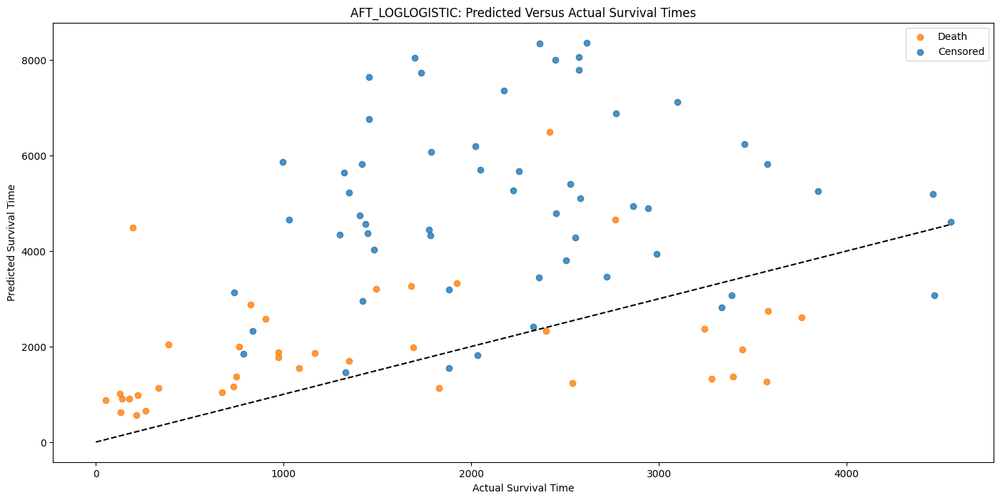

In [188]:
##################################
# Evaluating the predicted
# and actual survival times
##################################
predicted_survival_times = cirrhosis_survival_aft_loglogistic.predict_median(cirrhosis_survival_test_modeling)
fig, ax = plt.subplots(figsize=(17, 8))
for status, color, label in zip([True, False], ['#FF7F0E','#1F77B4'], ['Death', 'Censored']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Status'] == status]
    ax.scatter(subset['N_Days'], predicted_survival_times.iloc[subset.index], c=color, label=label, alpha=0.8)
ax.set_xlabel('Actual Survival Time')
ax.set_ylabel('Predicted Survival Time')
ax.set_title('AFT_LOGLOGISTIC: Predicted Versus Actual Survival Times')
ax.legend()
plt.plot([0, cirrhosis_survival_test_modeling['N_Days'].max()], 
         [0, cirrhosis_survival_test_modeling['N_Days'].max()], 
         color='black', linestyle='--')
plt.show()

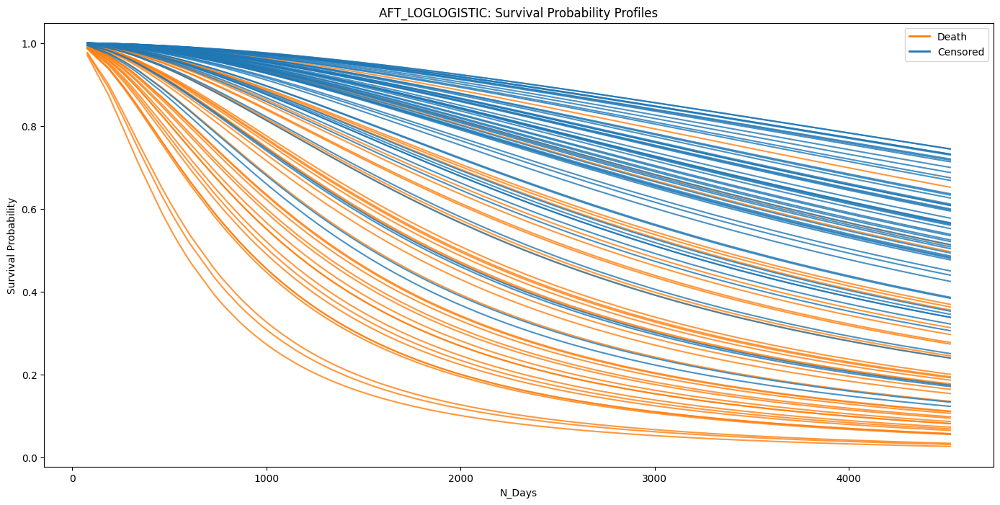

In [189]:
##################################
# Plotting the individual
# survival probability profiles
##################################
plt.figure(figsize=(17, 8))
for status, color, label in zip([True, False], ['#FF7F0E','#1F77B4'], ['Death', 'Censored']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Status'] == status]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_loglogistic.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_LOGLOGISTIC: Survival Probability Profiles')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
death_patch = plt.Line2D([0], [0], color='#FF7F0E', lw=2, label='Death')
censored_patch = plt.Line2D([0], [0], color='#1F77B4', lw=2, label='Censored')
plt.legend(handles=[death_patch, censored_patch])
plt.show()

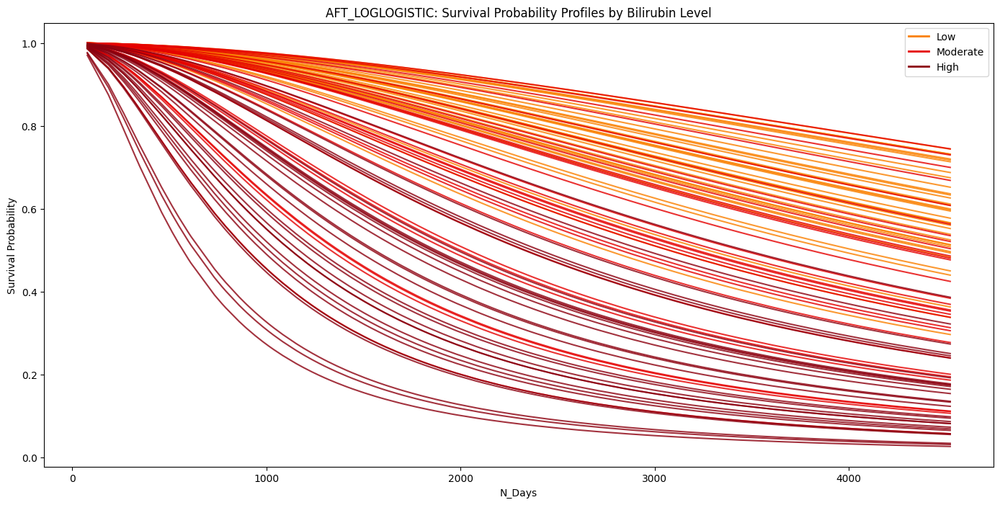

In [190]:
##################################
# Plotting the individual
# survival probability profiles
# for the discretized Bilirubin predictor
##################################
cirrhosis_survival_test_modeling['Bilirubin_Level'] = pd.qcut(cirrhosis_survival_test_modeling['Bilirubin'], 3, labels=['Low','Moderate','High'])
plt.figure(figsize=(17, 8))
for bilirubin_level, color, label in zip(['Low', 'Moderate', 'High'], ['#FA8000','#E50000', '#8C000F'], ['Low', 'Moderate', 'High']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Bilirubin_Level'] == bilirubin_level]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_loglogistic.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_LOGLOGISTIC: Survival Probability Profiles by Bilirubin Level')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
low_patch = plt.Line2D([0], [0], color='#FA8000', lw=2, label='Low')
moderate_patch = plt.Line2D([0], [0], color='#E50000', lw=2, label='Moderate')
high_patch = plt.Line2D([0], [0], color='#8C000F', lw=2, label='High')
plt.legend(handles=[low_patch, moderate_patch, high_patch])
plt.show()

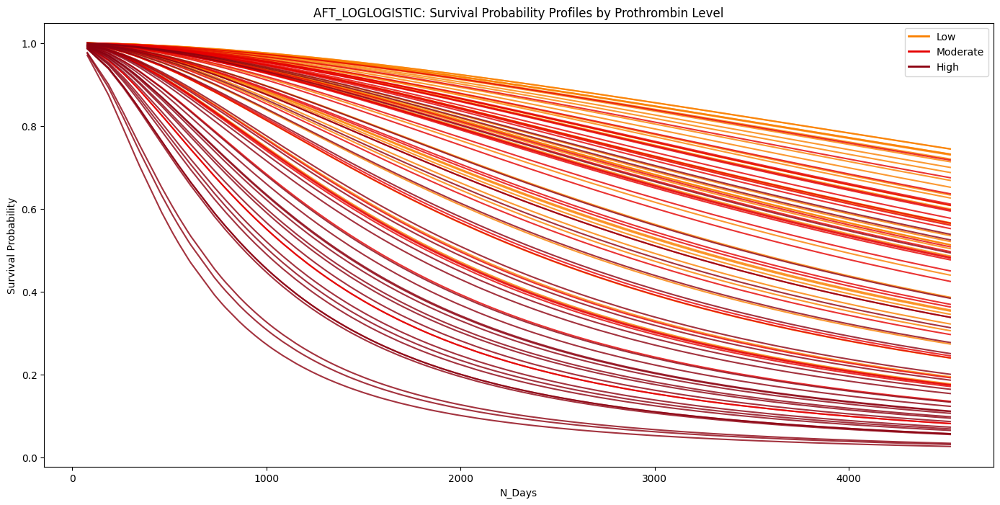

In [191]:
##################################
# Plotting the individual
# survival probability profiles
# for the discretized Prothrombin predictor
##################################
cirrhosis_survival_test_modeling['Prothrombin_Level'] = pd.qcut(cirrhosis_survival_test_modeling['Prothrombin'], 3, labels=['Low','Moderate','High'])
plt.figure(figsize=(17, 8))
for prothrombin_level, color, label in zip(['Low', 'Moderate', 'High'], ['#FA8000','#E50000', '#8C000F'], ['Low', 'Moderate', 'High']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Prothrombin_Level'] == prothrombin_level]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_loglogistic.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_LOGLOGISTIC: Survival Probability Profiles by Prothrombin Level')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
low_patch = plt.Line2D([0], [0], color='#FA8000', lw=2, label='Low')
moderate_patch = plt.Line2D([0], [0], color='#E50000', lw=2, label='Moderate')
high_patch = plt.Line2D([0], [0], color='#8C000F', lw=2, label='High')
plt.legend(handles=[low_patch, moderate_patch, high_patch])
plt.show()

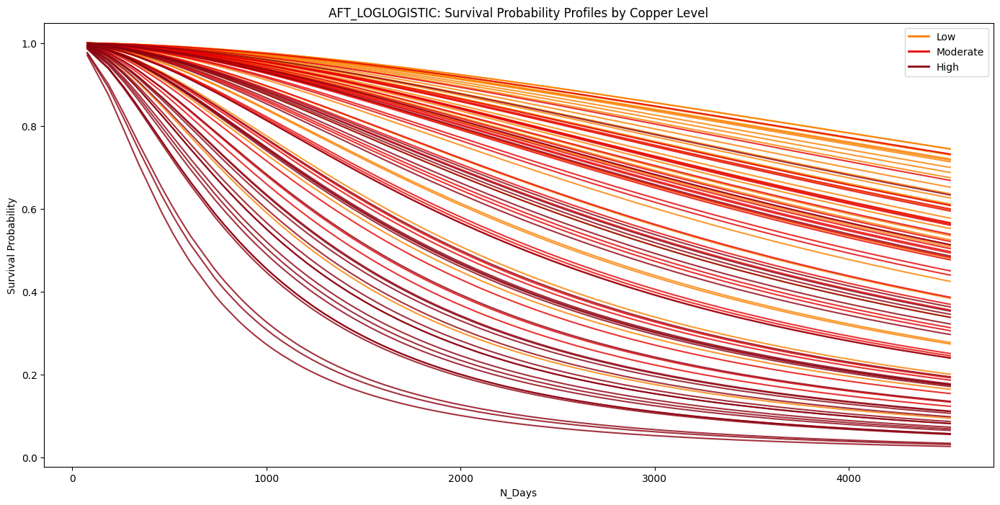

In [192]:
##################################
# Plotting the individual
# survival probability profiles
# for the discretized Copper predictor
##################################
cirrhosis_survival_test_modeling['Copper_Level'] = pd.qcut(cirrhosis_survival_test_modeling['Copper'], 3, labels=['Low','Moderate','High'])
plt.figure(figsize=(17, 8))
for copper_level, color, label in zip(['Low', 'Moderate', 'High'], ['#FA8000','#E50000', '#8C000F'], ['Low', 'Moderate', 'High']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Copper_Level'] == copper_level]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_loglogistic.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_LOGLOGISTIC: Survival Probability Profiles by Copper Level')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
low_patch = plt.Line2D([0], [0], color='#FA8000', lw=2, label='Low')
moderate_patch = plt.Line2D([0], [0], color='#E50000', lw=2, label='Moderate')
high_patch = plt.Line2D([0], [0], color='#8C000F', lw=2, label='High')
plt.legend(handles=[low_patch, moderate_patch, high_patch])
plt.show()

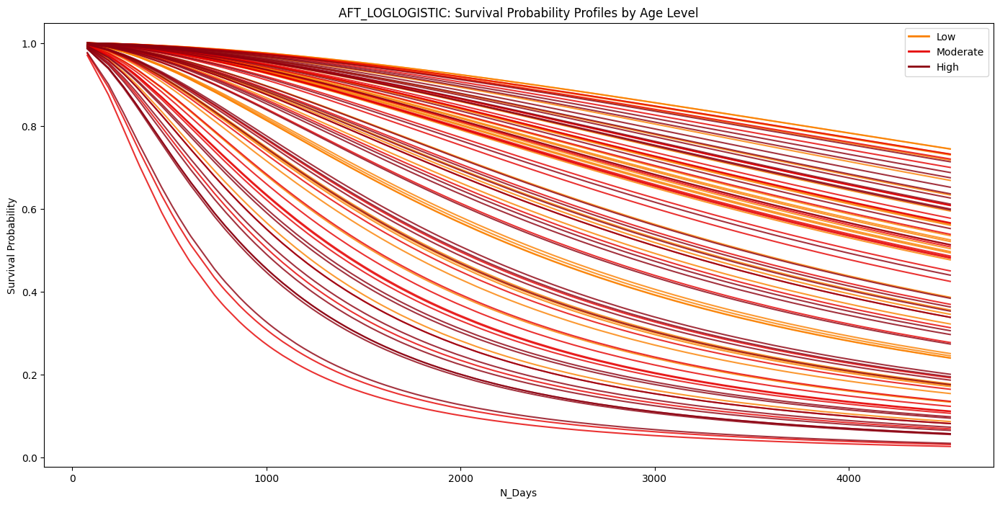

In [193]:
##################################
# Plotting the individual
# survival probability profiles
# for the discretized Age predictor
##################################
cirrhosis_survival_test_modeling['Age_Level'] = pd.qcut(cirrhosis_survival_test_modeling['Age'], 3, labels=['Low','Moderate','High'])
plt.figure(figsize=(17, 8))
for age_level, color, label in zip(['Low', 'Moderate', 'High'], ['#FA8000','#E50000', '#8C000F'], ['Low', 'Moderate', 'High']):
    subset = cirrhosis_survival_test_modeling[cirrhosis_survival_test_modeling['Age_Level'] == age_level]
    for i, row in subset.iterrows():
        survival_function = cirrhosis_survival_aft_loglogistic.predict_survival_function(row)
        plt.plot(survival_function.index, survival_function.iloc[:, 0], c=color, alpha=0.8)
plt.title('AFT_LOGLOGISTIC: Survival Probability Profiles by Age Level')
plt.xlabel('N_Days')
plt.ylabel('Survival Probability')
low_patch = plt.Line2D([0], [0], color='#FA8000', lw=2, label='Low')
moderate_patch = plt.Line2D([0], [0], color='#E50000', lw=2, label='Moderate')
high_patch = plt.Line2D([0], [0], color='#8C000F', lw=2, label='High')
plt.legend(handles=[low_patch, moderate_patch, high_patch])
plt.show()

In [194]:
##################################
# Defining a prediction function
# for SHAP value estimation
##################################
def aft_predict(fitter, df):
    return fitter.predict_expectation(df)

##################################
# Creating the explainer object
##################################
explainer_loglogistic = shap.Explainer(lambda x: aft_predict(cirrhosis_survival_aft_loglogistic, 
                                                         pd.DataFrame(x, columns=cirrhosis_survival_train_modeling.columns[2:])), 
                                   cirrhosis_survival_train_modeling.iloc[:, 2:])
shap_values_loglogistic = explainer_loglogistic(cirrhosis_survival_train_modeling.iloc[:, 2:])

PermutationExplainer explainer: 219it [00:23,  5.45it/s]                              


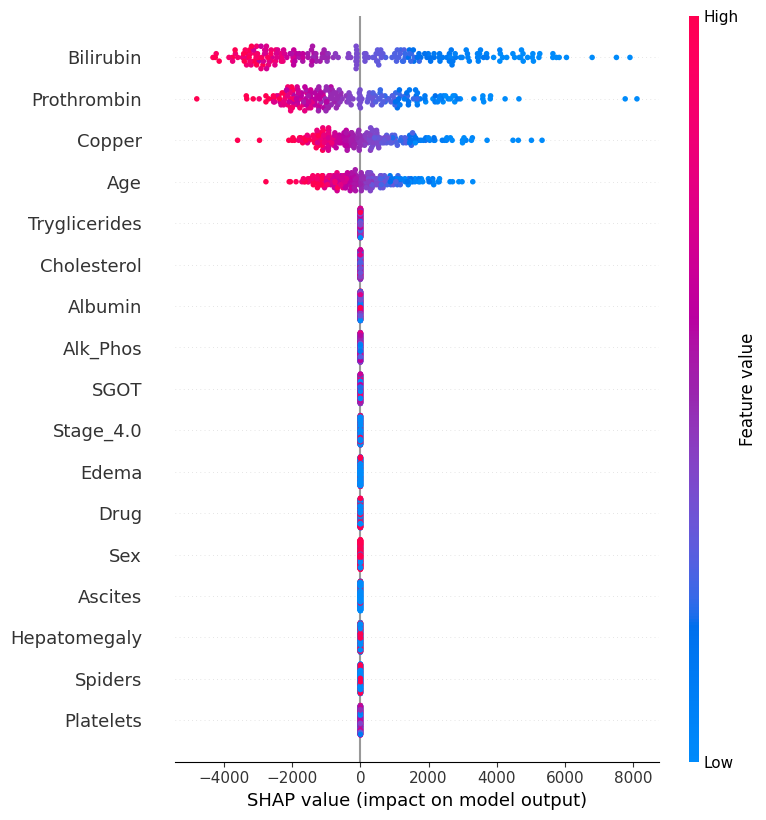

In [195]:
##################################
# Plotting the SHAP summary plot
##################################
shap.summary_plot(shap_values_loglogistic, 
                  cirrhosis_survival_train_modeling.iloc[:, 2:])

## 1.7. Consolidated Findings <a class="anchor" id="1.7"></a>

1. In the context of accelerated failure time models, the choice of distribution is crucial as it impacts the estimation of survival times and the interpretation of covariate effects. Factors to consider include the nature of the data, the properties of the distributions, and the model fit.
    * [Weibull distribution](https://lifelines.readthedocs.io/en/latest/fitters/regression/WeibullAFTFitter.html) is suitable for data where the hazard function is either monotonically increasing or decreasing. It can model both increasing hazard (positive shape parameter) and decreasing hazard (negative shape parameter).
    * [Log-Normal distribution](https://lifelines.readthedocs.io/en/latest/fitters/regression/LogNormalAFTFitter.html) is appropriate when the logarithm of the survival times follows a normal distribution. It is useful for data where the hazard rate initially increases and then decreases.
    * [Log-Logistic distribution](https://lifelines.readthedocs.io/en/latest/fitters/regression/LogLogisticAFTFitter.html) is suitable when the hazard function initially increases and then decreases. It can accommodate both heavy-tailed distributions and distributions with a decreasing hazard rate at larger time values. 
2. Several metrics are available for evaluating the performance of accelerated failure time models, each with strengths and weaknesses.
    * [Concordance index](https://lifelines.readthedocs.io/en/latest/lifelines.utils.html) provides a measure of discriminative ability and useful for ranking predictions. However, it does not provide information on the magnitude of errors and may be insensitive to the calibration of predicted survival probabilities.
    * [Mean absolute error](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_absolute_error.html) is intuitive and easy to interpret while providing a direct measure of prediction accuracy. However, it may be sensitive to outliers and does not consider the probabilistic nature of survival predictions.
    * [Brier score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.brier_score_loss.html) considers both discrimination and calibration, while reflecting the accuracy of predicted survival probabilities. However, it requires specifying a time point and aggregating scores over time points may be less interpretable.
3. Comparing all results from the accelerated failure time models formulated, the most viable model for prediction using the MAE metric was determined as:
    * [Weibull distribution](https://lifelines.readthedocs.io/en/latest/fitters/regression/WeibullAFTFitter.html)
        * Supports a monotonically increasing hazard function which may be more suitable for modeling cirrhosis survival
        * Demonstrated one of the best independent cross-validated (**MAE** = 2303.605628) and test (**MAE** = 1948.873380) model performance 
        * Showed minimal overfit between the train (**MAE** = 2280.743783) and cross-validated (**MAE** = 2303.605628) model performance
        * Selected a sufficient number of predictors (3 out of 17)
        * Identified a sufficient number of statistically significant predictors (3 out of 17):
            * <span style="color: #FF0000">Bilirubin</span>: Increase in value associated with a decrease in time to event 
            * <span style="color: #FF0000">Prothrombin</span>: Increase in value associated with a decrease in time to event 
            * <span style="color: #FF0000">Age</span>: Increase in value associated with a decrease in time to event 
        * Survival probability curves estimated for all cases. Shorter median survival times were observed for:
            * Event cases as compared to censored cases
            * Higher values for <span style="color: #FF0000">Bilirubin</span> as compared to lower values
            * Higher values for <span style="color: #FF0000">Prothrombin</span> as compared to lower values
            * Higher values for <span style="color: #FF0000">Age</span> as compared to lower values
        * Obtained **SHAP values** provided an insightful and clear indication of each significant predictor's impact on the lifetime prediction:
            * Higher values for <span style="color: #FF0000">Bilirubin</span> result to the event expected to occur sooner
            * Higher values for <span style="color: #FF0000">Prothrombin</span> result to the event expected to occur sooner
            * Higher values for <span style="color: #FF0000">Age</span> result to the event expected to occur sooner

In [196]:
##################################
# Consolidating all the
# model performance metrics
##################################
model_performance_comparison = pd.concat([aft_weibull_summary, 
                                          aft_lognormal_summary,
                                          aft_loglogistic_summary], 
                                         axis=0,
                                         ignore_index=True)
print('Accelerated Failure Time Model Comparison: ')
display(model_performance_comparison)

Accelerated Failure Time Model Comparison: 


,Set,Metric,Value,Method
0,Train,Concordance.Index,0.829080,AFT_WEIBULL
1,Cross-Validation,Concordance.Index,0.825008,AFT_WEIBULL
2,Test,Concordance.Index,0.852608,AFT_WEIBULL
3,Train,MAE,2280.743783,AFT_WEIBULL
4,Cross-Validation,MAE,2303.605628,AFT_WEIBULL
5,Test,MAE,1948.873380,AFT_WEIBULL
6,Train,Brier.Score,0.515148,AFT_WEIBULL
7,Cross-Validation,Brier.Score,0.512583,AFT_WEIBULL
8,Test,Brier.Score,0.537556,AFT_WEIBULL
9,Train,Concordance.Index,0.841352,AFT_LOGNORMAL


In [197]:
##################################
# Consolidating the concordance indices
# for all sets and models
##################################
set_labels = ['Train','Cross-Validation','Test']
aft_weibull_ci = model_performance_comparison[((model_performance_comparison['Set'] == 'Train') |
                                               (model_performance_comparison['Set'] == 'Cross-Validation') |
                                               (model_performance_comparison['Set'] == 'Test')) & 
                                              (model_performance_comparison['Metric']=='Concordance.Index') &
                                              (model_performance_comparison['Method']=='AFT_WEIBULL')]['Value'].values
aft_lognormal_ci = model_performance_comparison[((model_performance_comparison['Set'] == 'Train') |
                                               (model_performance_comparison['Set'] == 'Cross-Validation') |
                                               (model_performance_comparison['Set'] == 'Test')) & 
                                              (model_performance_comparison['Metric']=='Concordance.Index') &
                                              (model_performance_comparison['Method']=='AFT_LOGNORMAL')]['Value'].values
aft_loglogistic_ci = model_performance_comparison[((model_performance_comparison['Set'] == 'Train') |
                                               (model_performance_comparison['Set'] == 'Cross-Validation') |
                                               (model_performance_comparison['Set'] == 'Test')) & 
                                              (model_performance_comparison['Metric']=='Concordance.Index') &
                                              (model_performance_comparison['Method']=='AFT_LOGLOGISTIC')]['Value'].values

In [198]:
##################################
# Plotting the values for the
# concordance indices
# for all models
##################################
ci_plot = pd.DataFrame({'AFT_WEIBULL': list(aft_weibull_ci),
                        'AFT_LOGNORMAL': list(aft_lognormal_ci),
                        'AFT_LOGLOGISTIC': list(aft_loglogistic_ci)},
                       index = set_labels)
display(ci_plot)

,AFT_WEIBULL,AFT_LOGNORMAL,AFT_LOGLOGISTIC
Train,0.829080,0.841352,0.838345
Cross-Validation,0.825008,0.825576,0.830128
Test,0.852608,0.875283,0.862585


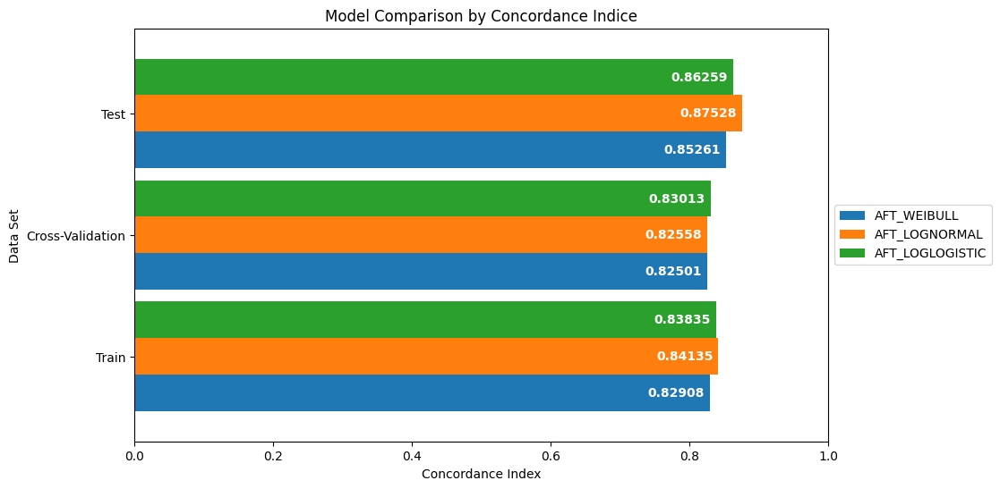

In [199]:
##################################
# Plotting all the concordance indices
# for all models
##################################
ci_plot = ci_plot.plot.barh(figsize=(10, 6), width=0.90)
ci_plot.set_xlim(0.00,1.00)
ci_plot.set_title("Model Comparison by Concordance Indice")
ci_plot.set_xlabel("Concordance Index")
ci_plot.set_ylabel("Data Set")
ci_plot.grid(False)
ci_plot.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
for container in ci_plot.containers:
    ci_plot.bar_label(container, fmt='%.5f', padding=-50, color='white', fontweight='bold')

In [200]:
##################################
# Consolidating the mean absolute errors
# for all sets and models
##################################
set_labels = ['Train','Cross-Validation','Test']
aft_weibull_mae = model_performance_comparison[((model_performance_comparison['Set'] == 'Train') |
                                               (model_performance_comparison['Set'] == 'Cross-Validation') |
                                               (model_performance_comparison['Set'] == 'Test')) & 
                                              (model_performance_comparison['Metric']=='MAE') &
                                              (model_performance_comparison['Method']=='AFT_WEIBULL')]['Value'].values
aft_lognormal_mae = model_performance_comparison[((model_performance_comparison['Set'] == 'Train') |
                                               (model_performance_comparison['Set'] == 'Cross-Validation') |
                                               (model_performance_comparison['Set'] == 'Test')) & 
                                              (model_performance_comparison['Metric']=='MAE') &
                                              (model_performance_comparison['Method']=='AFT_LOGNORMAL')]['Value'].values
aft_loglogistic_mae = model_performance_comparison[((model_performance_comparison['Set'] == 'Train') |
                                               (model_performance_comparison['Set'] == 'Cross-Validation') |
                                               (model_performance_comparison['Set'] == 'Test')) & 
                                              (model_performance_comparison['Metric']=='MAE') &
                                              (model_performance_comparison['Method']=='AFT_LOGLOGISTIC')]['Value'].values

In [201]:
##################################
# Plotting the values for the
# mean absolute errors
# for all models
##################################
mae_plot = pd.DataFrame({'AFT_WEIBULL': list(aft_weibull_mae),
                         'AFT_LOGNORMAL': list(aft_lognormal_mae),
                         'AFT_LOGLOGISTIC': list(aft_loglogistic_mae)},
                       index = set_labels)
display(mae_plot)

,AFT_WEIBULL,AFT_LOGNORMAL,AFT_LOGLOGISTIC
Train,2280.743783,2518.359385,2727.465086
Cross-Validation,2303.605628,2502.636955,2711.660486
Test,1948.873380,1904.987987,2189.932314


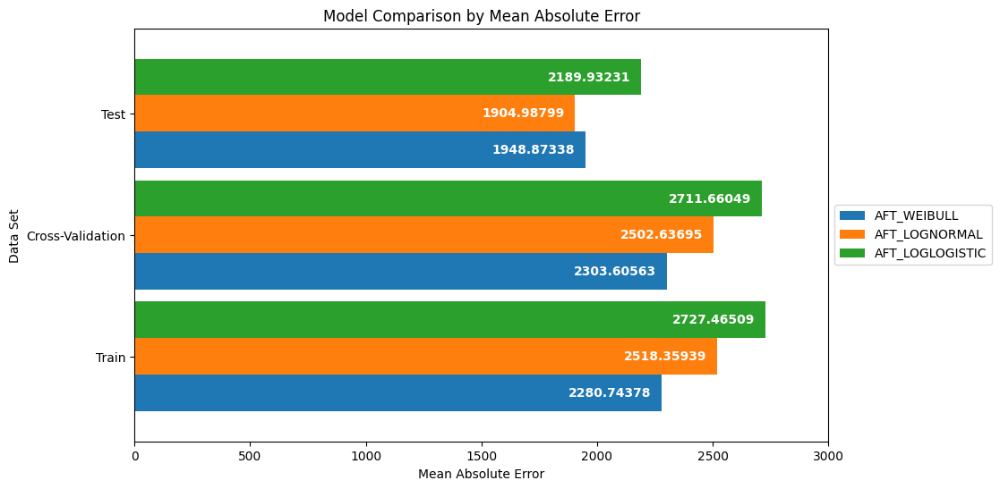

In [202]:
##################################
# Plotting all the mean absolute errors
# for all models
##################################
mae_plot = mae_plot.plot.barh(figsize=(10, 6), width=0.90)
mae_plot.set_xlim(0.00,3000.00)
mae_plot.set_title("Model Comparison by Mean Absolute Error")
mae_plot.set_xlabel("Mean Absolute Error")
mae_plot.set_ylabel("Data Set")
mae_plot.grid(False)
mae_plot.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
for container in mae_plot.containers:
    mae_plot.bar_label(container, fmt='%.5f', padding=-75, color='white', fontweight='bold')

In [203]:
##################################
# Consolidating the brier scores
# for all sets and models
##################################
set_labels = ['Train','Cross-Validation','Test']
aft_weibull_brier_score = model_performance_comparison[((model_performance_comparison['Set'] == 'Train') |
                                               (model_performance_comparison['Set'] == 'Cross-Validation') |
                                               (model_performance_comparison['Set'] == 'Test')) & 
                                              (model_performance_comparison['Metric']=='Brier.Score') &
                                              (model_performance_comparison['Method']=='AFT_WEIBULL')]['Value'].values
aft_lognormal_brier_score = model_performance_comparison[((model_performance_comparison['Set'] == 'Train') |
                                               (model_performance_comparison['Set'] == 'Cross-Validation') |
                                               (model_performance_comparison['Set'] == 'Test')) & 
                                              (model_performance_comparison['Metric']=='Brier.Score') &
                                              (model_performance_comparison['Method']=='AFT_LOGNORMAL')]['Value'].values
aft_loglogistic_brier_score = model_performance_comparison[((model_performance_comparison['Set'] == 'Train') |
                                               (model_performance_comparison['Set'] == 'Cross-Validation') |
                                               (model_performance_comparison['Set'] == 'Test')) & 
                                              (model_performance_comparison['Metric']=='Brier.Score') &
                                              (model_performance_comparison['Method']=='AFT_LOGLOGISTIC')]['Value'].values

In [204]:
##################################
# Plotting the values for the
# brier scores
# for all models
##################################
brier_score_plot = pd.DataFrame({'AFT_WEIBULL': list(aft_weibull_brier_score),
                                 'AFT_LOGNORMAL': list(aft_lognormal_brier_score),
                                 'AFT_LOGLOGISTIC': list(aft_loglogistic_brier_score)},
                       index = set_labels)
display(brier_score_plot)

,AFT_WEIBULL,AFT_LOGNORMAL,AFT_LOGLOGISTIC
Train,0.515148,0.547041,0.509528
Cross-Validation,0.512583,0.542583,0.506538
Test,0.537556,0.577502,0.533296


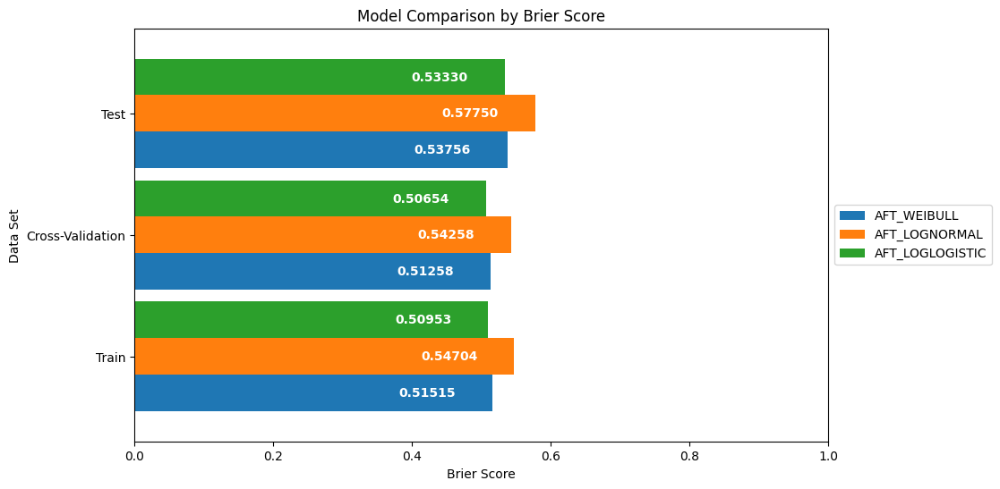

In [205]:
##################################
# Plotting all the mean absolute errors
# for all models
##################################
brier_score_plot = brier_score_plot.plot.barh(figsize=(10, 6), width=0.90)
brier_score_plot.set_xlim(0.00,1.00)
brier_score_plot.set_title("Model Comparison by Brier Score")
brier_score_plot.set_xlabel("Brier Score")
brier_score_plot.set_ylabel("Data Set")
brier_score_plot.grid(False)
brier_score_plot.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
for container in brier_score_plot.containers:
    brier_score_plot.bar_label(container, fmt='%.5f', padding=-75, color='white', fontweight='bold')

# 2. Summary <a class="anchor" id="Summary"></a>

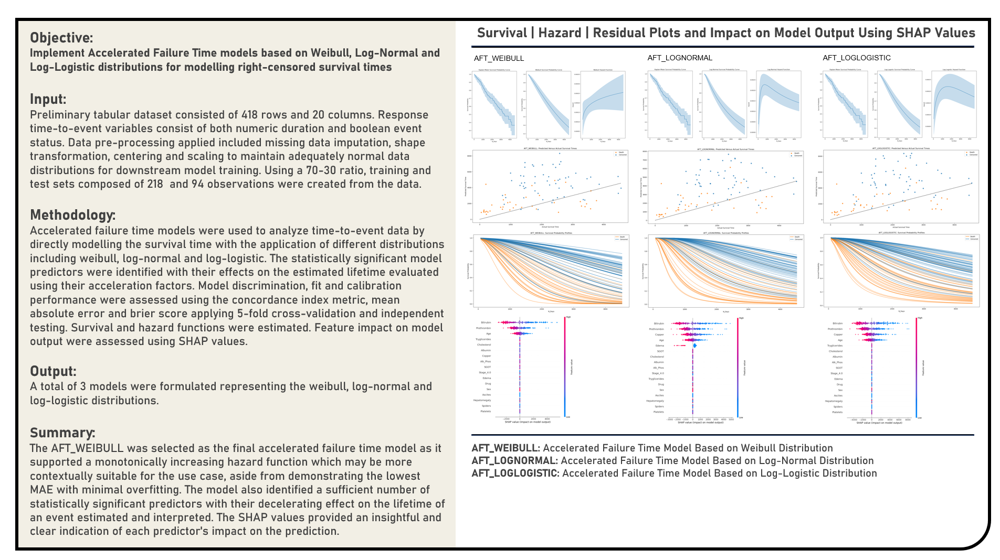

# 3. References <a class="anchor" id="References"></a>

* **[Book]** [Clinical Prediction Models](http://clinicalpredictionmodels.org/) by Ewout Steyerberg
* **[Book]** [Survival Analysis: A Self-Learning Text](https://link.springer.com/book/10.1007/978-1-4419-6646-9/) by David Kleinbaum and Mitchel Klein
* **[Book]** [Applied Survival Analysis Using R](https://link.springer.com/book/10.1007/978-3-319-31245-3/) by Dirk Moore
* **[Book]** [Survival Analysis with Python](https://www.taylorfrancis.com/books/mono/10.1201/9781003255499/survival-analysis-python-avishek-nag) by Avishek Nag
* **[Python Library API]** [SciKit-Survival](https://pypi.org/project/scikit-survival/) by SciKit-Survival Team
* **[Python Library API]** [SciKit-Learn](https://scikit-learn.org/stable/index.html) by SciKit-Learn Team
* **[Python Library API]** [StatsModels](https://www.statsmodels.org/stable/index.html) by StatsModels Team
* **[Python Library API]** [SciPy](https://scipy.org/) by SciPy Team
* **[Python Library API]** [Lifelines](https://lifelines.readthedocs.io/en/latest/) by Lifelines Team
* **[Kaggle Project]** [Applied Reliability, Solutions To Problems](https://www.kaggle.com/code/keenanzhuo/applied-reliability-solutions-to-problems) by Keenan Zhuo (Kaggle)
* **[Kaggle Project]** [Survival Models VS ML Models Benchmark - Churn Tel](https://www.kaggle.com/code/caralosal/survival-models-vs-ml-models-benchmark-churn-tel) by Carlos Alonso Salcedo (Kaggle)
* **[Kaggle Project]** [Survival Analysis with Cox Model Implementation](https://www.kaggle.com/code/bryanb/survival-analysis-with-cox-model-implementation/notebook) by Bryan Boulé (Kaggle)
* **[Kaggle Project]** [Survival Analysis](https://www.kaggle.com/code/gunesevitan/survival-analysis/notebook) by Gunes Evitan (Kaggle)
* **[Kaggle Project]** [Survival Analysis of Lung Cancer Patients](https://www.kaggle.com/code/bryanb/survival-analysis-with-cox-model-implementation/notebook) by Sayan Chakraborty (Kaggle)
* **[Kaggle Project]** [COVID-19 Cox Survival Regression](https://www.kaggle.com/code/bryanb/survival-analysis-with-cox-model-implementation/notebook) by Ilias Katsabalos (Kaggle)
* **[Kaggle Project]** [Liver Cirrhosis Prediction with XGboost & EDA](https://www.kaggle.com/code/arjunbhaybhang/liver-cirrhosis-prediction-with-xgboost-eda) by Arjun Bhaybang (Kaggle)
* **[Article]** [Survival Analysis](https://quantdev.ssri.psu.edu/resources/survival-analysis) by Jessica Lougheed and Lizbeth Benson (QuantDev.SSRI.PSU.Edu)
* **[Article]** [Part 1: How to Format Data for Several Types of Survival Analysis Models](https://quantdev.ssri.psu.edu/tutorials/part-1-how-format-data-several-types-survival-analysis-models) by Jessica Lougheed and Lizbeth Benson (QuantDev.SSRI.PSU.Edu)
* **[Article]** [Part 2: Single-Episode Cox Regression Model with Time-Invariant Predictors](https://quantdev.ssri.psu.edu/tutorials/part-2-single-episode-cox-regression-model-time-invariant-predictors) by Jessica Lougheed and Lizbeth Benson (QuantDev.SSRI.PSU.Edu)
* **[Article]** [Part 3: Single-Episode Cox Regression Model with Time-Varying Predictors](https://quantdev.ssri.psu.edu/tutorials/part-3-single-episode-cox-regression-model-time-varying-predictors) by Jessica Lougheed and Lizbeth Benson (QuantDev.SSRI.PSU.Edu)
* **[Article]** [Part 4: Recurring-Episode Cox Regression Model with Time-Invariant Predictors](https://quantdev.ssri.psu.edu/tutorials/part-4-recurring-episode-cox-regression-model-time-invariant-predictors) by Jessica Lougheed and Lizbeth Benson (QuantDev.SSRI.PSU.Edu)
* **[Article]** [Part 5: Recurring-Episode Cox Regression Model with Time-Varying Predictors](https://quantdev.ssri.psu.edu/tutorials/part-5-recurring-episode-cox-regression-model-time-varying-predictors) by Jessica Lougheed and Lizbeth Benson (QuantDev.SSRI.PSU.Edu)
* **[Article]** [Parametric Survival Modeling](https://devinincerti.com/2019/06/18/parametric_survival.html) by Devin Incerti (DevinIncerti.Com)
* **[Article]** [Survival Analysis Simplified: Explaining and Applying with Python](https://medium.com/@zynp.atlii/survival-analysis-simplified-explaining-and-applying-with-python-7efacf86ba32) by Zeynep Atli (Medium)
* **[Article]** [Exploring Time-to-Event with Survival Analysis](https://towardsdatascience.com/exploring-time-to-event-with-survival-analysis-8b0a7a33a7be) by 
Olivia Tanuwidjaja (Medium)
* **[Article]** [Understanding Survival Analysis Models: Bridging the Gap between Parametric and Semiparametric Approaches](https://medium.com/@zynp.atlii/understanding-survival-analysis-models-bridging-the-gap-between-parametric-and-semiparametric-923cdcfc9f05) by Zeynep Atli (Medium)
* **[Article]** [Survival Analysis in Python (KM Estimate, Cox-PH and AFT Model)](https://medium.com/the-researchers-guide/survival-analysis-in-python-km-estimate-cox-ph-and-aft-model-5533843c5d5d) by Rahul Raoniar (Medium)
* **[Article]** [Survival Modeling — Accelerated Failure Time — XGBoost](https://towardsdatascience.com/survival-modeling-accelerated-failure-time-xgboost-971aaa1ba794) by Avinash Barnwal (Medium)
* **[Publication]** [Marginal Likelihoods Based on Cox's Regression and Life Model](https://www.jstor.org/stable/2334538) by Jack Kalbfleisch and Ross Prentice (Biometrika)
* **[Publication]** [Hazard Rate Models with Covariates](https://www.jstor.org/stable/2529934) by Jack Kalbfleisch and Ross Prentice (Biometrics)
* **[Publication]** [Linear Regression with Censored Data](https://www.jstor.org/stable/2335161) by Jonathan Buckley and Ian James (Biometrika)
* **[Publication]** [A Statistical Distribution Function of Wide Applicability](https://www.semanticscholar.org/paper/A-Statistical-Distribution-Function-of-Wide-Weibull/88c37770028e7ed61180a34d6a837a9a4db3b264) by Waloddi Weibull (Journal of Applied Mechanics)
* **[Publication]** [Exponential Survivals with Censoring and Explanatory Variables](https://www.jstor.org/stable/2334539) by Ross Prentice (Biometrika)
* **[Publication]** [The Lognormal Distribution, with Special Reference to its Uses in Economics](https://www.semanticscholar.org/paper/The-Lognormal-Distribution%2C-with-Special-Reference-Corlett-Aitchison/1f59c53ff512fa77e7aee5e6d98b1786c2aaf129) by John Aitchison and James Brown (Economics Applied Statistics)
* **[Course]** [Survival Analysis in Python](https://app.datacamp.com/learn/courses/survival-analysis-in-python) by Shae Wang (DataCamp)

In [206]:
from IPython.display import display, HTML
display(HTML("<style>.rendered_html { font-size: 15px; font-family: 'Trebuchet MS'; }</style>"))